In [1]:
!pip install --upgrade ipywidgets
!pip install --upgrade stanza
!pip install --upgrade tqdm

Defaulting to user installation because normal site-packages is not writeable
    sys-platform (=="darwin") ; extra == 'objc'
                 ~^
Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 586.9/586.9 kB 15.4 MB/s eta 0:00:00
    sys-platform (=="darwin") ; extra == 'objc'
                 ~^
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.5.0
    Uninstalling typing_extensions-4.5.0:
      Successfully uninstalled typing_extensions-4.5.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 1.4.7 requires numpy>=1.24.4, but you have numpy 1.23.4 which is incompatible.
autotrain-advanced 0.7.118 requires accelerate==0.30.1, but you have accelerate 0.21.

In [2]:
import os
from transformers import AutoTokenizer, AutoConfig, AutoModelForCausalLM
import json

test_data_path = '../Datasets/opp115/test.json'
model_path = "/data/bhavani/DeCompressed/FineTuning_11/my-llama2-chat-hf-llm"

# Load the test data file and count the number of entries
with open(test_data_path, 'r') as file:
    test_data = json.load(file)
    num_entries = len(test_data) 


In [3]:
tokenizer = AutoTokenizer.from_pretrained(model_path)
config = AutoConfig.from_pretrained(model_path)

try:
    model = AutoModelForCausalLM.from_pretrained(
        model_path,
        load_in_8bit=True,  
        device_map="auto"
    )
    print("Model loaded and quantized successfully.")
except Exception as e:
    print("Quantization failed:", e)

model.eval()

quantized_model_path = "./Quantized_Models/llama2-quantized_11"

os.makedirs(quantized_model_path, exist_ok=True)

try:
    model.save_pretrained(quantized_model_path)
    tokenizer.save_pretrained(quantized_model_path)

    print("Quantized model, config.json, and tokenizer saved successfully.")
except Exception as e:
    print("Failed to save quantized model, config, or tokenizer:", e)


[2024-12-28 09:57:28,054] [INFO] [real_accelerator.py:203:get_accelerator] Setting ds_accelerator to cuda (auto detect)
 [WARNING]  async_io requires the dev libaio .so object and headers but these were not found.
 [WARNING]  async_io: please install the libaio-dev package with apt
 [WARNING]  If libaio is already installed (perhaps from source), try setting the CFLAGS and LDFLAGS environment variables to where it can be found.
 [WARNING]  Please specify the CUTLASS repo directory as environment variable $CUTLASS_PATH


/usr/bin/ld: cannot find -laio: No such file or directory
collect2: error: ld returned 1 exit status


 [WARNING]  sparse_attn requires a torch version >= 1.5 and < 2.0 but detected 2.3
 [WARNING]  using untested triton version (2.3.0), only 1.0.0 is known to be compatible


2024-12-28 09:57:29.131428: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-28 09:57:29.825698: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
The `load_in_4bit` and `load_in_8bit` arguments are deprecated and will be removed in the future versions. Please, pass a `BitsAndBytesConfig` object in `quantization_config` argument instead.


Loading checkpoint shards:   0%|          | 0/6 [00:00<?, ?it/s]

Model loaded and quantized successfully.
Quantized model, config.json, and tokenizer saved successfully.


In [4]:
quantized_model_path = "./Quantized_Models/llama2-quantized_11"
tokenizer = AutoTokenizer.from_pretrained(quantized_model_path)
model = AutoModelForCausalLM.from_pretrained(
    quantized_model_path,
    device_map="auto",  
    load_in_8bit=True  
)

The `load_in_4bit` and `load_in_8bit` arguments are deprecated and will be removed in the future versions. Please, pass a `BitsAndBytesConfig` object in `quantization_config` argument instead.
Unused kwargs: ['_load_in_4bit', '_load_in_8bit', 'quant_method']. These kwargs are not used in <class 'transformers.utils.quantization_config.BitsAndBytesConfig'>.


/home/bhavani/.local/lib/python3.10/site-packages/transformers/quantizers/auto.py:167: UserWarning: You passed `quantization_config` or equivalent parameters to `from_pretrained` but the model you're loading already has a `quantization_config` attribute. The `quantization_config` from the model will be used.
  warnings.warn(warning_msg)


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

/home/bhavani/.local/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/home/bhavani/.local/lib/python3.10/site-packages/torchvision/image.so: undefined symbol: _ZN3c1017RegisterOperatorsD1Ev'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
Unused kwargs: ['_load_in_4bit', '_load_in_8bit', 'quant_method']. These kwargs are not used in <class 'transformers.utils.quantization_config.BitsAndBytesConfig'>.
`low_cpu_mem_usage` was None, now set to True since model is quantized.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

/home/bhavani/.local/lib/python3.10/site-packages/transformers/generation/utils.py:1797: UserWarning: You are calling .generate() with the `input_ids` being on a device type different than your model's device. `input_ids` is on cpu, whereas the model is on cuda. You may experience unexpected behaviors or slower generation. Please make sure that you have put `input_ids` to the correct device by calling for example input_ids = input_ids.to('cuda') before running `.generate()`.
  warnings.warn(


Generated new tokens: Other
['▁Other']
Elapsed Time: 4.969036102294922
New tokens generated: 1
Tokens generated per second: 0.20 tokens/s
Predicted categories:['Other']
Privacy Policy Text: PRIVACY POLICY    Buffalo Wild Wings, Inc., its franchisees, marketing agencies, and affiliated contractors, as specifically identified here (collectively "BWW," "we" or "us"), appreciate your patronage and take your privacy very seriously. As a result, we've developed the following policy terms which apply to all websites and mobile applications owned and operated by BWW, specifically including the buffalowildwings.com site and the Fight4Fandom Mobile App (collectively the "Site(s)").
Actual Category: ['Other']
Predicted Categories: ['Other']

Generated new tokens: Other
['▁Other']
Elapsed Time: 4.570477485656738
New tokens generated: 1
Tokens generated per second: 0.22 tokens/s
Predicted categories:['Other']
Privacy Policy Text: We encourage you to read this Privacy Policy carefully to understand 

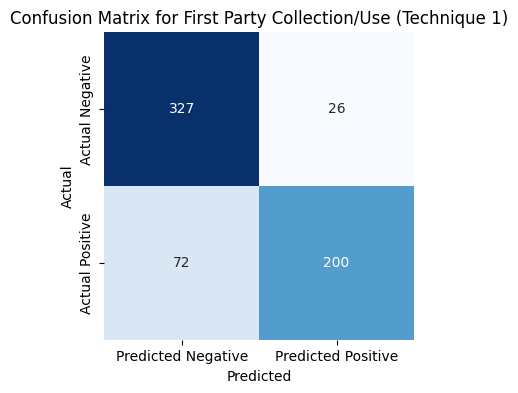


Plotting confusion matrix for category: Third Party Sharing/Collection


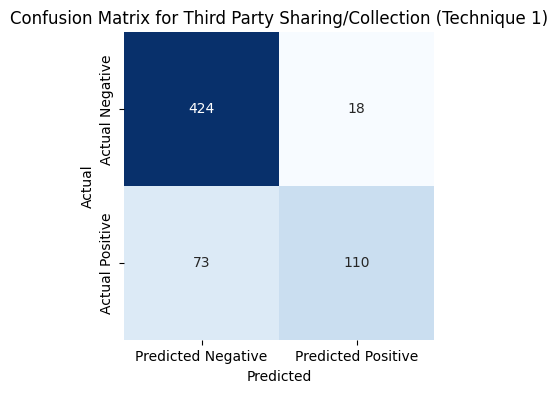


Plotting confusion matrix for category: Other


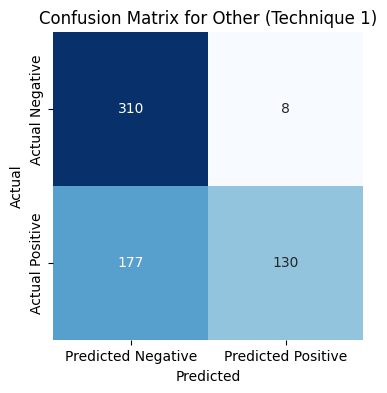


Plotting confusion matrix for category: User Choice/Control


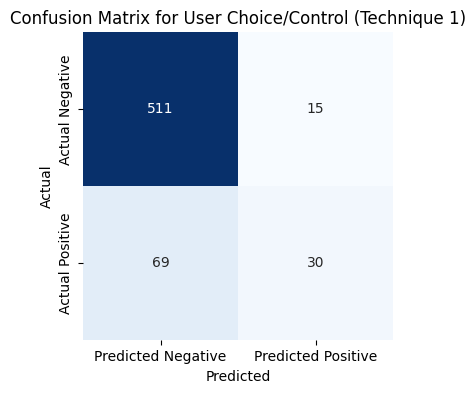


Plotting confusion matrix for category: Do Not Track


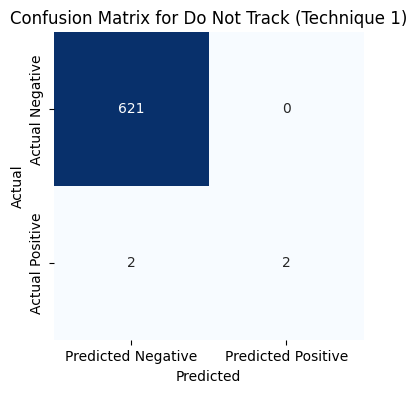


Plotting confusion matrix for category: International and Specific Audiences


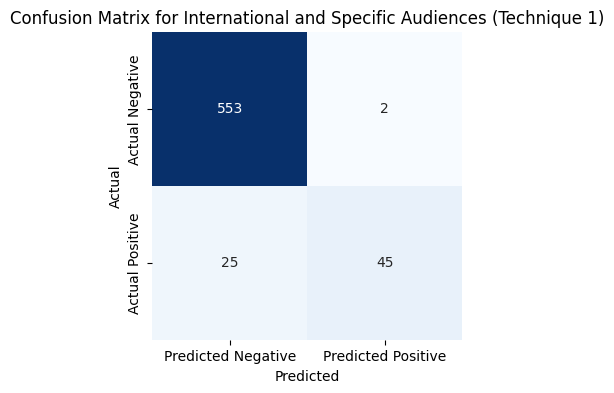


Plotting confusion matrix for category: Data Security


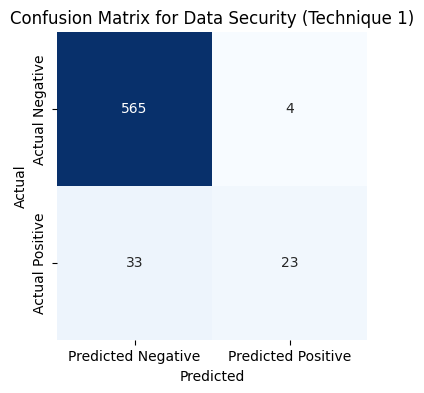


Plotting confusion matrix for category: Policy Change


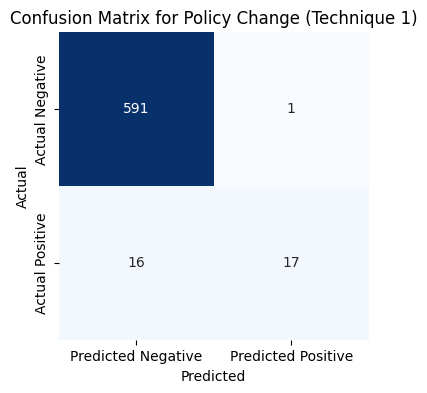


Plotting confusion matrix for category: Data Retention


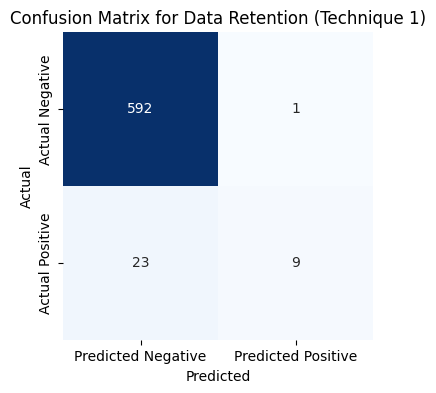


Plotting confusion matrix for category: User Access, Edit and Deletion


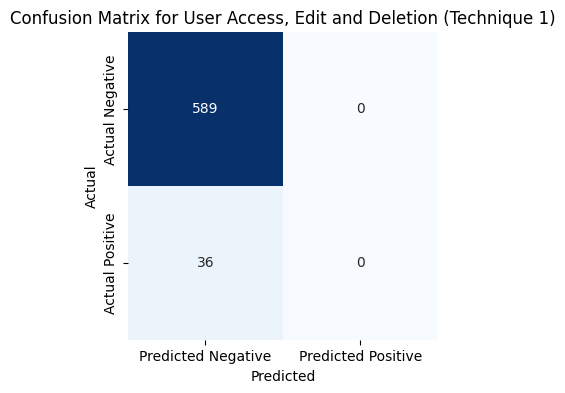


Overall tp: 566
Overall tn: 5083
Overall fp: 75
Overall fn: 526
Overall Precision (Technique 1): 0.8829953198127926
Overall Recall (Technique 1): 0.5183150183150184
Overall F1 Score (Technique 1): 0.6532025389497981
Overall Accuracy (Technique 1): 0.90384
TP 200
TN 327
FP 26
FN 72

TP 110
TN 424
FP 18
FN 73

TP 130
TN 310
FP 8
FN 177

TP 30
TN 511
FP 15
FN 69

TP 2
TN 621
FP 0
FN 2

TP 45
TN 553
FP 2
FN 25

TP 23
TN 565
FP 4
FN 33

TP 17
TN 591
FP 1
FN 16

TP 9
TN 592
FP 1
FN 23

TP 0
TN 589
FP 0
FN 36

Micro Precision: 0.8829953198127926
Micro Recall: 0.5183150183150184
Micro F1 Score: 0.6532025389497981
Micro Accuracy: 0.90384
Macro Precision: 0.8006769509193237
Macro Recall: 0.44128430293048104
Macro F1 Score: 0.5596897077991332
Weighted Precision: 0.8533590980939649
Weighted Recall: 0.5183150183150184
Weighted F1 Score: 0.6335268398446798
Sample Average Precision: 0.8948
Sample Average Recall: 0.6385511111111111
Sample Average F1 Score: 0.7068800000000001

Overall Metrics (Techniq

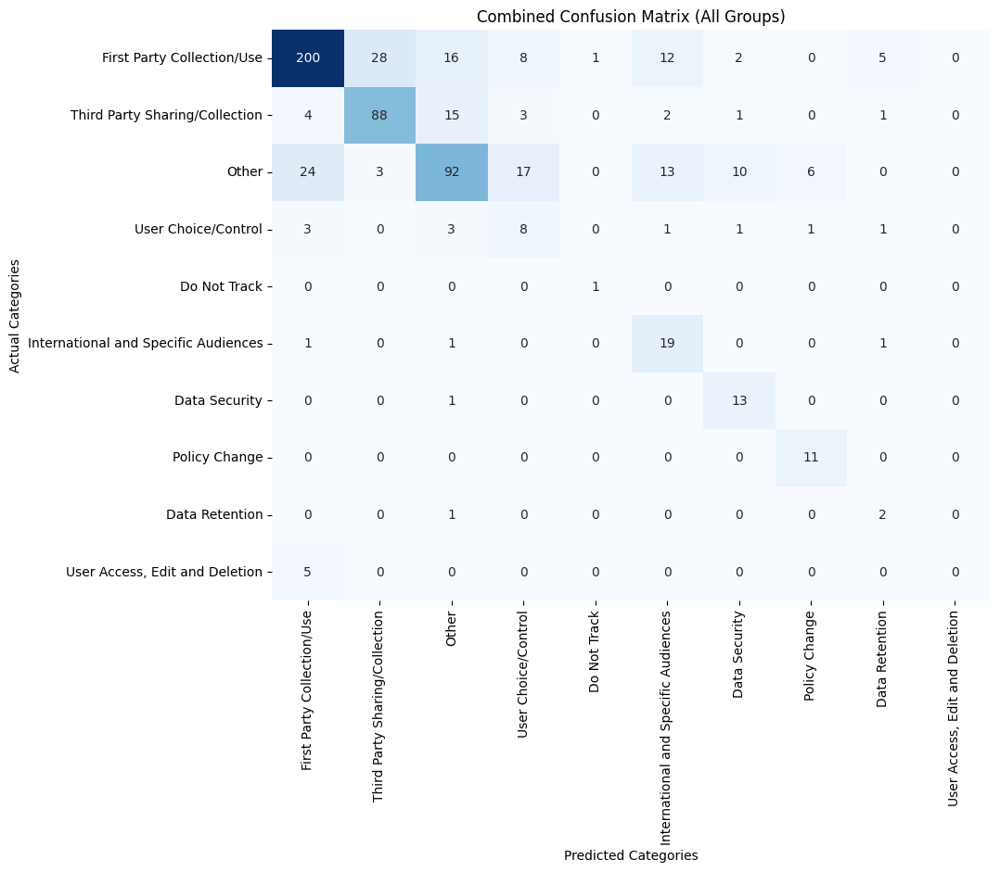


Metrics for Group 1:
Accuracy: 0.9784511784511785
Precision: 0.8922558922558923
Recall: 0.8922558922558923
F1 Score: 0.8922558922558923

Metrics for Group 2:
Accuracy: 0.9780487804878049
Precision: 0.979539641943734
Recall: 0.9318734793187348
F1 Score: 0.9551122194513715

Confusion Matrices for Group 1:


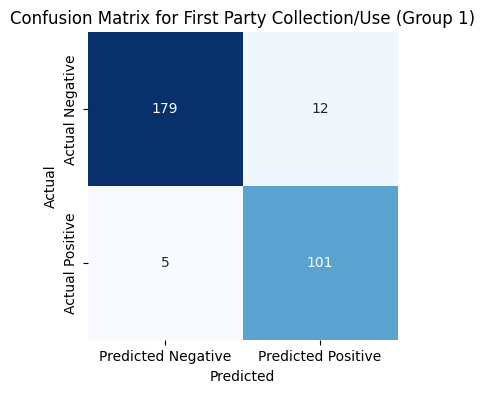

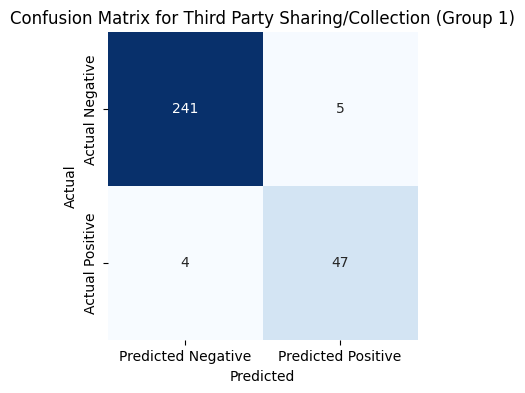

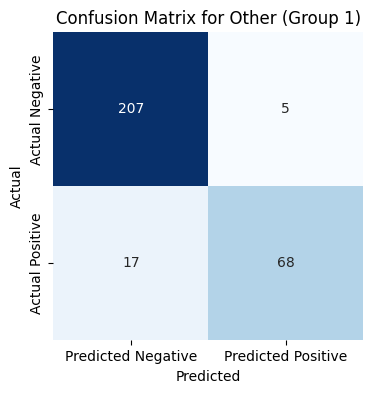

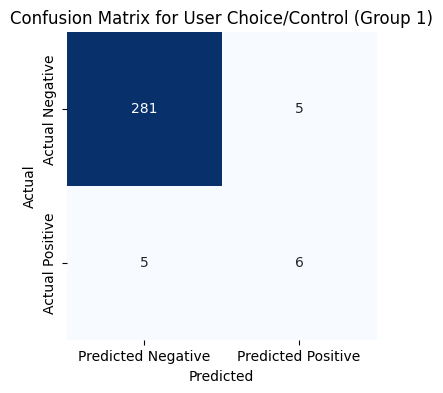

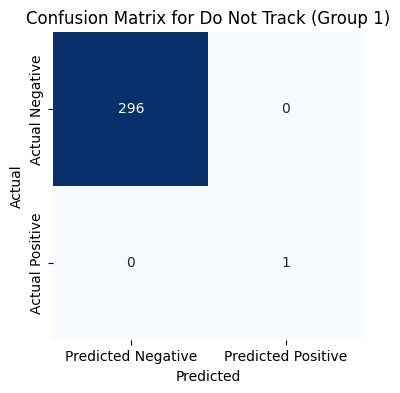

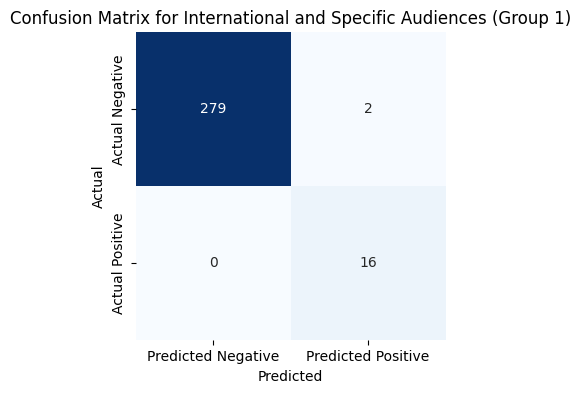

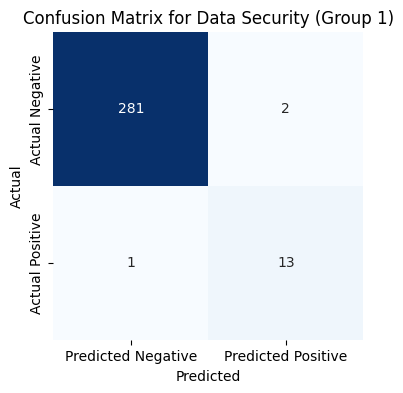

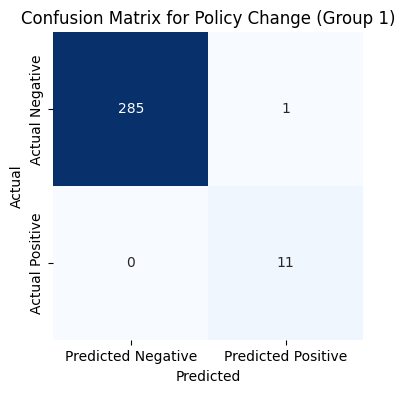

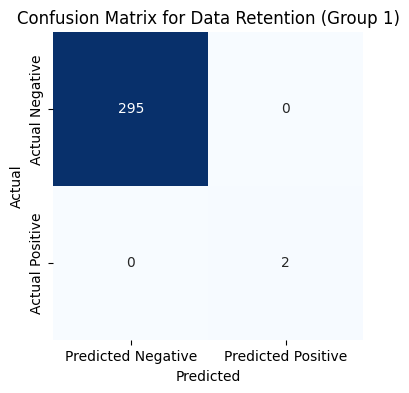

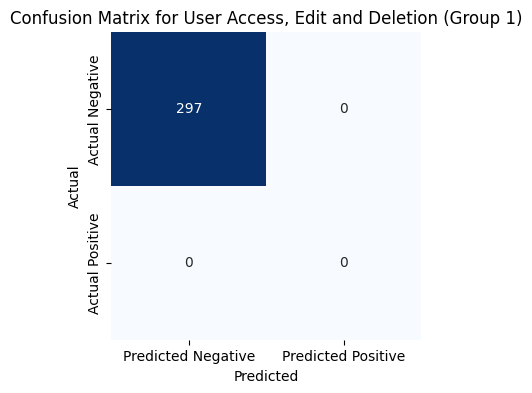


Confusion Matrices for Group 2:


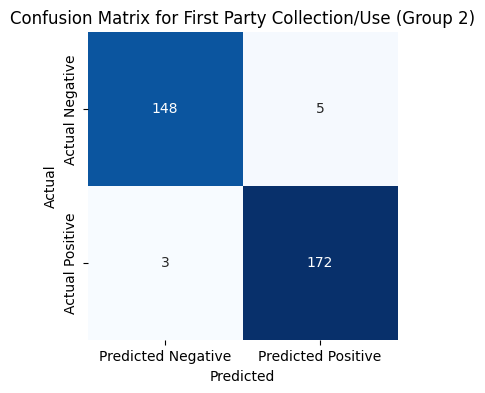

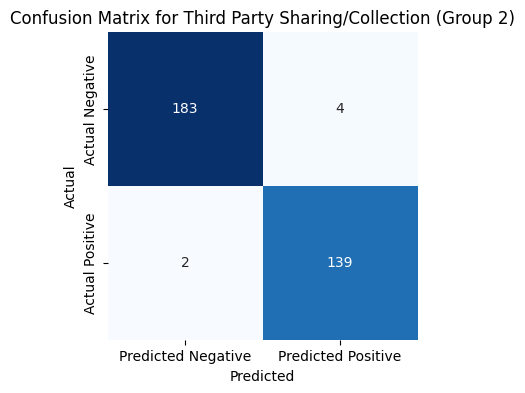

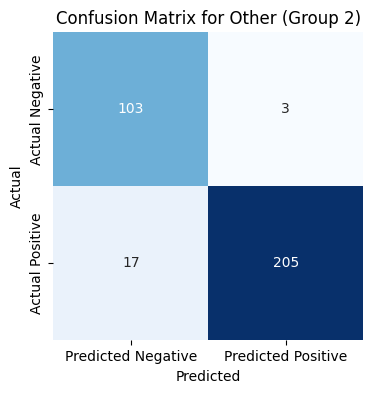

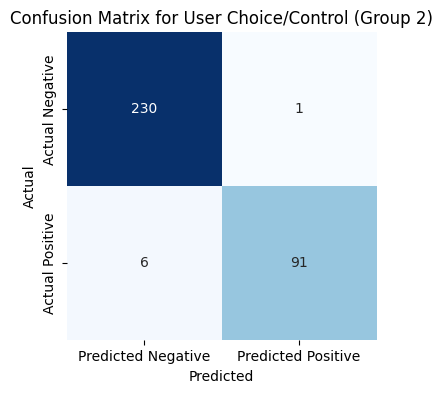

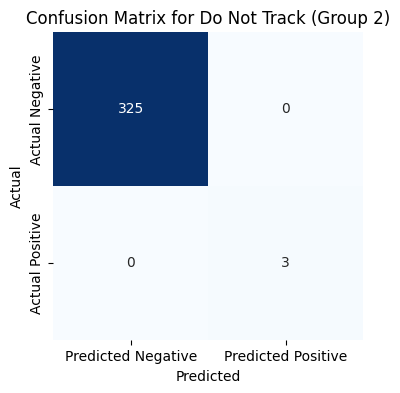

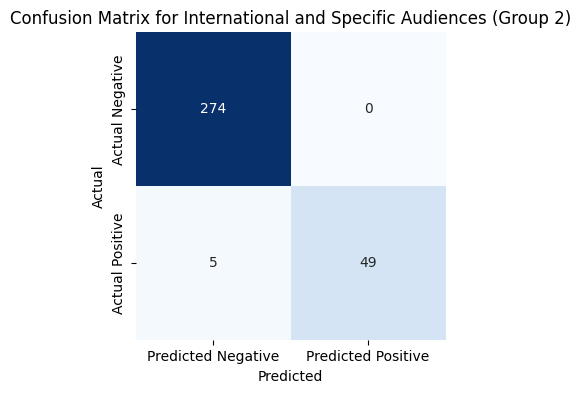

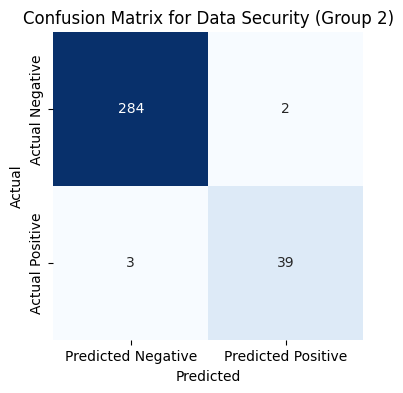

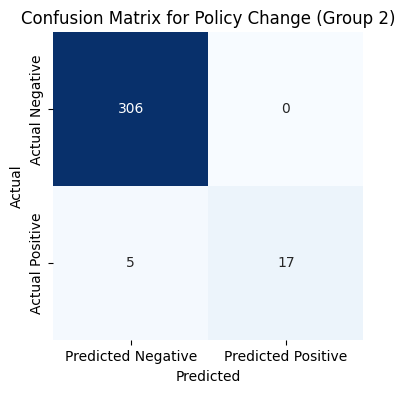

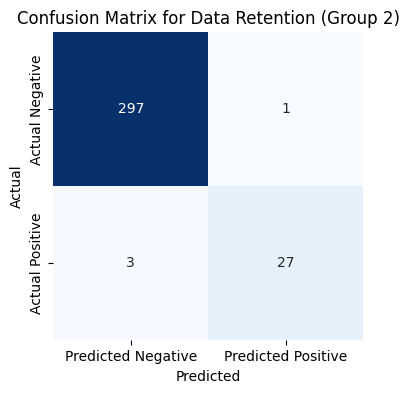

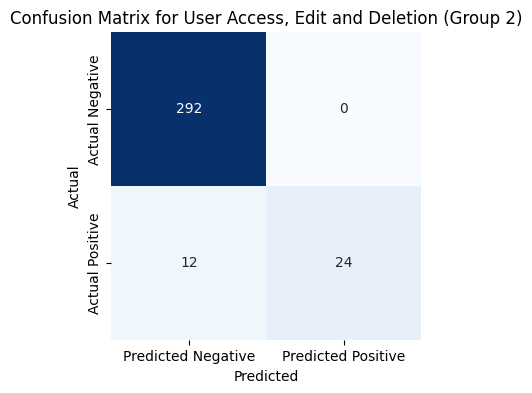


Computing combined overall metrics for Group 1 and Group 2...

Combined Metrics for Group 1 and Group 2:
Overall Accuracy: 0.97824
Overall Precision: 0.9555143651529193
Overall Recall: 0.9213583556747096
Overall F1 Score: 0.9381255686988171
Combined Metrics -> Accuracy: 0.97824, Precision: 0.9555143651529193, Recall: 0.9213583556747096, F1: 0.9381255686988171

Plotting combined confusion matrices for each category (Group 1 + Group 2)...


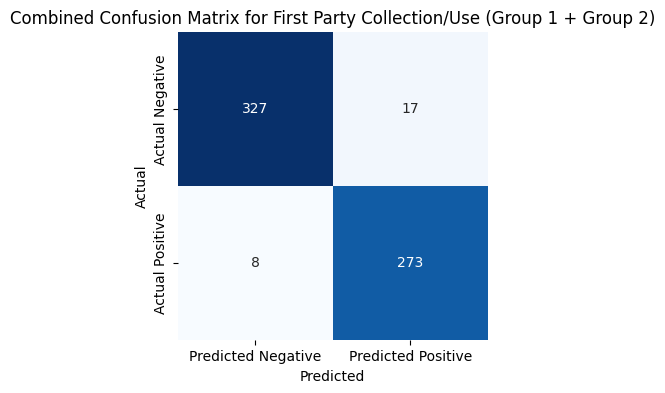


First Party Collection/Use - Combined Confusion Matrix (Group 1 + Group 2):
TP: 273, FP: 17, FN: 8, TN: 327


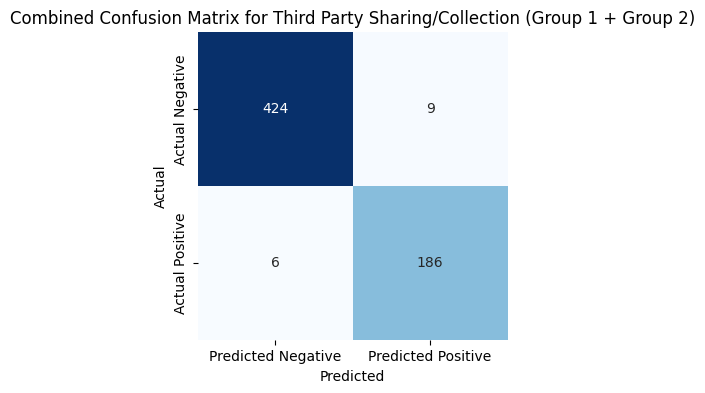


Third Party Sharing/Collection - Combined Confusion Matrix (Group 1 + Group 2):
TP: 186, FP: 9, FN: 6, TN: 424


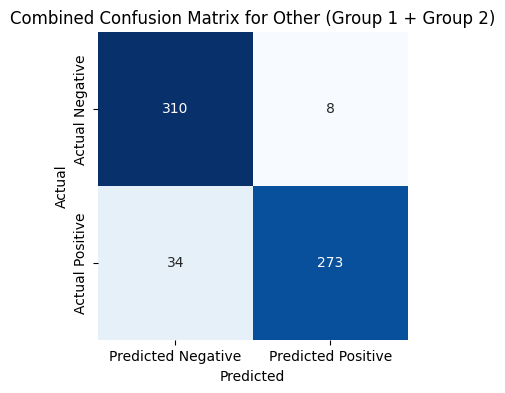


Other - Combined Confusion Matrix (Group 1 + Group 2):
TP: 273, FP: 8, FN: 34, TN: 310


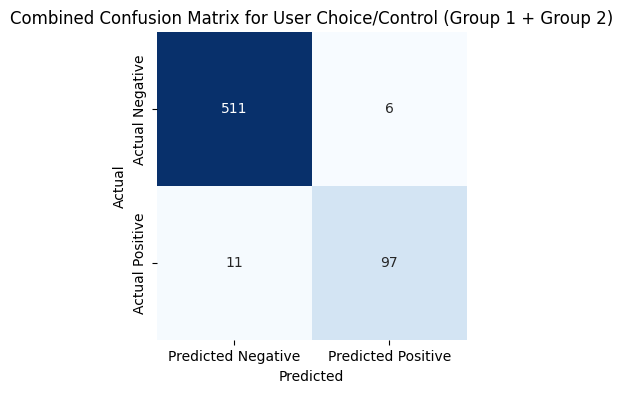


User Choice/Control - Combined Confusion Matrix (Group 1 + Group 2):
TP: 97, FP: 6, FN: 11, TN: 511


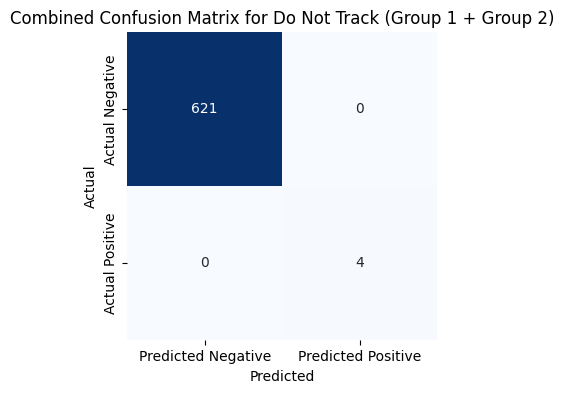


Do Not Track - Combined Confusion Matrix (Group 1 + Group 2):
TP: 4, FP: 0, FN: 0, TN: 621


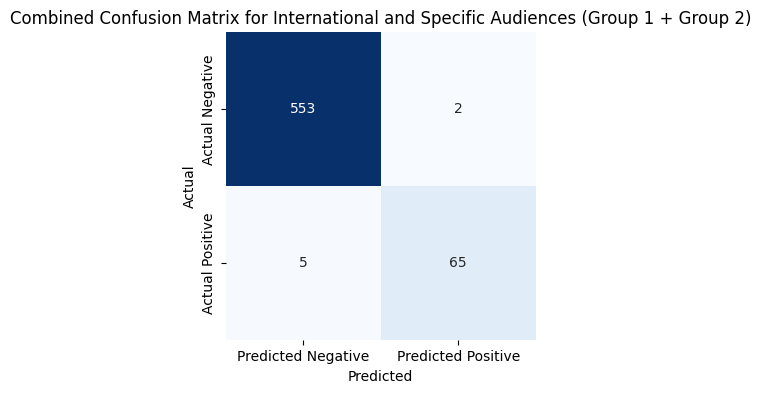


International and Specific Audiences - Combined Confusion Matrix (Group 1 + Group 2):
TP: 65, FP: 2, FN: 5, TN: 553


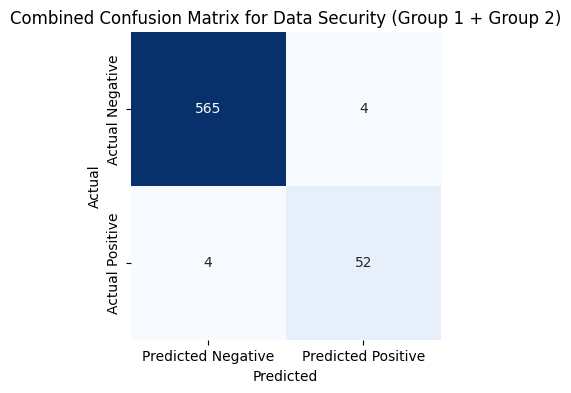


Data Security - Combined Confusion Matrix (Group 1 + Group 2):
TP: 52, FP: 4, FN: 4, TN: 565


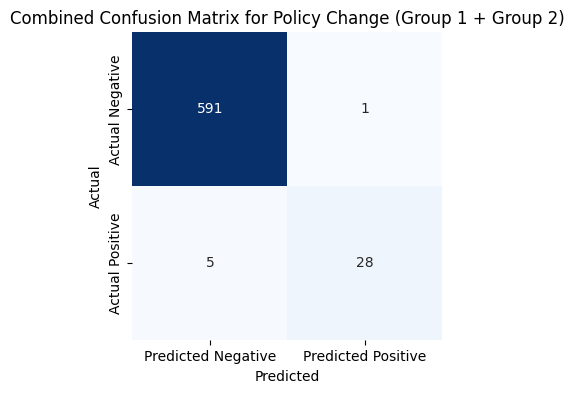


Policy Change - Combined Confusion Matrix (Group 1 + Group 2):
TP: 28, FP: 1, FN: 5, TN: 591


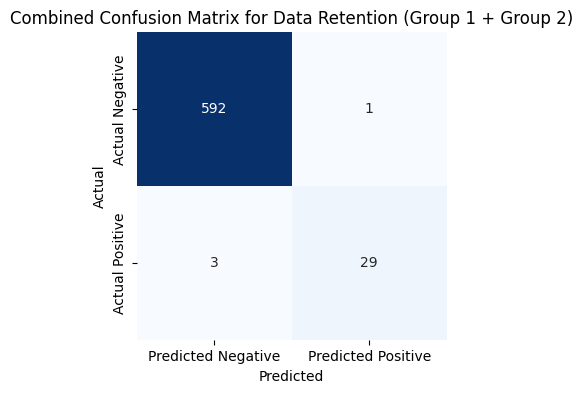


Data Retention - Combined Confusion Matrix (Group 1 + Group 2):
TP: 29, FP: 1, FN: 3, TN: 592


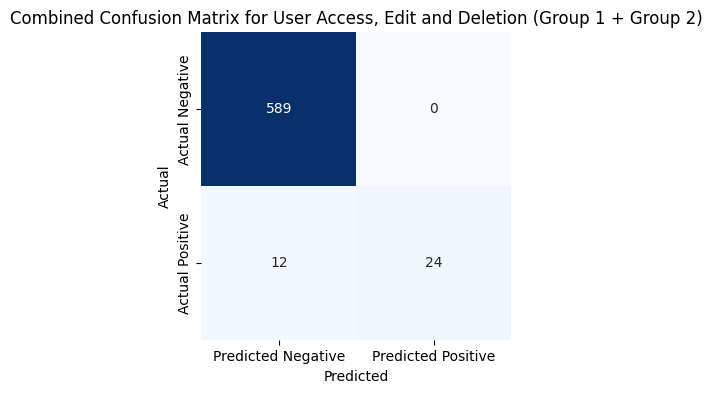


User Access, Edit and Deletion - Combined Confusion Matrix (Group 1 + Group 2):
TP: 24, FP: 0, FN: 12, TN: 589
New tokens list: [1, 1, 5, 5, 5, 5, 5, 1, 6, 6, 1, 2, 2, 6, 6, 6, 2, 1, 2, 1, 20, 1, 5, 2, 1, 6, 6, 1, 1, 1, 1, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 6, 5, 5, 1, 5, 5, 3, 6, 6, 6, 6, 6, 6, 6, 1, 8, 6, 8, 8, 1, 3, 8, 5, 5, 1, 5, 1, 3, 2, 2, 1, 1, 2, 2, 5, 1, 5, 6, 5, 5, 6, 5, 5, 1, 6, 6, 2, 2, 6, 6, 6, 5, 1, 20, 1, 1, 5, 5, 5, 6, 6, 1, 6, 5, 5, 5, 5, 5, 6, 6, 5, 5, 5, 5, 6, 1, 6, 5, 5, 5, 5, 5, 6, 6, 6, 6, 2, 5, 1, 5, 5, 5, 6, 5, 1, 5, 8, 2, 6, 6, 6, 5, 1, 6, 2, 20, 5, 1, 1, 20, 5, 1, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 5, 5, 5, 6, 6, 5, 5, 5, 1, 3, 2, 1, 6, 2, 1, 1, 2, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 3, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 1, 5, 6, 6, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 2, 5, 6, 1, 1, 1, 1, 1, 6, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 1, 1, 5, 6, 6, 8, 5, 1, 1, 2, 2, 2, 2, 1, 1, 5, 1, 5, 5, 5, 5, 5, 5, 6, 2, 6, 1, 5, 5, 5, 5, 5, 1, 1, 5, 5, 5, 5, 6, 6, 6, 6, 1, 5, 6, 6, 6,

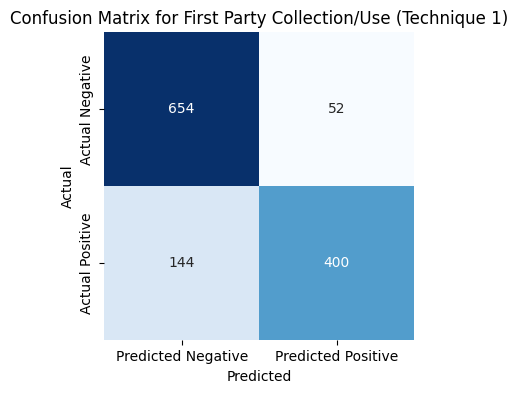


Plotting confusion matrix for category: Third Party Sharing/Collection


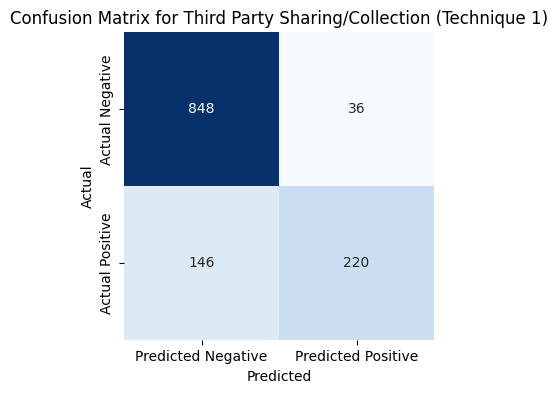


Plotting confusion matrix for category: Other


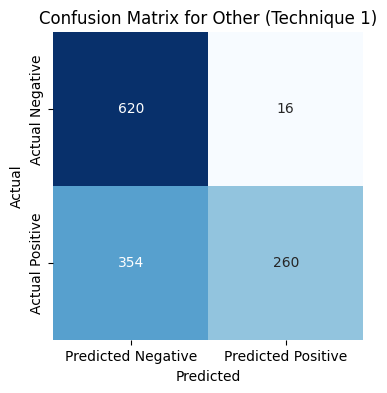


Plotting confusion matrix for category: User Choice/Control


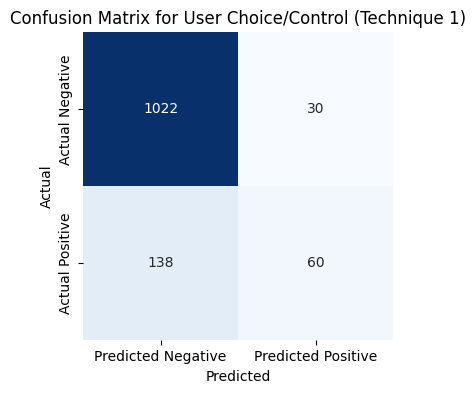


Plotting confusion matrix for category: Do Not Track


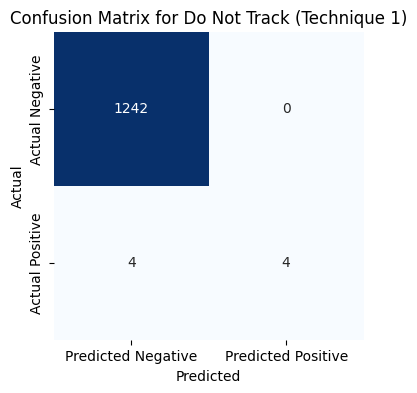


Plotting confusion matrix for category: International and Specific Audiences


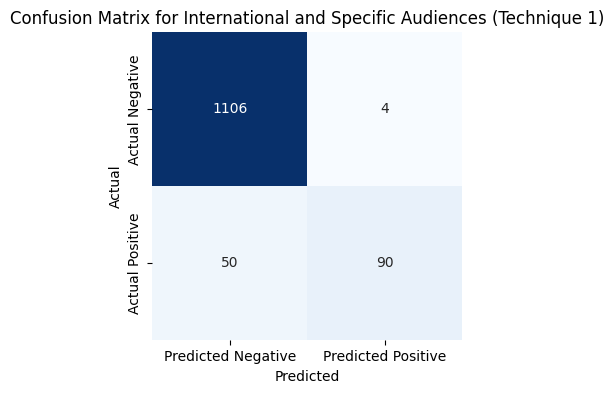


Plotting confusion matrix for category: Data Security


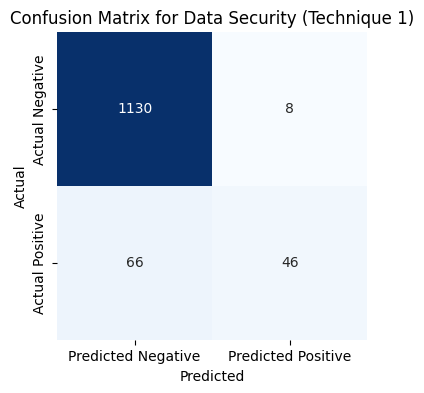


Plotting confusion matrix for category: Policy Change


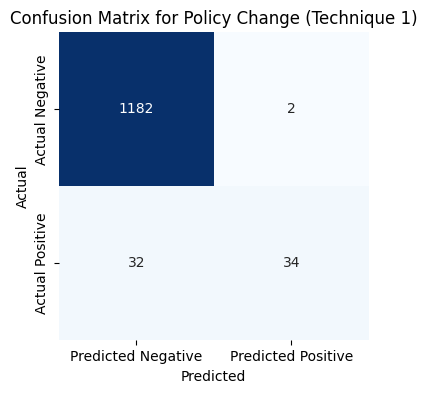


Plotting confusion matrix for category: Data Retention


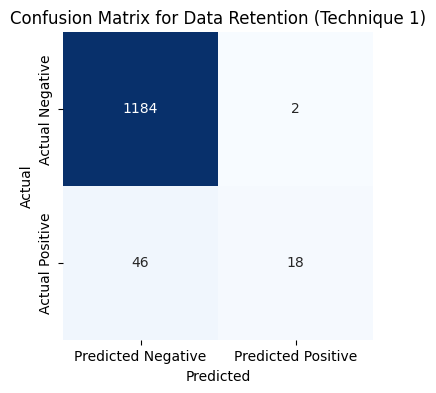


Plotting confusion matrix for category: User Access, Edit and Deletion


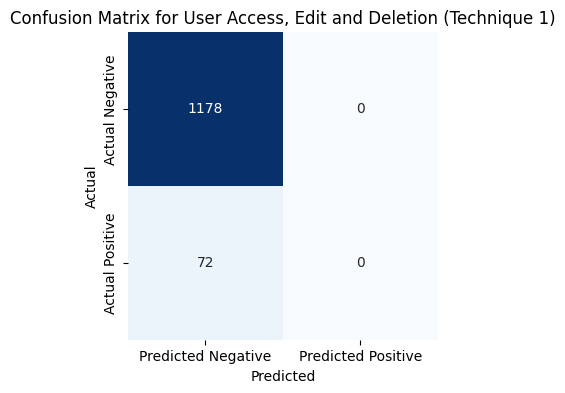


Overall tp: 1132
Overall tn: 10166
Overall fp: 150
Overall fn: 1052
Overall Precision (Technique 1): 0.8829953198127926
Overall Recall (Technique 1): 0.5183150183150184
Overall F1 Score (Technique 1): 0.6532025389497981
Overall Accuracy (Technique 1): 0.90384
TP 400
TN 654
FP 52
FN 144

TP 220
TN 848
FP 36
FN 146

TP 260
TN 620
FP 16
FN 354

TP 60
TN 1022
FP 30
FN 138

TP 4
TN 1242
FP 0
FN 4

TP 90
TN 1106
FP 4
FN 50

TP 46
TN 1130
FP 8
FN 66

TP 34
TN 1182
FP 2
FN 32

TP 18
TN 1184
FP 2
FN 46

TP 0
TN 1178
FP 0
FN 72

Micro Precision: 0.8829953198127926
Micro Recall: 0.5183150183150184
Micro F1 Score: 0.6532025389497981
Micro Accuracy: 0.90384
Macro Precision: 0.8006769509193237
Macro Recall: 0.44128430293048104
Macro F1 Score: 0.5596897077991332
Weighted Precision: 0.8533590980939649
Weighted Recall: 0.5183150183150184
Weighted F1 Score: 0.6335268398446798
Sample Average Precision: 0.8948
Sample Average Recall: 0.6385511111111111
Sample Average F1 Score: 0.7068800000000001

Overall 

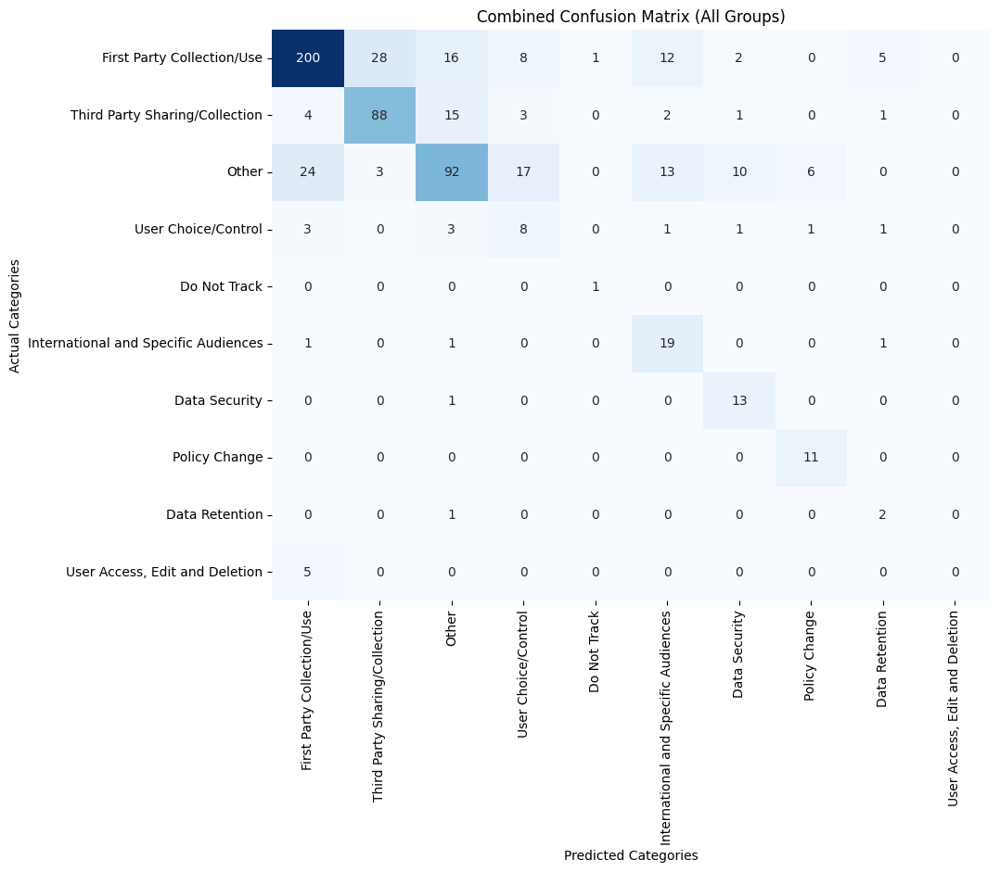


Metrics for Group 1:
Accuracy: 0.9784511784511785
Precision: 0.8922558922558923
Recall: 0.8922558922558923
F1 Score: 0.8922558922558923

Metrics for Group 2:
Accuracy: 0.9780487804878049
Precision: 0.979539641943734
Recall: 0.9318734793187348
F1 Score: 0.9551122194513715

Confusion Matrices for Group 1:


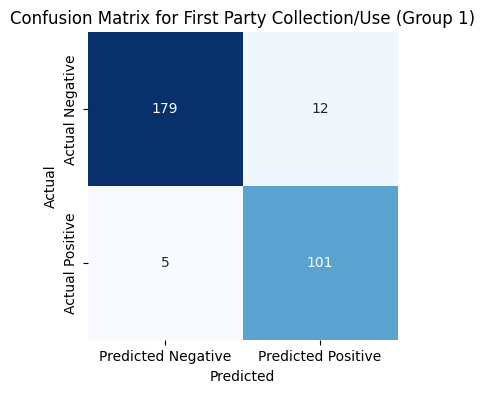

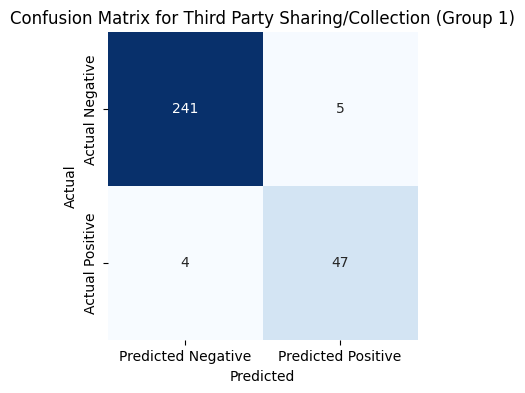

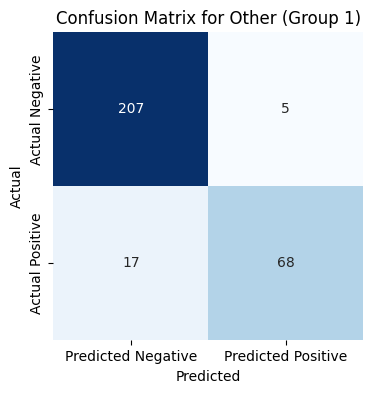

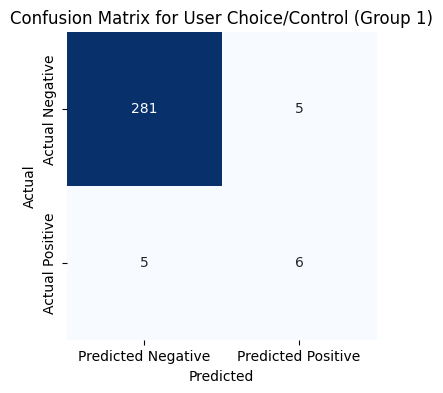

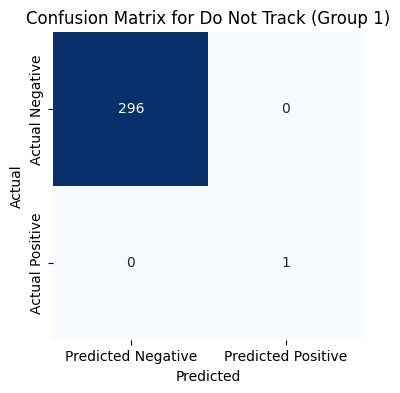

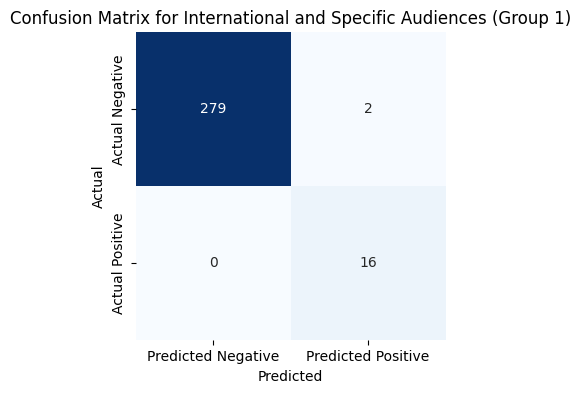

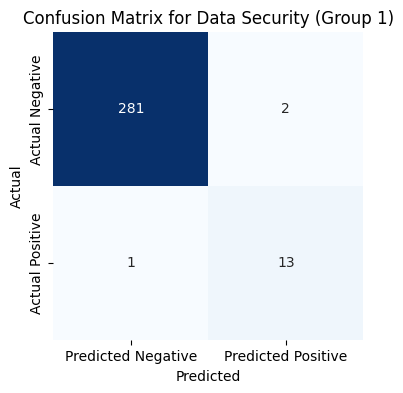

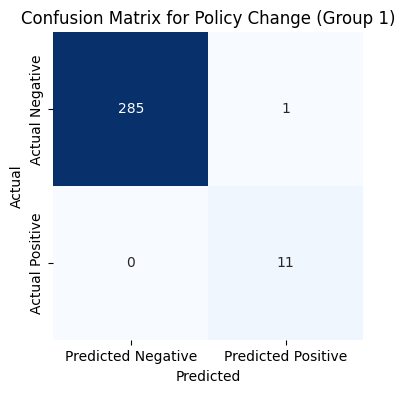

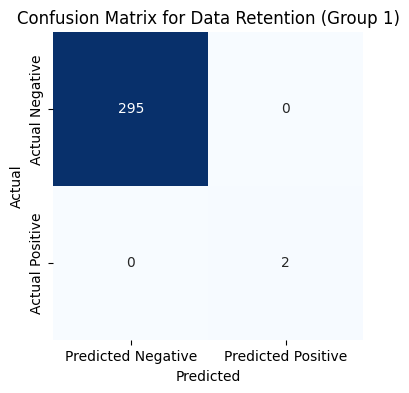

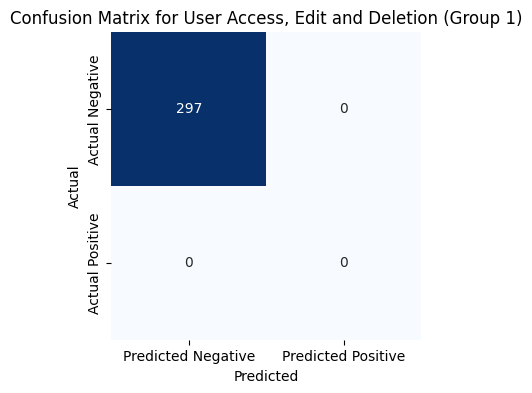


Confusion Matrices for Group 2:


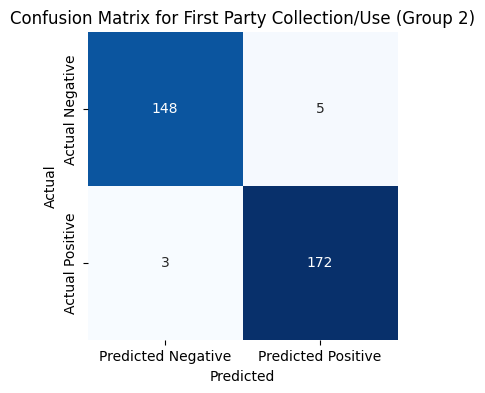

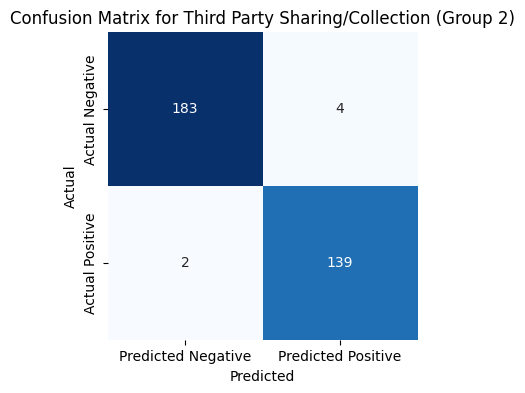

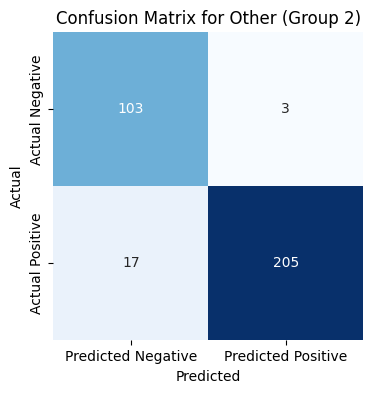

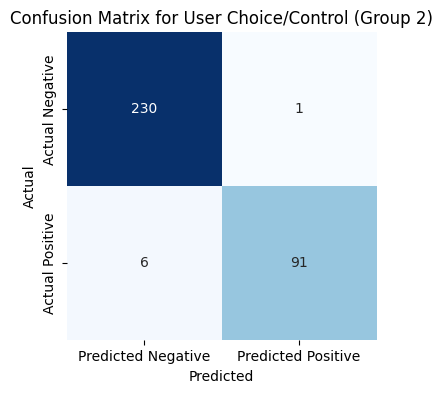

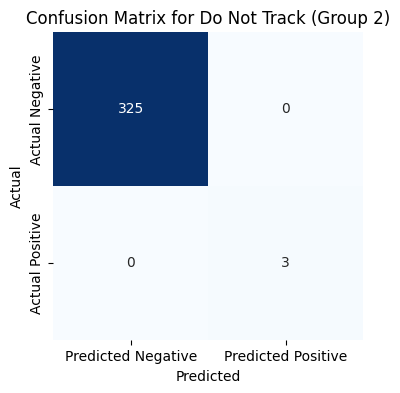

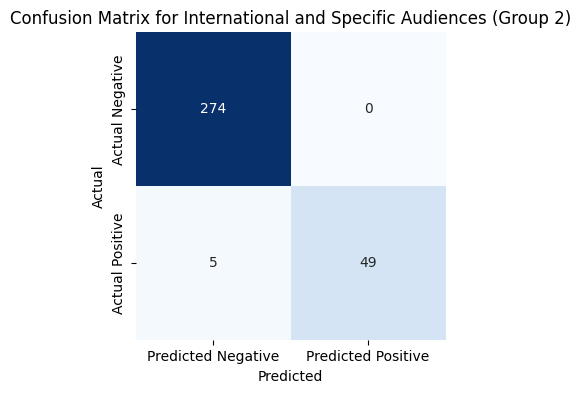

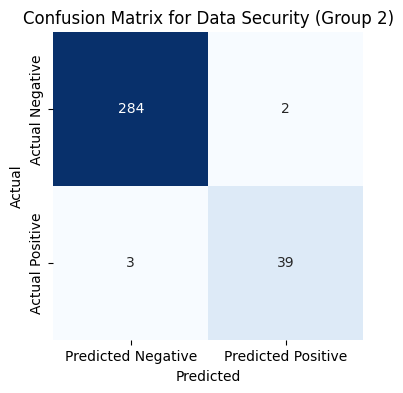

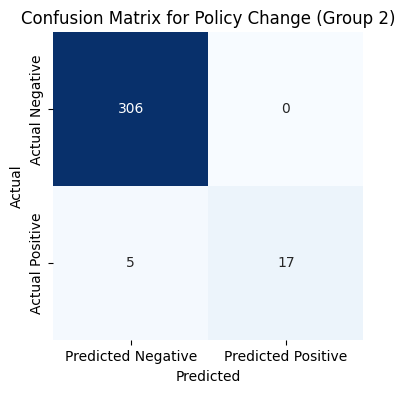

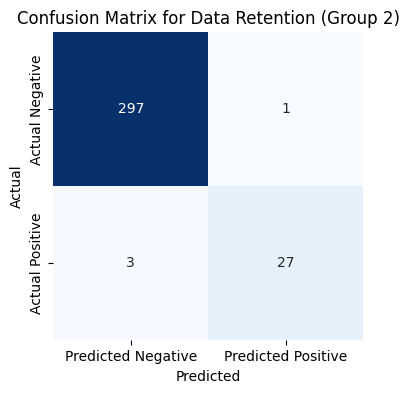

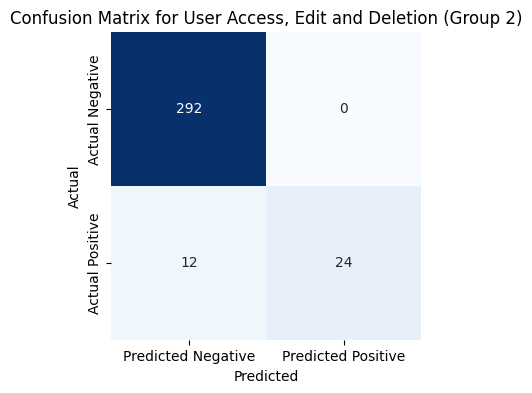


Computing combined overall metrics for Group 1 and Group 2...

Combined Metrics for Group 1 and Group 2:
Overall Accuracy: 0.97824
Overall Precision: 0.9555143651529193
Overall Recall: 0.9213583556747096
Overall F1 Score: 0.9381255686988171
Combined Metrics -> Accuracy: 0.97824, Precision: 0.9555143651529193, Recall: 0.9213583556747096, F1: 0.9381255686988171

Plotting combined confusion matrices for each category (Group 1 + Group 2)...


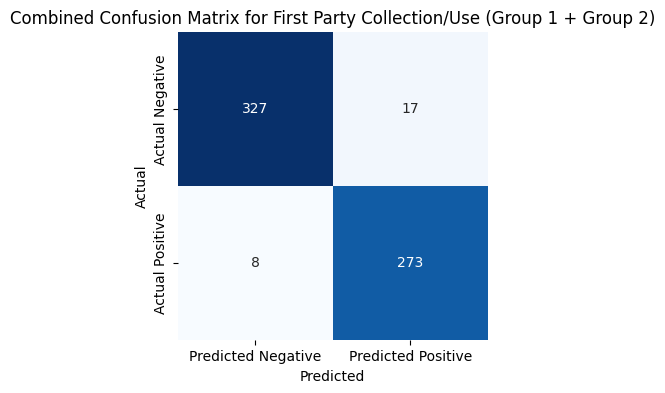


First Party Collection/Use - Combined Confusion Matrix (Group 1 + Group 2):
TP: 273, FP: 17, FN: 8, TN: 327


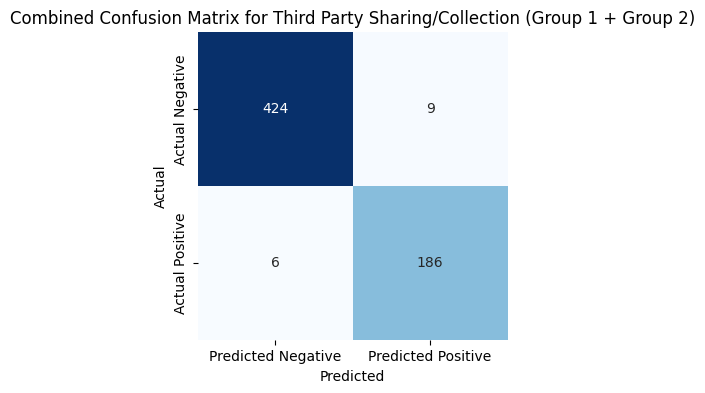


Third Party Sharing/Collection - Combined Confusion Matrix (Group 1 + Group 2):
TP: 186, FP: 9, FN: 6, TN: 424


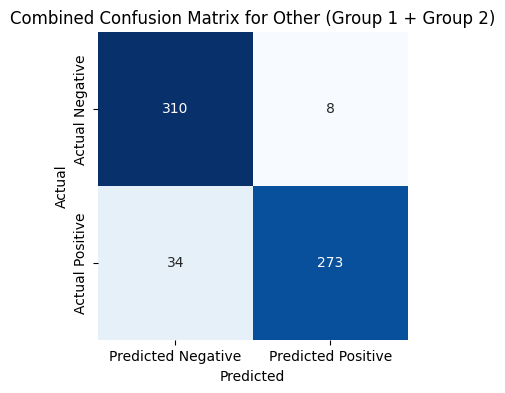


Other - Combined Confusion Matrix (Group 1 + Group 2):
TP: 273, FP: 8, FN: 34, TN: 310


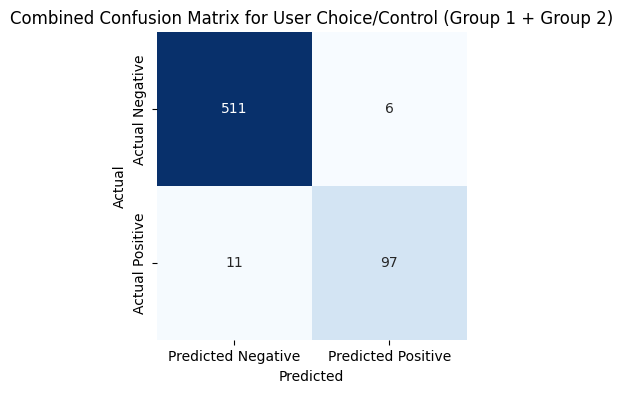


User Choice/Control - Combined Confusion Matrix (Group 1 + Group 2):
TP: 97, FP: 6, FN: 11, TN: 511


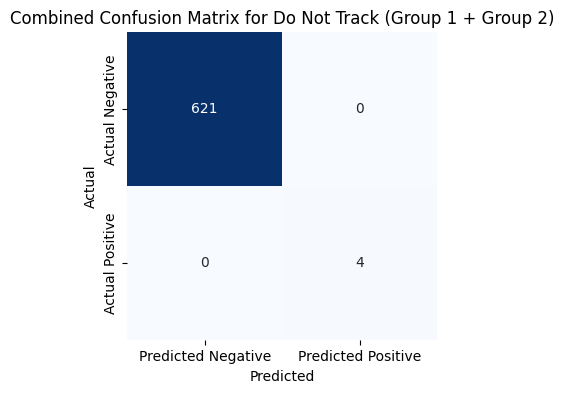


Do Not Track - Combined Confusion Matrix (Group 1 + Group 2):
TP: 4, FP: 0, FN: 0, TN: 621


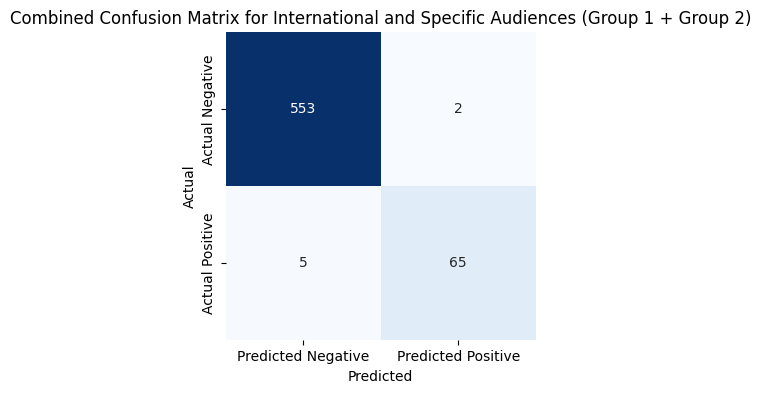


International and Specific Audiences - Combined Confusion Matrix (Group 1 + Group 2):
TP: 65, FP: 2, FN: 5, TN: 553


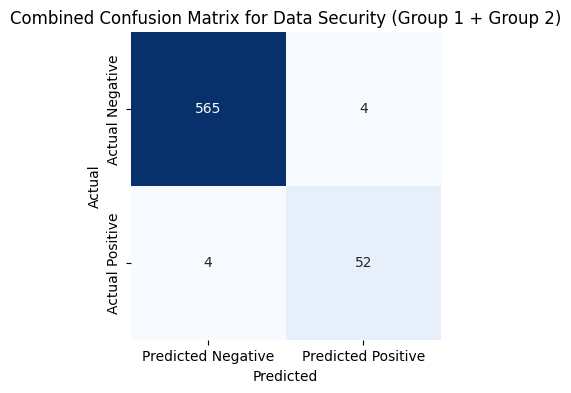


Data Security - Combined Confusion Matrix (Group 1 + Group 2):
TP: 52, FP: 4, FN: 4, TN: 565


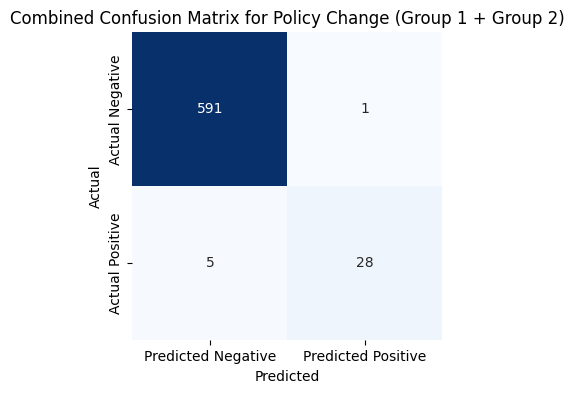


Policy Change - Combined Confusion Matrix (Group 1 + Group 2):
TP: 28, FP: 1, FN: 5, TN: 591


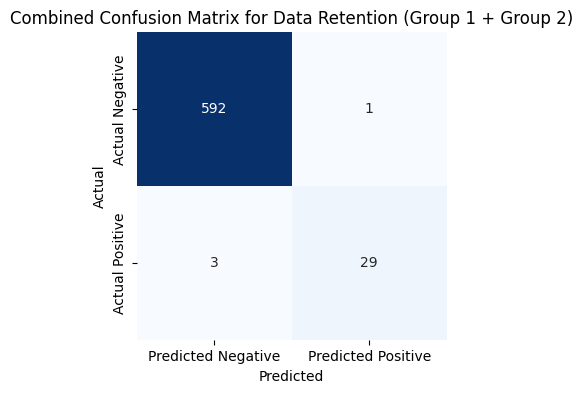


Data Retention - Combined Confusion Matrix (Group 1 + Group 2):
TP: 29, FP: 1, FN: 3, TN: 592


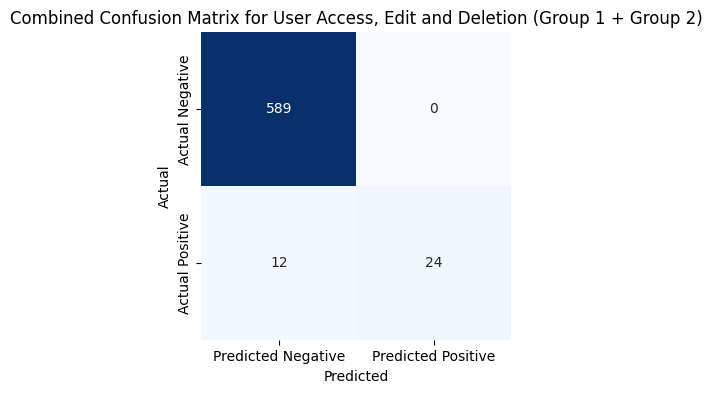


User Access, Edit and Deletion - Combined Confusion Matrix (Group 1 + Group 2):
TP: 24, FP: 0, FN: 12, TN: 589


{'G1': {'accuracy': 0.9784511784511785,
  'precision': 0.8922558922558923,
  'recall': 0.8922558922558923,
  'f1': 0.8922558922558923,
  'category_results': {'First Party Collection/Use': {'TP': 101,
    'FP': 12,
    'TN': 179,
    'FN': 5},
   'Third Party Sharing/Collection': {'TP': 47, 'FP': 5, 'TN': 241, 'FN': 4},
   'Other': {'TP': 68, 'FP': 5, 'TN': 207, 'FN': 17},
   'User Choice/Control': {'TP': 6, 'FP': 5, 'TN': 281, 'FN': 5},
   'Do Not Track': {'TP': 1, 'FP': 0, 'TN': 296, 'FN': 0},
   'International and Specific Audiences': {'TP': 16,
    'FP': 2,
    'TN': 279,
    'FN': 0},
   'Data Security': {'TP': 13, 'FP': 2, 'TN': 281, 'FN': 1},
   'Policy Change': {'TP': 11, 'FP': 1, 'TN': 285, 'FN': 0},
   'Data Retention': {'TP': 2, 'FP': 0, 'TN': 295, 'FN': 0},
   'User Access, Edit and Deletion': {'TP': 0, 'FP': 0, 'TN': 297, 'FN': 0}}},
 'G2': {'accuracy': 0.9780487804878049,
  'precision': 0.979539641943734,
  'recall': 0.9318734793187348,
  'f1': 0.9551122194513715,
  'categ

In [5]:
from util.main import PrivacyPolicyClassifier
from util.generating_cm import compute_grouped_metrics,compute_confusion_matrix_technique1

# Prompt 1
classifier = PrivacyPolicyClassifier(model_path=quantized_model_path)

prompt_template_1 = ("Given a privacy policy text, classify it into one of these categories: "
                   "First Party Collection/Use, Third Party Sharing/Collection, Other, "
                   "User Choice/Control, Do Not Track, International and Specific Audiences, "
                   "Data Security, Policy Change, Data Retention, User Access, Edit and Deletion.")

# file_name = "results_for_quantized_finetuned_model.xlsx"  # Change based on the model type

model_type = "quantized"

q_p1f11 = classifier.predict_and_evaluate(
    prompt_template=prompt_template_1, 
    test_data_path=test_data_path,
    num_test_data=num_entries,
    model_type=model_type,
    prompt_number=1
)

compute_confusion_matrix_technique1(q_p1f11)
compute_grouped_metrics(q_p1f11)

Unused kwargs: ['_load_in_4bit', '_load_in_8bit', 'quant_method']. These kwargs are not used in <class 'transformers.utils.quantization_config.BitsAndBytesConfig'>.
`low_cpu_mem_usage` was None, now set to True since model is quantized.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

/home/bhavani/.local/lib/python3.10/site-packages/transformers/generation/utils.py:1797: UserWarning: You are calling .generate() with the `input_ids` being on a device type different than your model's device. `input_ids` is on cpu, whereas the model is on cuda. You may experience unexpected behaviors or slower generation. Please make sure that you have put `input_ids` to the correct device by calling for example input_ids = input_ids.to('cuda') before running `.generate()`.
  warnings.warn(


Generated new tokens: Other
['▁Other']
Elapsed Time: 0.903233528137207
New tokens generated: 1
Tokens generated per second: 1.11 tokens/s
Predicted categories:['Other']
Privacy Policy Text: PRIVACY POLICY    Buffalo Wild Wings, Inc., its franchisees, marketing agencies, and affiliated contractors, as specifically identified here (collectively "BWW," "we" or "us"), appreciate your patronage and take your privacy very seriously. As a result, we've developed the following policy terms which apply to all websites and mobile applications owned and operated by BWW, specifically including the buffalowildwings.com site and the Fight4Fandom Mobile App (collectively the "Site(s)").
Actual Category: ['Other']
Predicted Categories: ['Other']

Generated new tokens: First Party Collection/Use
['▁First', '▁Party', '▁Collection', '/', 'Use']
Elapsed Time: 2.294395685195923
New tokens generated: 5
Tokens generated per second: 2.18 tokens/s
Predicted categories:['First Party Collection/Use']
Privacy Pol

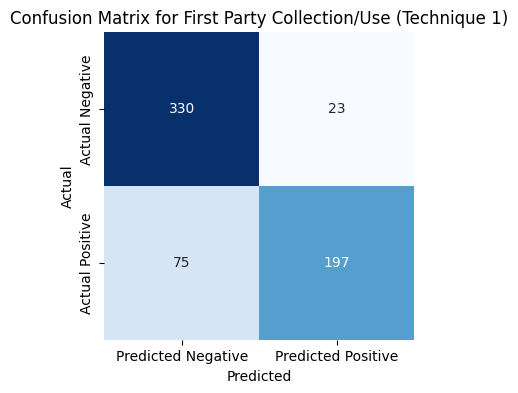


Plotting confusion matrix for category: Third Party Sharing/Collection


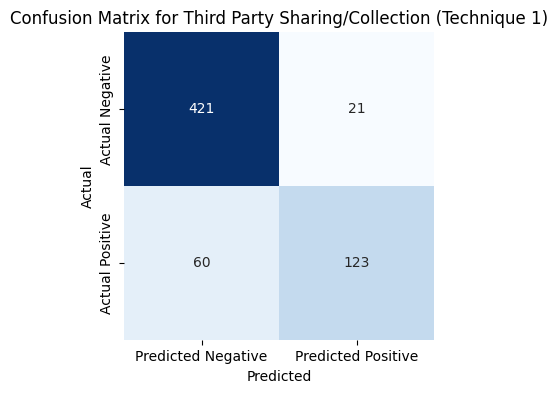


Plotting confusion matrix for category: Other


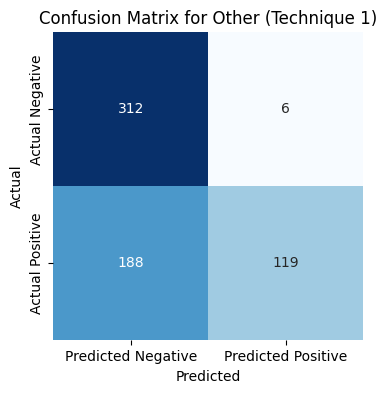


Plotting confusion matrix for category: User Choice/Control


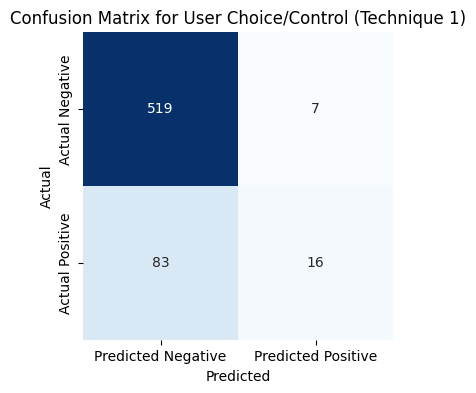


Plotting confusion matrix for category: Do Not Track


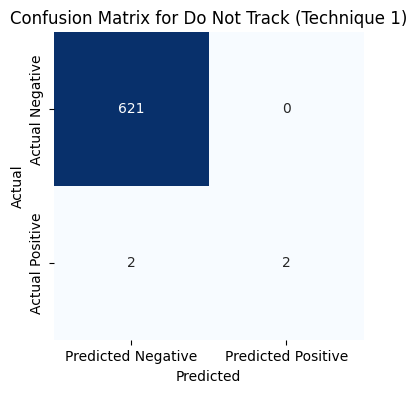


Plotting confusion matrix for category: International and Specific Audiences


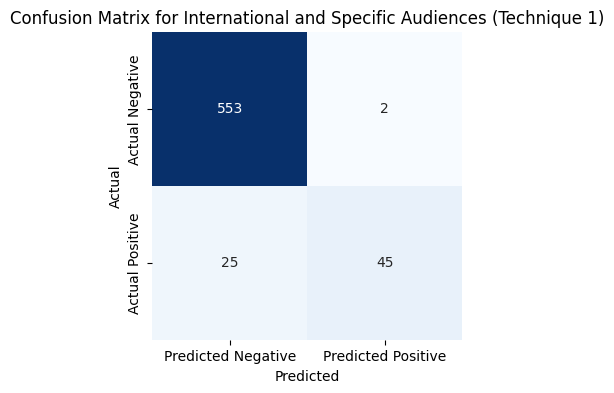


Plotting confusion matrix for category: Data Security


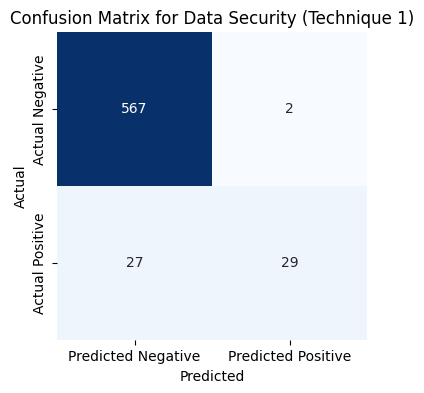


Plotting confusion matrix for category: Policy Change


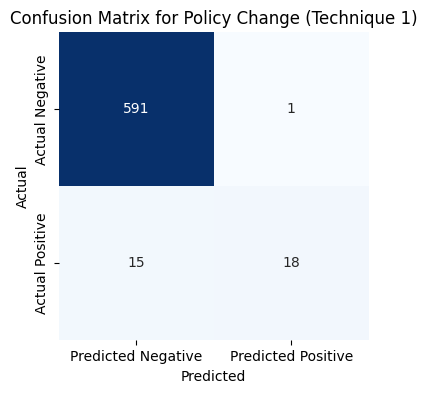


Plotting confusion matrix for category: Data Retention


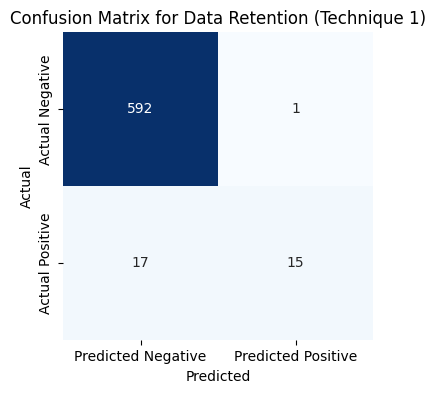


Plotting confusion matrix for category: User Access, Edit and Deletion


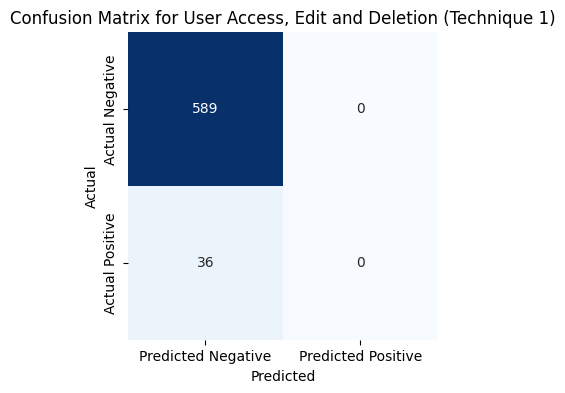


Overall tp: 564
Overall tn: 5095
Overall fp: 63
Overall fn: 528
Overall Precision (Technique 1): 0.8995215311004785
Overall Recall (Technique 1): 0.5164835164835165
Overall F1 Score (Technique 1): 0.6561954624781849
Overall Accuracy (Technique 1): 0.90544
TP 197
TN 330
FP 23
FN 75

TP 123
TN 421
FP 21
FN 60

TP 119
TN 312
FP 6
FN 188

TP 16
TN 519
FP 7
FN 83

TP 2
TN 621
FP 0
FN 2

TP 45
TN 553
FP 2
FN 25

TP 29
TN 567
FP 2
FN 27

TP 18
TN 591
FP 1
FN 15

TP 15
TN 592
FP 1
FN 17

TP 0
TN 589
FP 0
FN 36

Micro Precision: 0.8995215311004785
Micro Recall: 0.5164835164835165
Micro F1 Score: 0.6561954624781849
Micro Accuracy: 0.90544
Macro Precision: 0.8175072486565267
Macro Recall: 0.4620552996045463
Macro F1 Score: 0.5786199388876666
Weighted Precision: 0.8660084549869073
Weighted Recall: 0.5164835164835165
Weighted F1 Score: 0.6293815412530634
Sample Average Precision: 0.8988
Sample Average Recall: 0.6318577777777777
Sample Average F1 Score: 0.7072

Overall Metrics (Technique 1):
Accura

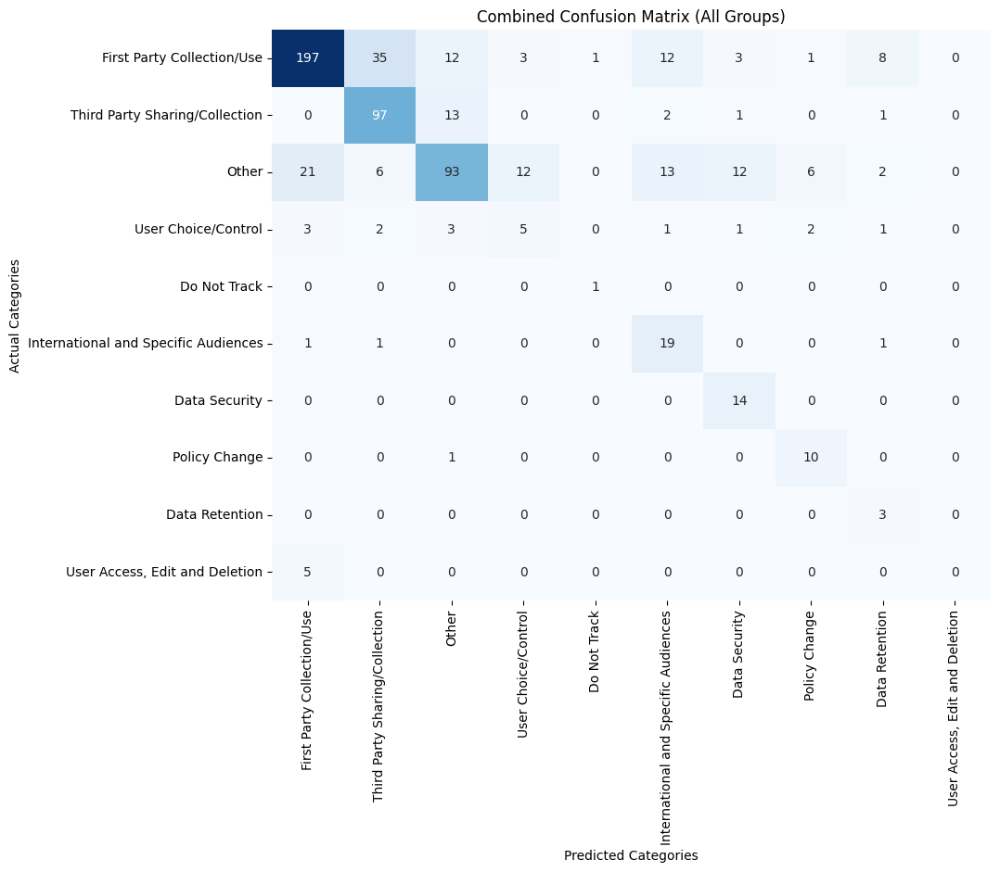


Metrics for Group 1:
Accuracy: 0.9742574257425742
Precision: 0.8712871287128713
Recall: 0.8712871287128713
F1 Score: 0.8712871287128713

Metrics for Group 2:
Accuracy: 0.981055900621118
Precision: 0.9804432855280313
Recall: 0.9423558897243107
F1 Score: 0.9610223642172524

Confusion Matrices for Group 1:


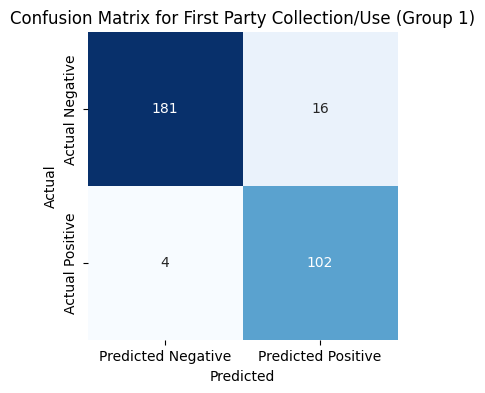

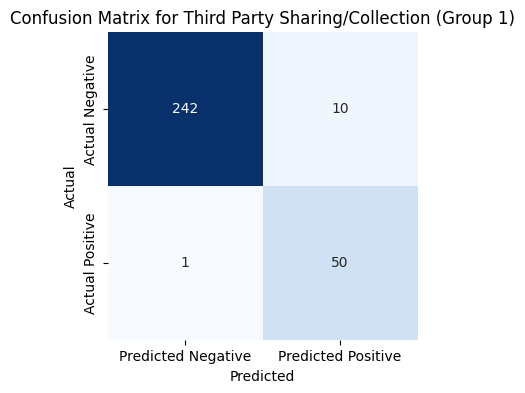

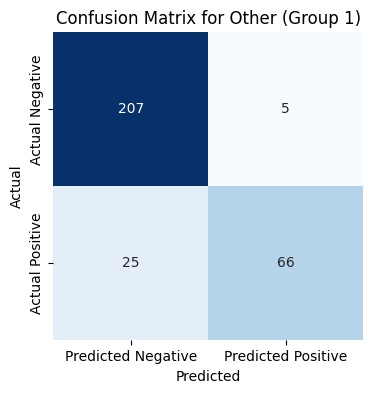

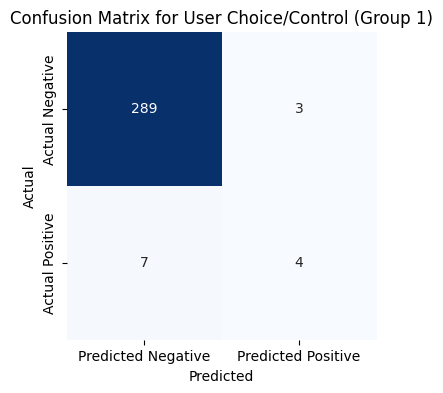

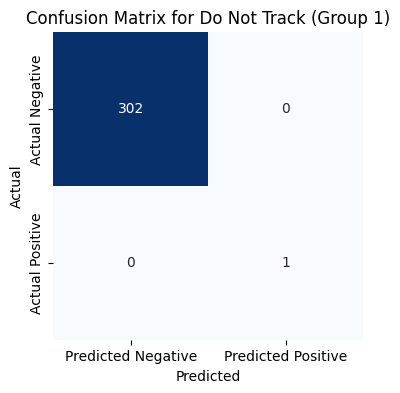

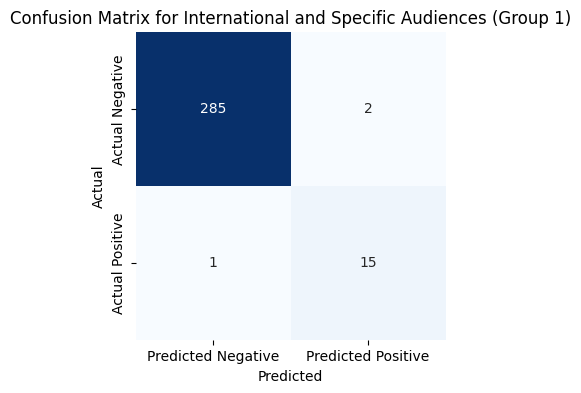

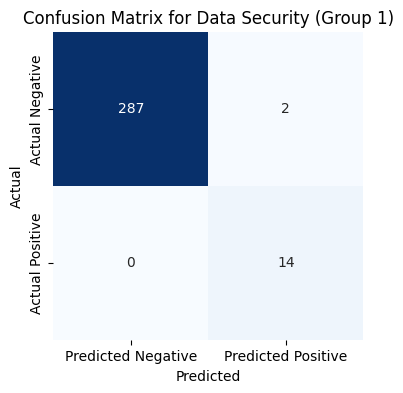

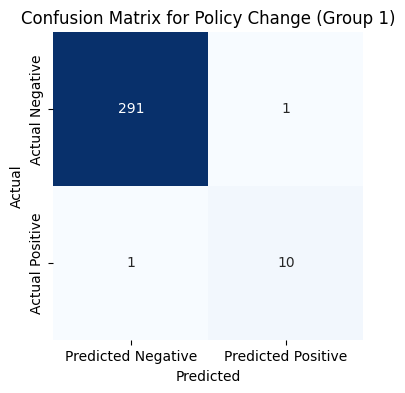

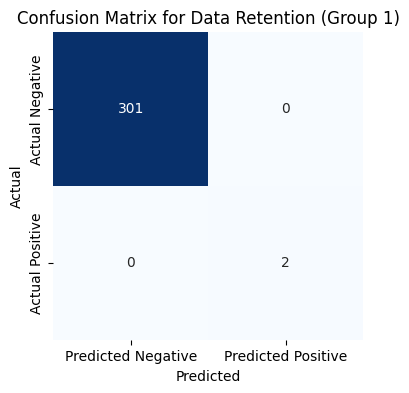

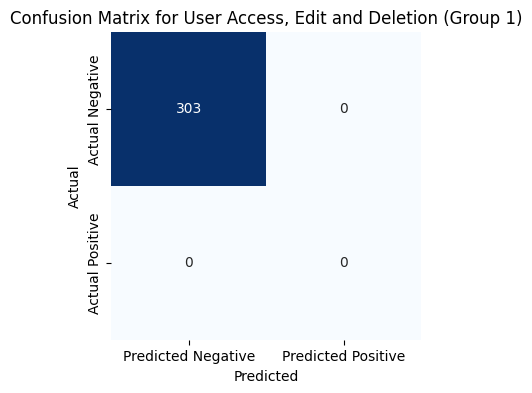


Confusion Matrices for Group 2:


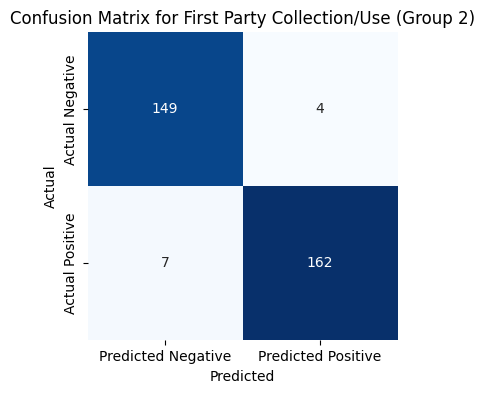

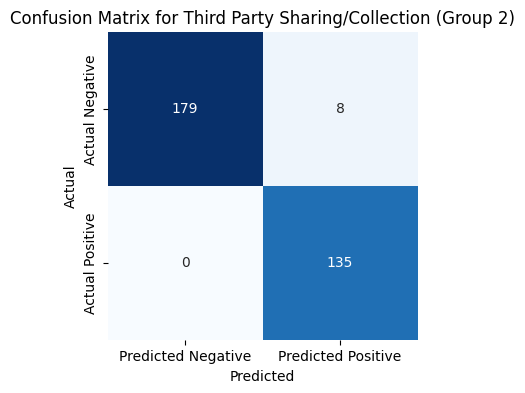

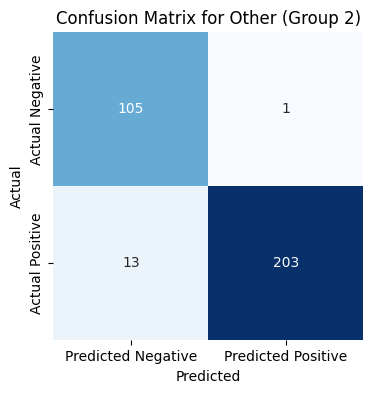

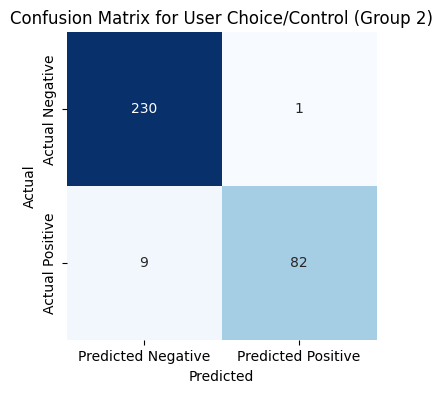

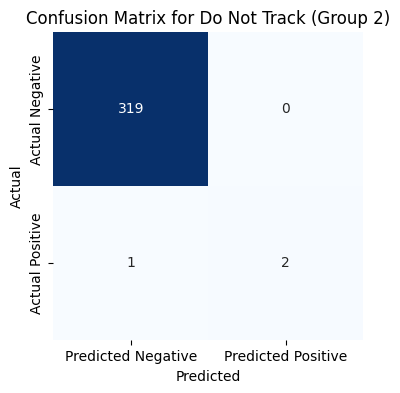

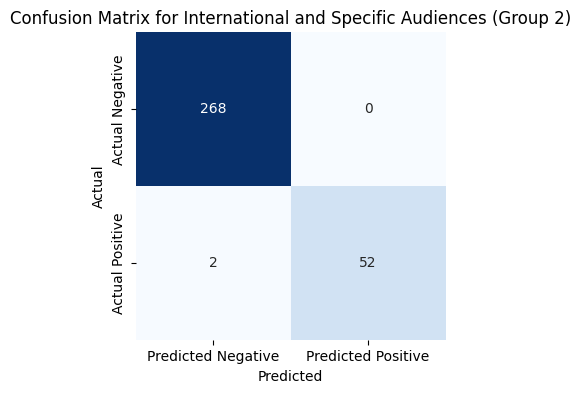

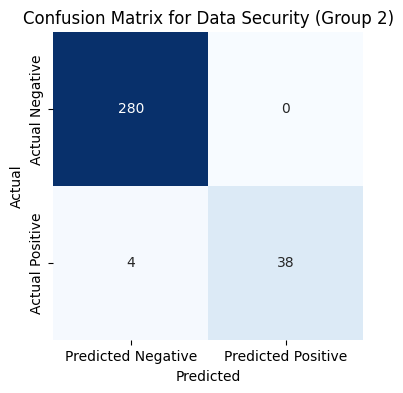

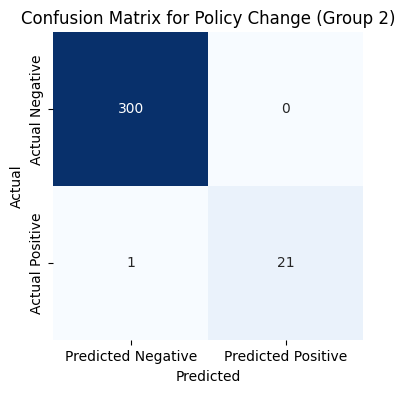

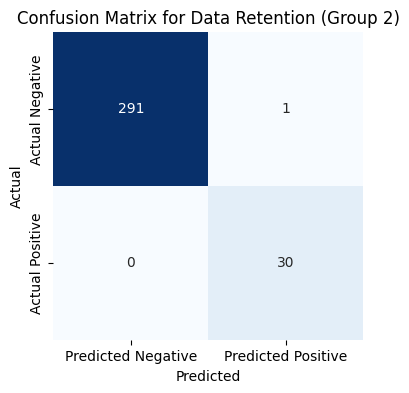

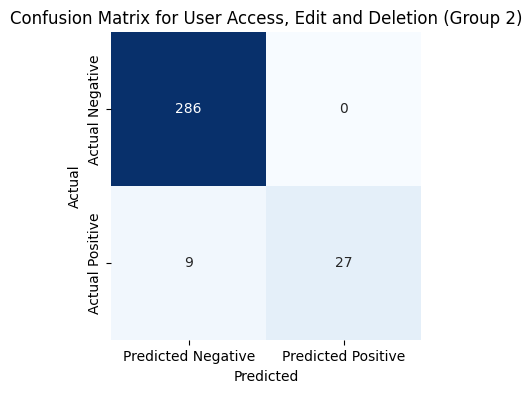


Computing combined overall metrics for Group 1 and Group 2...

Combined Metrics for Group 1 and Group 2:
Overall Accuracy: 0.97776
Overall Precision: 0.9495327102803738
Overall Recall: 0.9227974568574023
Overall F1 Score: 0.9359742054352833
Combined Metrics -> Accuracy: 0.97776, Precision: 0.9495327102803738, Recall: 0.9227974568574023, F1: 0.9359742054352833

Plotting combined confusion matrices for each category (Group 1 + Group 2)...


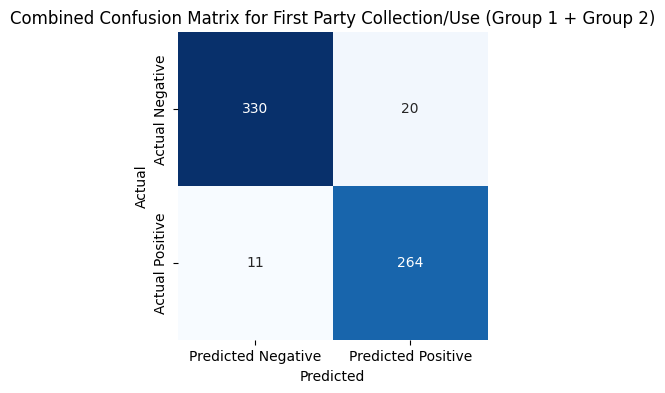


First Party Collection/Use - Combined Confusion Matrix (Group 1 + Group 2):
TP: 264, FP: 20, FN: 11, TN: 330


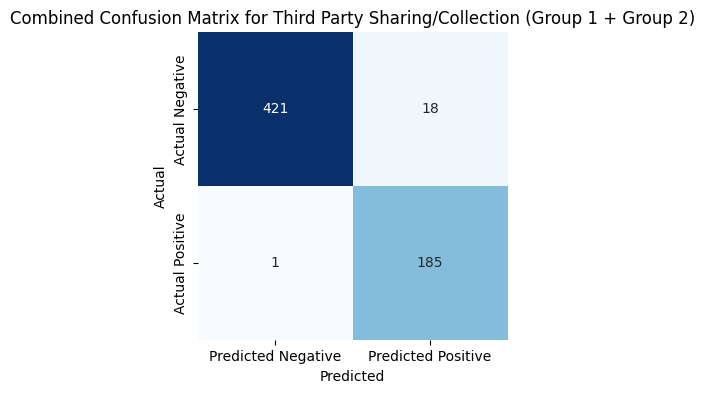


Third Party Sharing/Collection - Combined Confusion Matrix (Group 1 + Group 2):
TP: 185, FP: 18, FN: 1, TN: 421


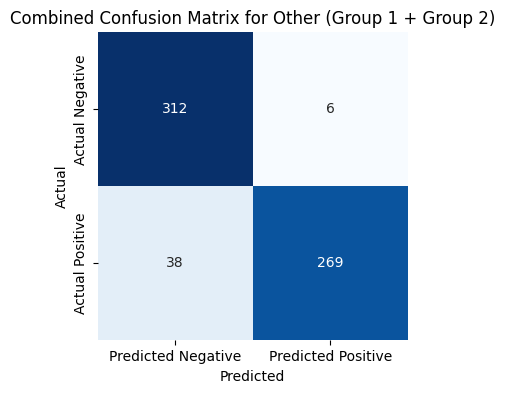


Other - Combined Confusion Matrix (Group 1 + Group 2):
TP: 269, FP: 6, FN: 38, TN: 312


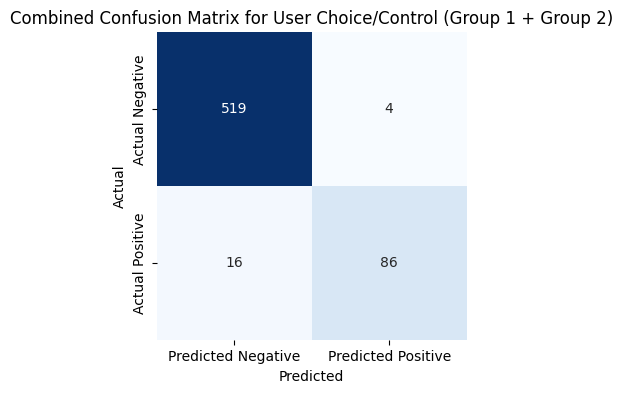


User Choice/Control - Combined Confusion Matrix (Group 1 + Group 2):
TP: 86, FP: 4, FN: 16, TN: 519


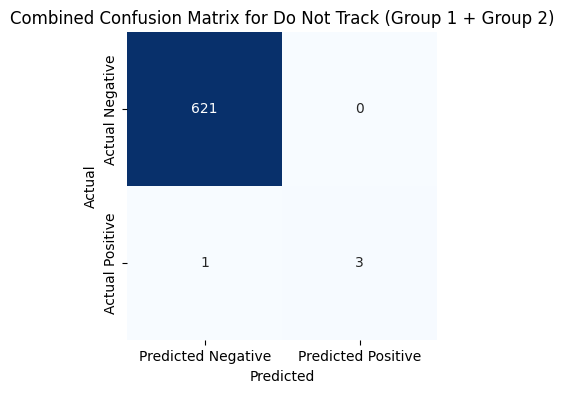


Do Not Track - Combined Confusion Matrix (Group 1 + Group 2):
TP: 3, FP: 0, FN: 1, TN: 621


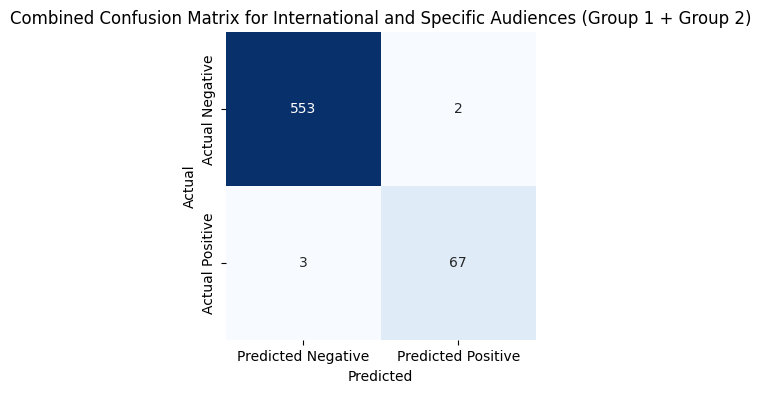


International and Specific Audiences - Combined Confusion Matrix (Group 1 + Group 2):
TP: 67, FP: 2, FN: 3, TN: 553


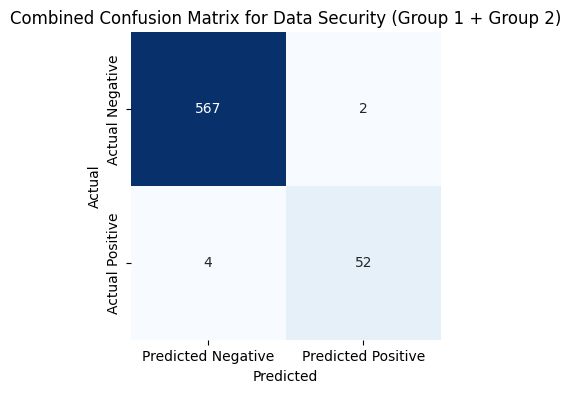


Data Security - Combined Confusion Matrix (Group 1 + Group 2):
TP: 52, FP: 2, FN: 4, TN: 567


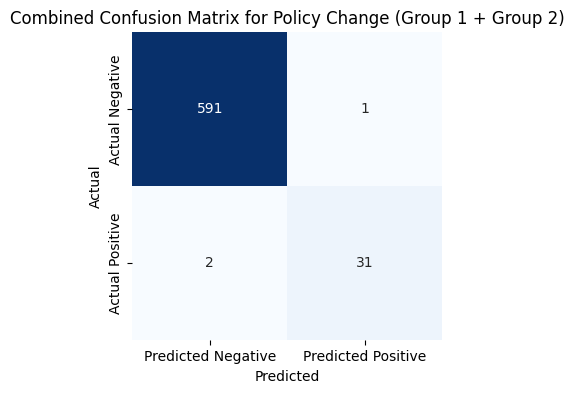


Policy Change - Combined Confusion Matrix (Group 1 + Group 2):
TP: 31, FP: 1, FN: 2, TN: 591


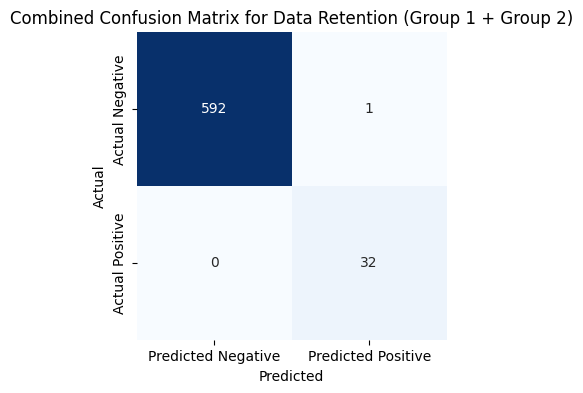


Data Retention - Combined Confusion Matrix (Group 1 + Group 2):
TP: 32, FP: 1, FN: 0, TN: 592


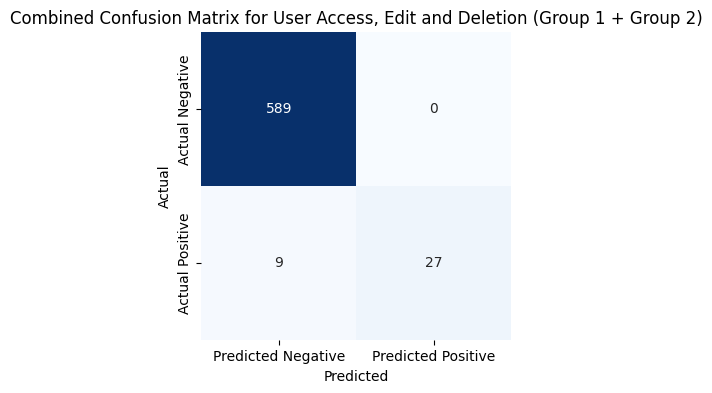


User Access, Edit and Deletion - Combined Confusion Matrix (Group 1 + Group 2):
TP: 27, FP: 0, FN: 9, TN: 589
New tokens list: [1, 5, 5, 5, 5, 5, 5, 6, 6, 6, 1, 2, 2, 6, 6, 6, 2, 2, 1, 1, 5, 1, 5, 1, 5, 6, 1, 1, 1, 1, 1, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 2, 5, 5, 1, 3, 6, 6, 6, 6, 6, 6, 6, 1, 8, 6, 3, 1, 5, 3, 8, 5, 5, 1, 5, 6, 3, 2, 2, 2, 2, 2, 2, 5, 5, 5, 6, 5, 5, 6, 5, 5, 1, 6, 6, 2, 2, 6, 6, 6, 5, 1, 1, 1, 1, 5, 5, 5, 6, 6, 1, 6, 5, 5, 1, 5, 5, 6, 6, 5, 5, 5, 6, 6, 1, 1, 5, 5, 5, 5, 5, 6, 6, 6, 6, 2, 6, 1, 5, 1, 5, 6, 5, 2, 3, 8, 2, 6, 6, 5, 6, 6, 6, 2, 20, 5, 1, 1, 1, 1, 1, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 3, 2, 1, 6, 2, 1, 1, 2, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 3, 5, 5, 5, 1, 6, 6, 6, 6, 6, 6, 6, 1, 5, 6, 6, 3, 3, 5, 5, 5, 6, 6, 2, 1, 6, 6, 6, 6, 2, 5, 6, 1, 1, 1, 5, 1, 6, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 1, 5, 6, 6, 8, 1, 1, 3, 2, 2, 2, 2, 1, 1, 1, 1, 6, 5, 5, 5, 5, 5, 6, 2, 6, 1, 5, 5, 5, 5, 5, 1, 1, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 

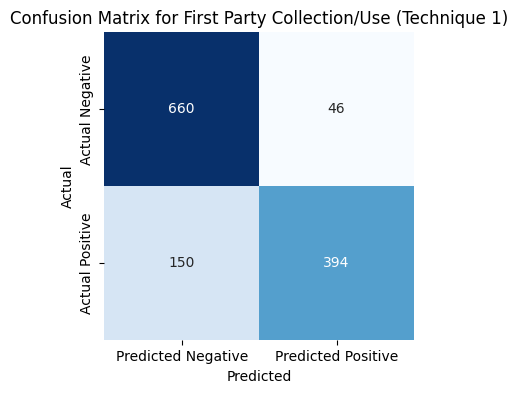


Plotting confusion matrix for category: Third Party Sharing/Collection


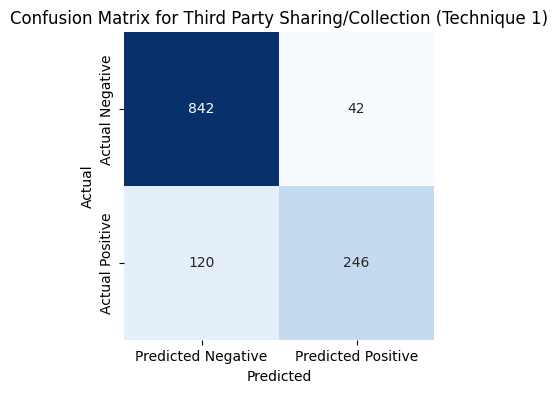


Plotting confusion matrix for category: Other


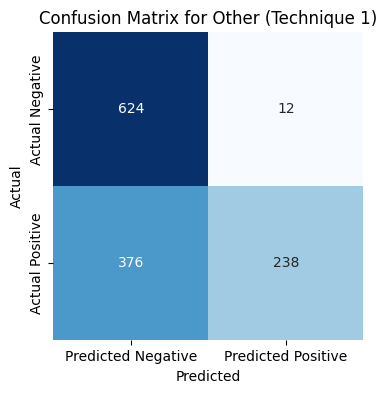


Plotting confusion matrix for category: User Choice/Control


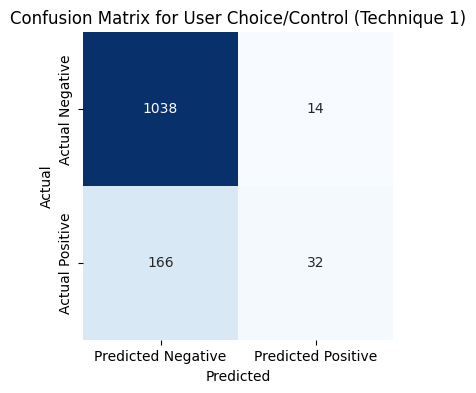


Plotting confusion matrix for category: Do Not Track


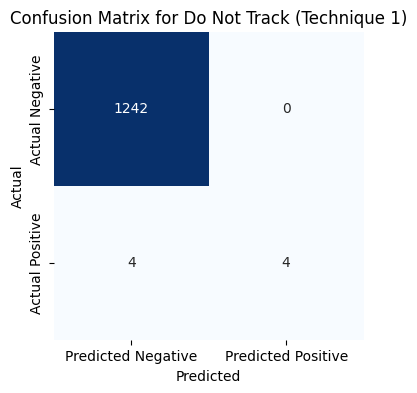


Plotting confusion matrix for category: International and Specific Audiences


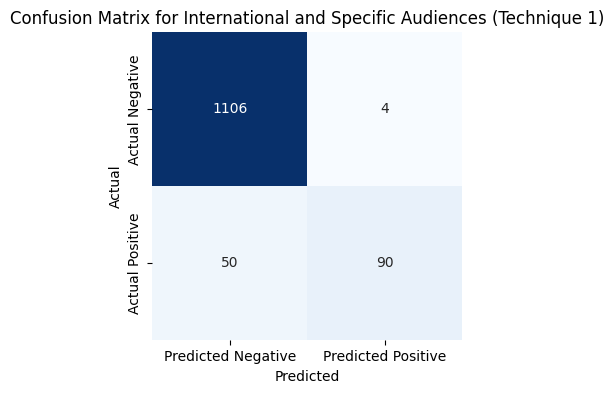


Plotting confusion matrix for category: Data Security


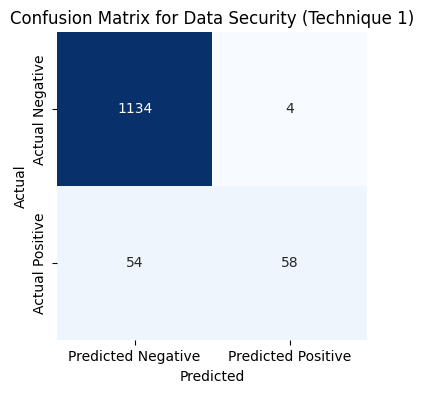


Plotting confusion matrix for category: Policy Change


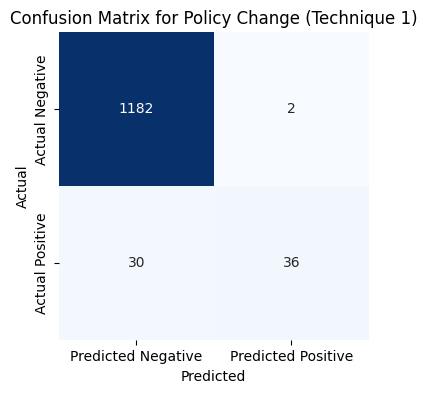


Plotting confusion matrix for category: Data Retention


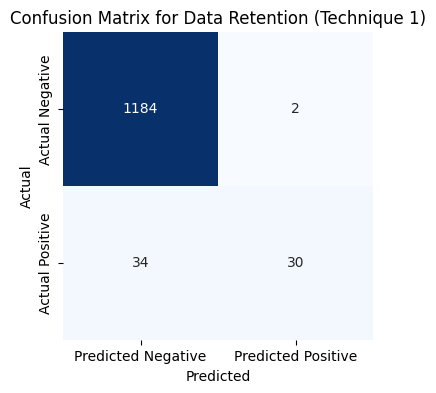


Plotting confusion matrix for category: User Access, Edit and Deletion


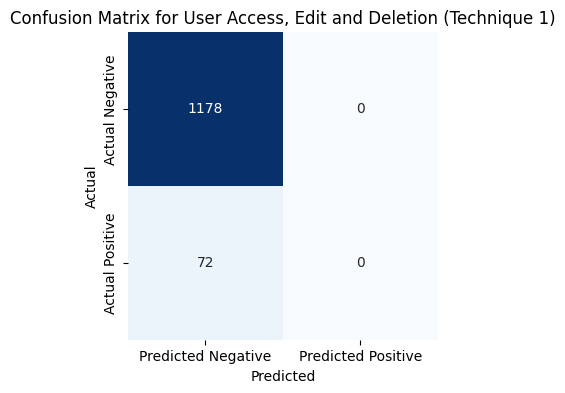


Overall tp: 1128
Overall tn: 10190
Overall fp: 126
Overall fn: 1056
Overall Precision (Technique 1): 0.8995215311004785
Overall Recall (Technique 1): 0.5164835164835165
Overall F1 Score (Technique 1): 0.6561954624781849
Overall Accuracy (Technique 1): 0.90544
TP 394
TN 660
FP 46
FN 150

TP 246
TN 842
FP 42
FN 120

TP 238
TN 624
FP 12
FN 376

TP 32
TN 1038
FP 14
FN 166

TP 4
TN 1242
FP 0
FN 4

TP 90
TN 1106
FP 4
FN 50

TP 58
TN 1134
FP 4
FN 54

TP 36
TN 1182
FP 2
FN 30

TP 30
TN 1184
FP 2
FN 34

TP 0
TN 1178
FP 0
FN 72

Micro Precision: 0.8995215311004785
Micro Recall: 0.5164835164835165
Micro F1 Score: 0.6561954624781849
Micro Accuracy: 0.90544
Macro Precision: 0.8175072486565267
Macro Recall: 0.4620552996045463
Macro F1 Score: 0.5786199388876666
Weighted Precision: 0.8660084549869073
Weighted Recall: 0.5164835164835165
Weighted F1 Score: 0.6293815412530634
Sample Average Precision: 0.8988
Sample Average Recall: 0.6318577777777777
Sample Average F1 Score: 0.7072

Overall Metrics (Tech

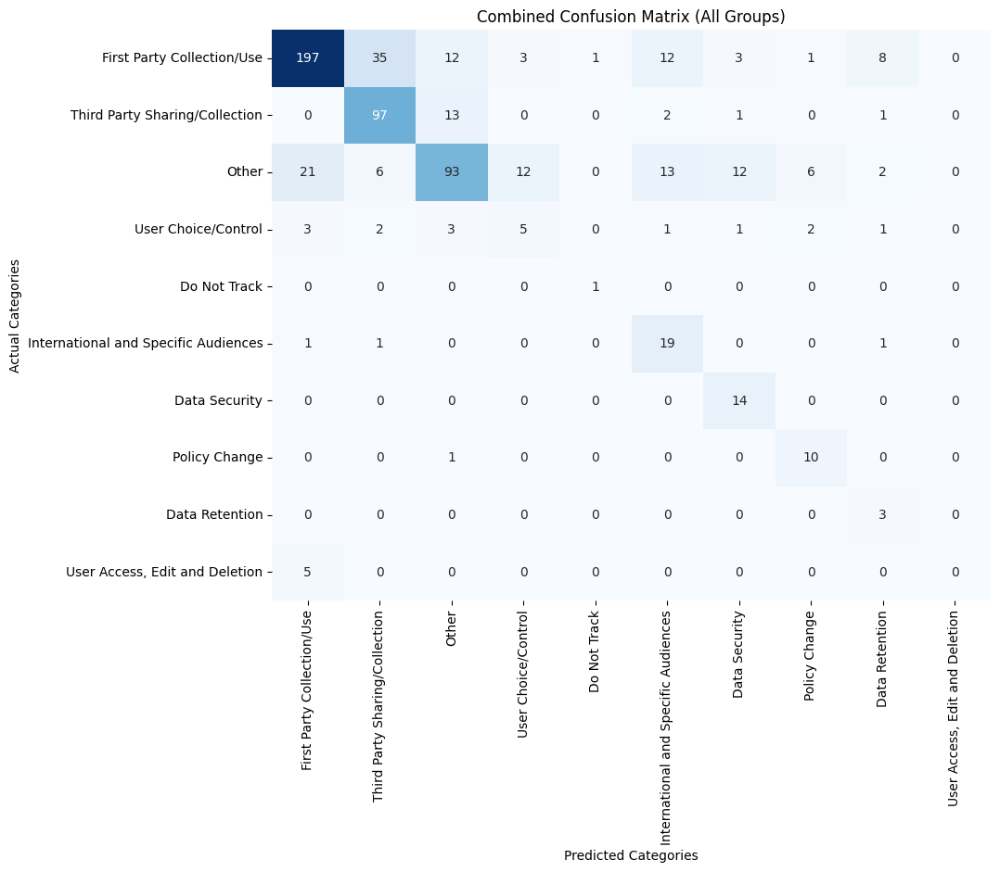


Metrics for Group 1:
Accuracy: 0.9742574257425742
Precision: 0.8712871287128713
Recall: 0.8712871287128713
F1 Score: 0.8712871287128713

Metrics for Group 2:
Accuracy: 0.981055900621118
Precision: 0.9804432855280313
Recall: 0.9423558897243107
F1 Score: 0.9610223642172524

Confusion Matrices for Group 1:


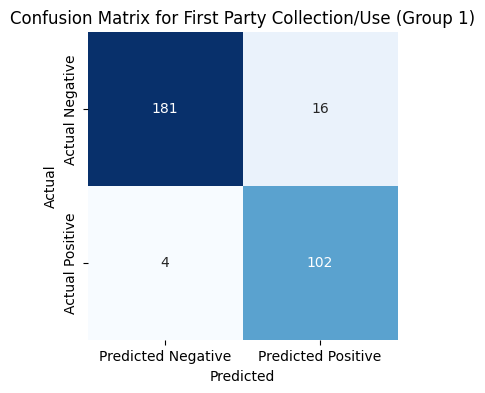

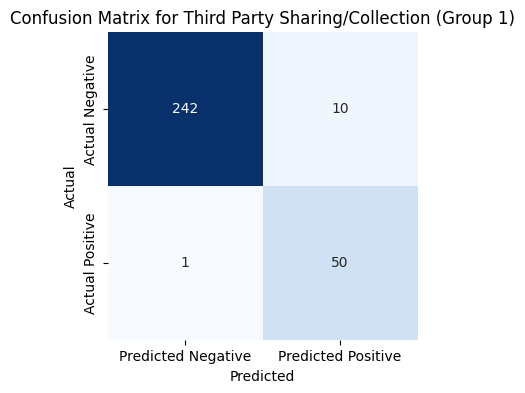

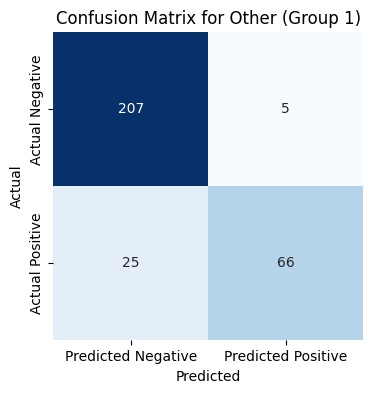

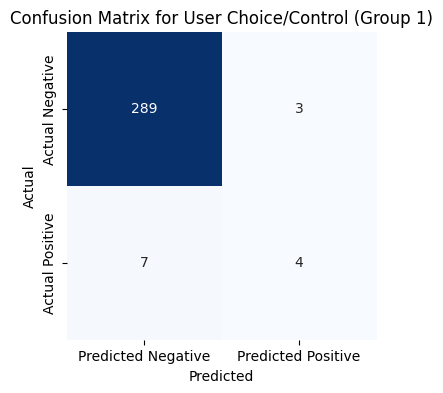

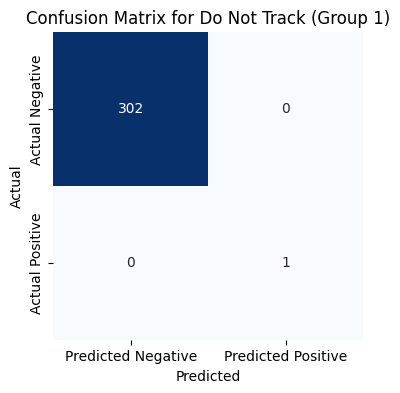

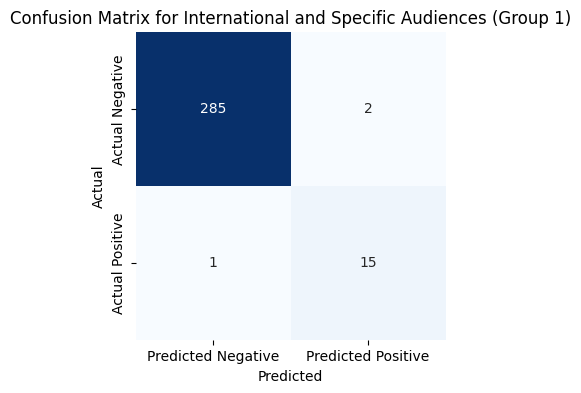

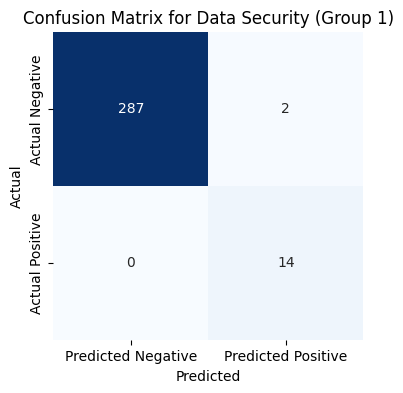

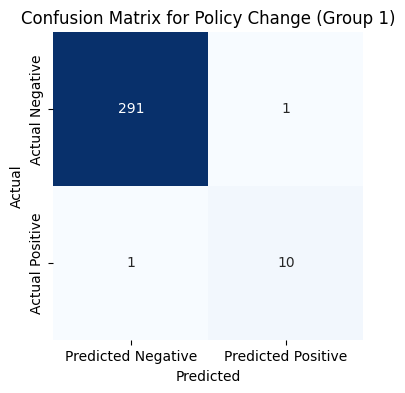

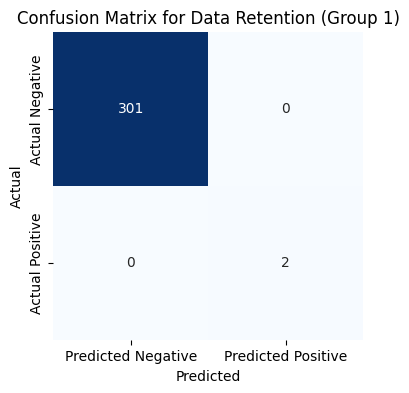

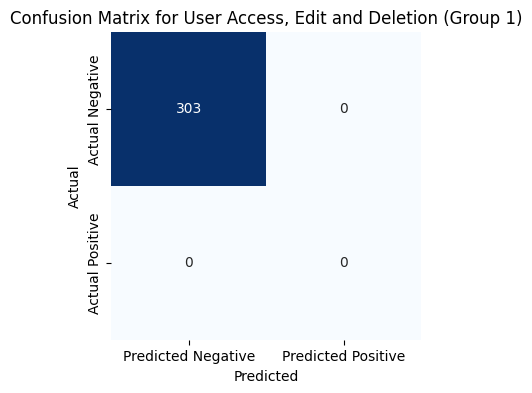


Confusion Matrices for Group 2:


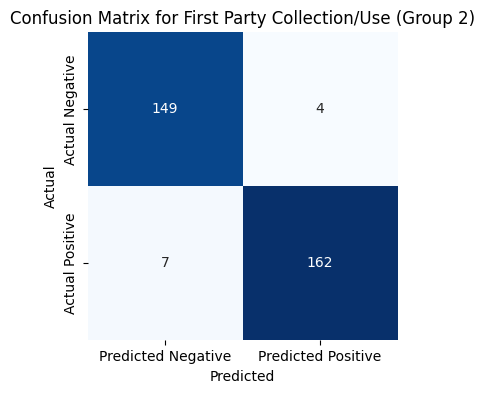

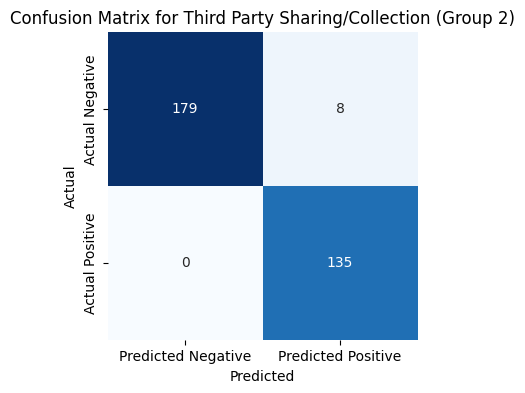

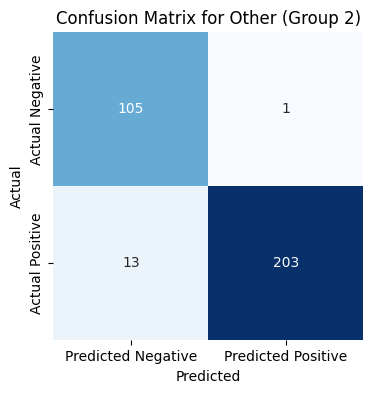

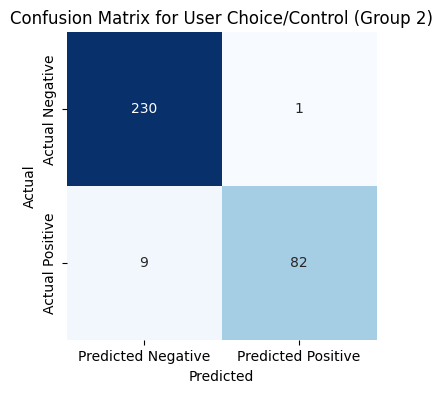

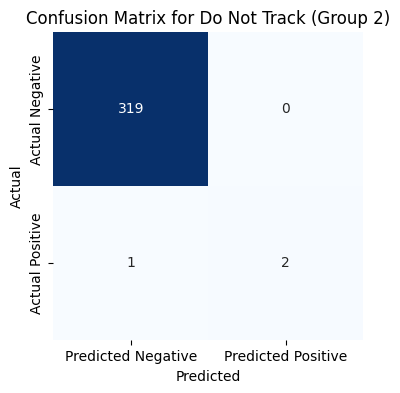

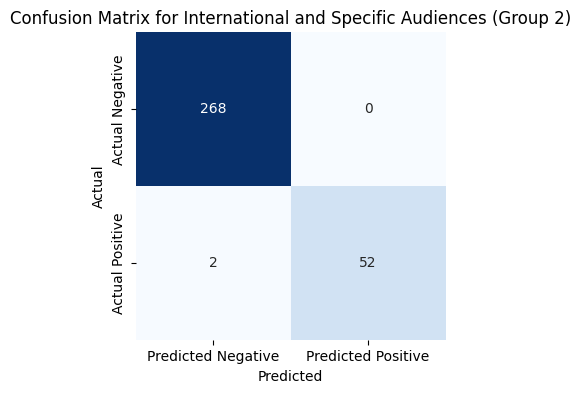

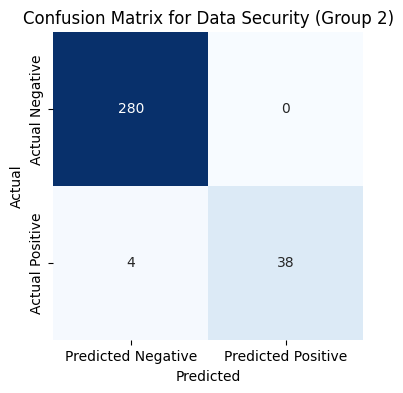

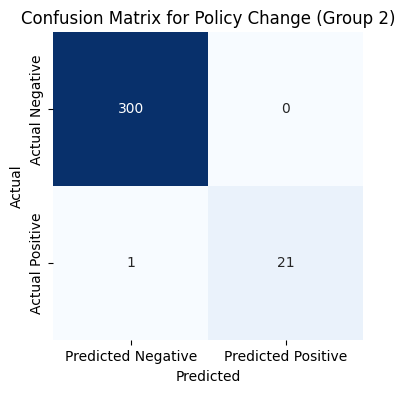

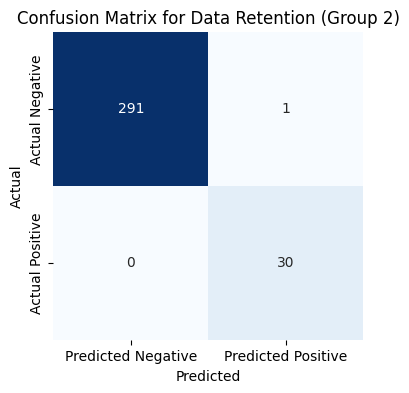

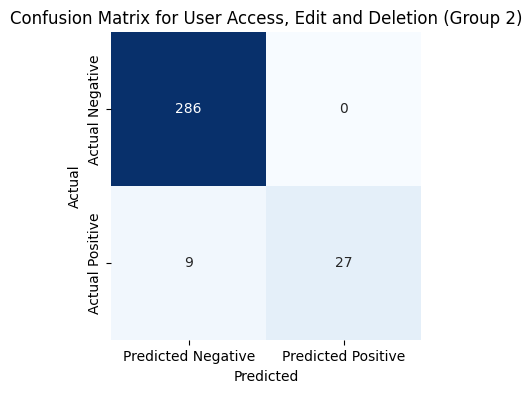


Computing combined overall metrics for Group 1 and Group 2...

Combined Metrics for Group 1 and Group 2:
Overall Accuracy: 0.97776
Overall Precision: 0.9495327102803738
Overall Recall: 0.9227974568574023
Overall F1 Score: 0.9359742054352833
Combined Metrics -> Accuracy: 0.97776, Precision: 0.9495327102803738, Recall: 0.9227974568574023, F1: 0.9359742054352833

Plotting combined confusion matrices for each category (Group 1 + Group 2)...


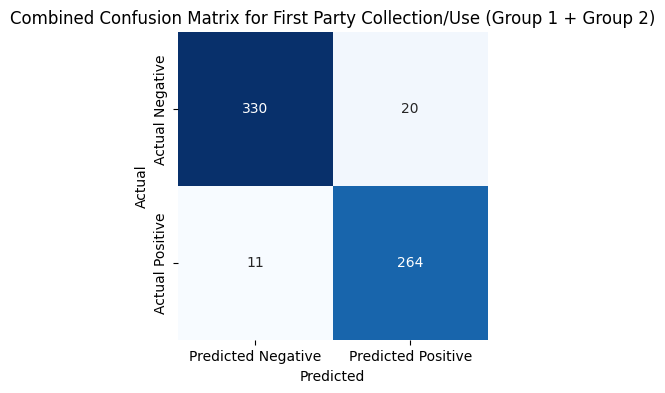


First Party Collection/Use - Combined Confusion Matrix (Group 1 + Group 2):
TP: 264, FP: 20, FN: 11, TN: 330


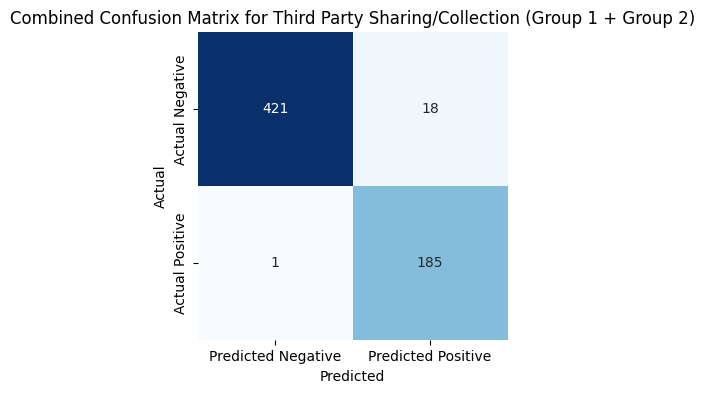


Third Party Sharing/Collection - Combined Confusion Matrix (Group 1 + Group 2):
TP: 185, FP: 18, FN: 1, TN: 421


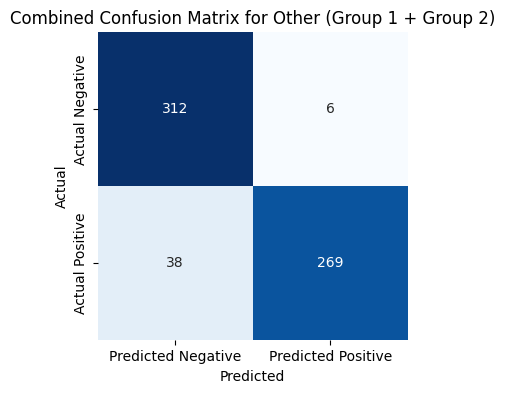


Other - Combined Confusion Matrix (Group 1 + Group 2):
TP: 269, FP: 6, FN: 38, TN: 312


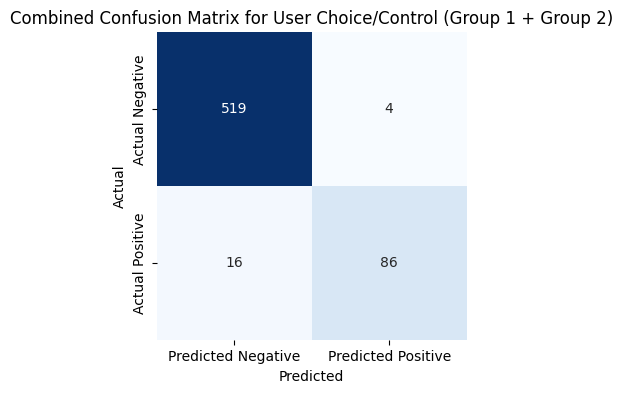


User Choice/Control - Combined Confusion Matrix (Group 1 + Group 2):
TP: 86, FP: 4, FN: 16, TN: 519


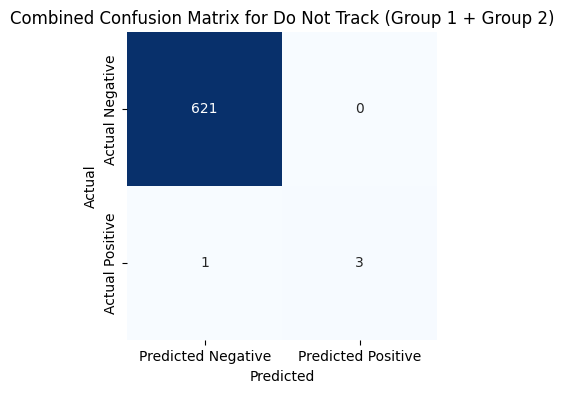


Do Not Track - Combined Confusion Matrix (Group 1 + Group 2):
TP: 3, FP: 0, FN: 1, TN: 621


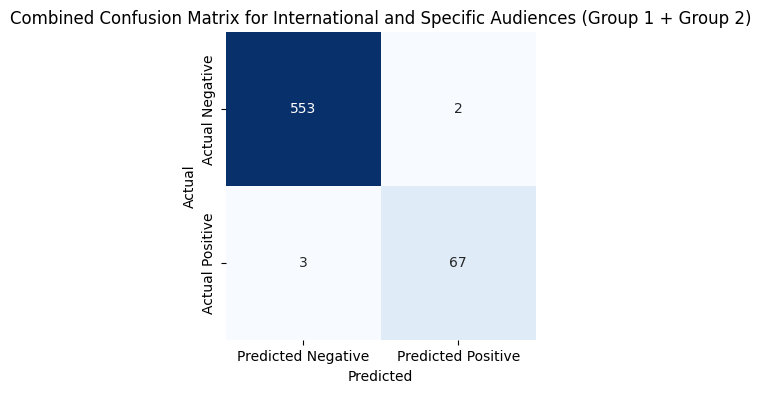


International and Specific Audiences - Combined Confusion Matrix (Group 1 + Group 2):
TP: 67, FP: 2, FN: 3, TN: 553


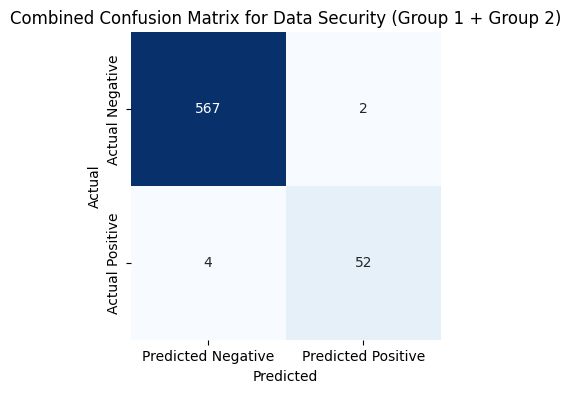


Data Security - Combined Confusion Matrix (Group 1 + Group 2):
TP: 52, FP: 2, FN: 4, TN: 567


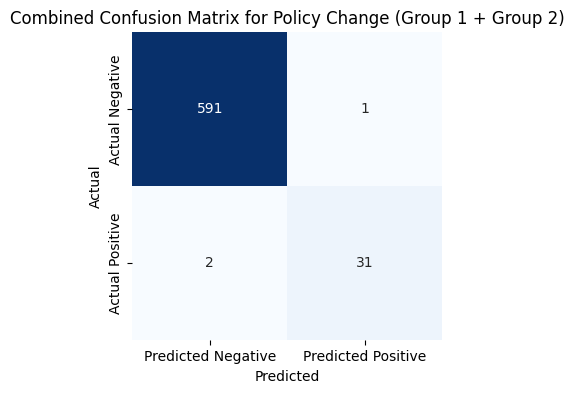


Policy Change - Combined Confusion Matrix (Group 1 + Group 2):
TP: 31, FP: 1, FN: 2, TN: 591


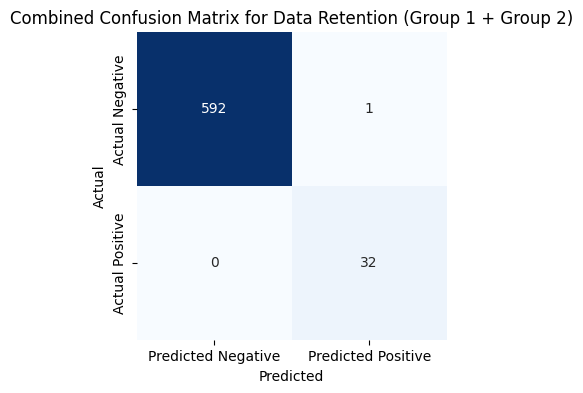


Data Retention - Combined Confusion Matrix (Group 1 + Group 2):
TP: 32, FP: 1, FN: 0, TN: 592


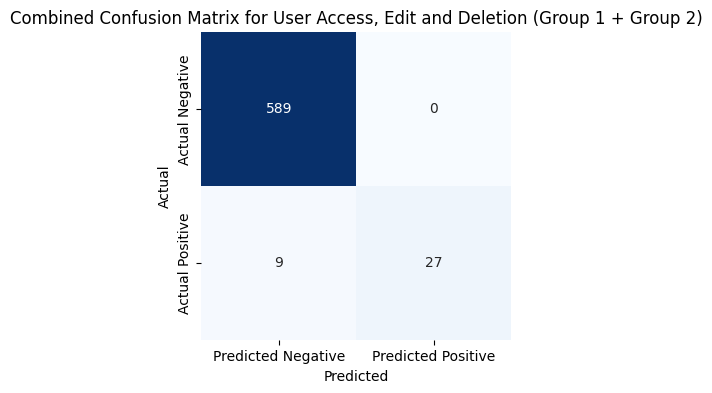


User Access, Edit and Deletion - Combined Confusion Matrix (Group 1 + Group 2):
TP: 27, FP: 0, FN: 9, TN: 589


{'G1': {'accuracy': 0.9742574257425742,
  'precision': 0.8712871287128713,
  'recall': 0.8712871287128713,
  'f1': 0.8712871287128713,
  'category_results': {'First Party Collection/Use': {'TP': 102,
    'FP': 16,
    'TN': 181,
    'FN': 4},
   'Third Party Sharing/Collection': {'TP': 50, 'FP': 10, 'TN': 242, 'FN': 1},
   'Other': {'TP': 66, 'FP': 5, 'TN': 207, 'FN': 25},
   'User Choice/Control': {'TP': 4, 'FP': 3, 'TN': 289, 'FN': 7},
   'Do Not Track': {'TP': 1, 'FP': 0, 'TN': 302, 'FN': 0},
   'International and Specific Audiences': {'TP': 15,
    'FP': 2,
    'TN': 285,
    'FN': 1},
   'Data Security': {'TP': 14, 'FP': 2, 'TN': 287, 'FN': 0},
   'Policy Change': {'TP': 10, 'FP': 1, 'TN': 291, 'FN': 1},
   'Data Retention': {'TP': 2, 'FP': 0, 'TN': 301, 'FN': 0},
   'User Access, Edit and Deletion': {'TP': 0, 'FP': 0, 'TN': 303, 'FN': 0}}},
 'G2': {'accuracy': 0.981055900621118,
  'precision': 0.9804432855280313,
  'recall': 0.9423558897243107,
  'f1': 0.9610223642172524,
  'cate

In [6]:
# Prompt 2
from util.main import PrivacyPolicyClassifier
from util.generating_cm import compute_grouped_metrics,compute_confusion_matrix_technique1

classifier = PrivacyPolicyClassifier(model_path=quantized_model_path)

# Define the prompt template
prompt_template_2 = ("You are a legal compliance expert specializing in privacy policies."
                "Classify the given privacy policy text into one of these categories: First Party Collection/Use, Third Party Sharing/Collection, Other, User Choice/Control, Do Not Track, International and Specific Audiences, Data Security, Policy Change, Data Retention, User Access, Edit and Deletion."
                "For example, if the policy mentions data sharing with third parties, it falls under 'Third Party Sharing/Collection.' Output the category in a single line.")



q_p2f11 = classifier.predict_and_evaluate(
    prompt_template=prompt_template_2, 
    test_data_path=test_data_path,
    num_test_data=num_entries,
    model_type=model_type,
    prompt_number=2
)

compute_confusion_matrix_technique1(q_p2f11)
compute_grouped_metrics(q_p2f11)

Unused kwargs: ['_load_in_4bit', '_load_in_8bit', 'quant_method']. These kwargs are not used in <class 'transformers.utils.quantization_config.BitsAndBytesConfig'>.
`low_cpu_mem_usage` was None, now set to True since model is quantized.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

/home/bhavani/.local/lib/python3.10/site-packages/transformers/generation/utils.py:1797: UserWarning: You are calling .generate() with the `input_ids` being on a device type different than your model's device. `input_ids` is on cpu, whereas the model is on cuda. You may experience unexpected behaviors or slower generation. Please make sure that you have put `input_ids` to the correct device by calling for example input_ids = input_ids.to('cuda') before running `.generate()`.
  warnings.warn(


Generated new tokens: Other
['▁Other']
Elapsed Time: 1.3014249801635742
New tokens generated: 1
Tokens generated per second: 0.77 tokens/s
Predicted categories:['Other']
Privacy Policy Text: PRIVACY POLICY    Buffalo Wild Wings, Inc., its franchisees, marketing agencies, and affiliated contractors, as specifically identified here (collectively "BWW," "we" or "us"), appreciate your patronage and take your privacy very seriously. As a result, we've developed the following policy terms which apply to all websites and mobile applications owned and operated by BWW, specifically including the buffalowildwings.com site and the Fight4Fandom Mobile App (collectively the "Site(s)").
Actual Category: ['Other']
Predicted Categories: ['Other']

Generated new tokens: First Party Collection/Use
['▁First', '▁Party', '▁Collection', '/', 'Use']
Elapsed Time: 2.499095916748047
New tokens generated: 5
Tokens generated per second: 2.00 tokens/s
Predicted categories:['First Party Collection/Use']
Privacy Po

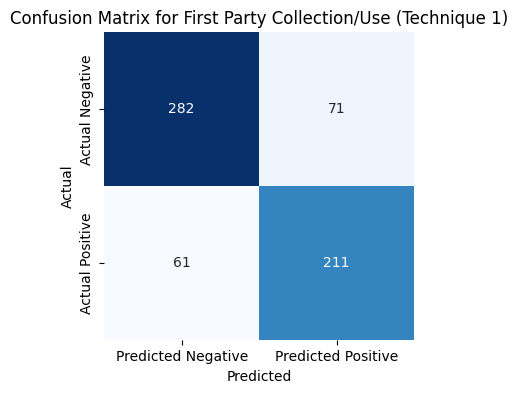


Plotting confusion matrix for category: Third Party Sharing/Collection


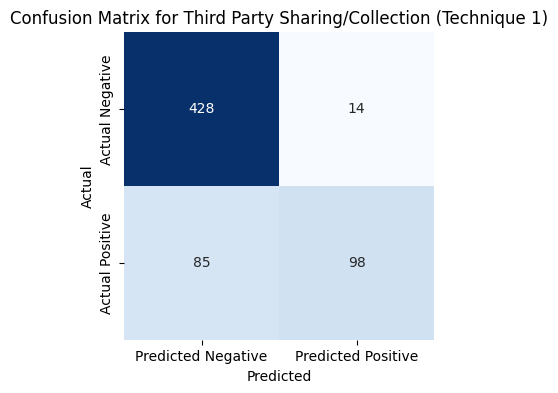


Plotting confusion matrix for category: Other


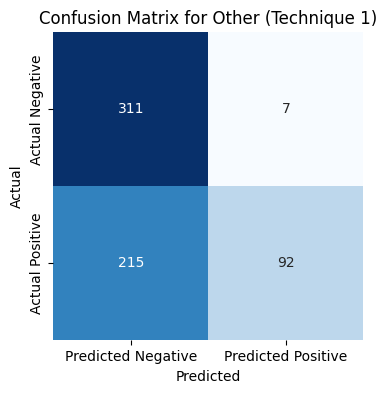


Plotting confusion matrix for category: User Choice/Control


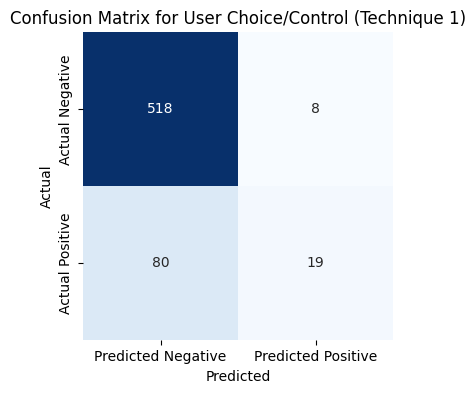


Plotting confusion matrix for category: Do Not Track


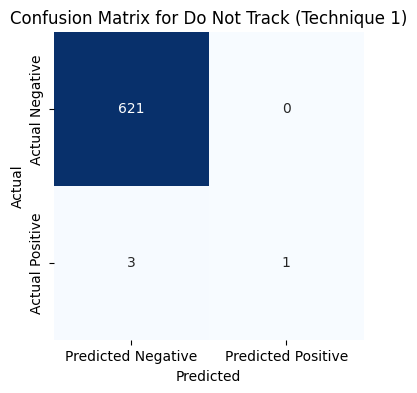


Plotting confusion matrix for category: International and Specific Audiences


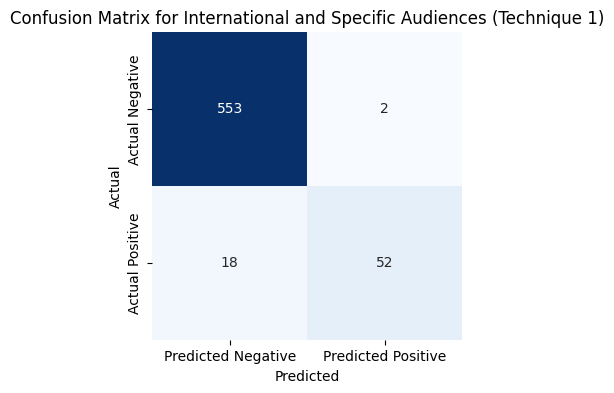


Plotting confusion matrix for category: Data Security


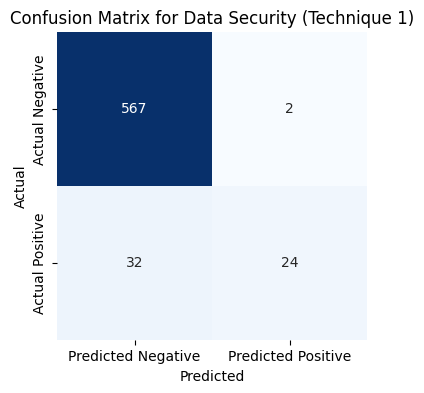


Plotting confusion matrix for category: Policy Change


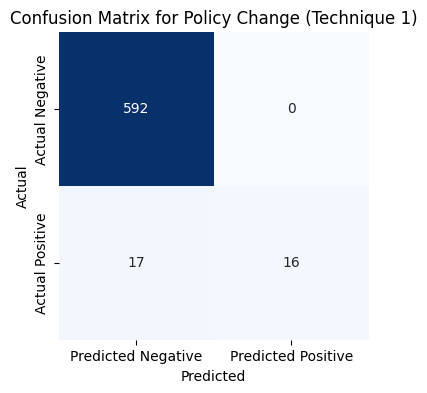


Plotting confusion matrix for category: Data Retention


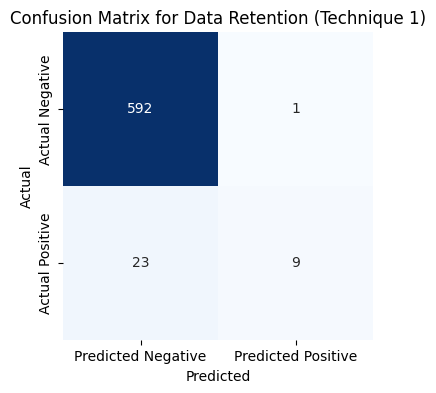


Plotting confusion matrix for category: User Access, Edit and Deletion


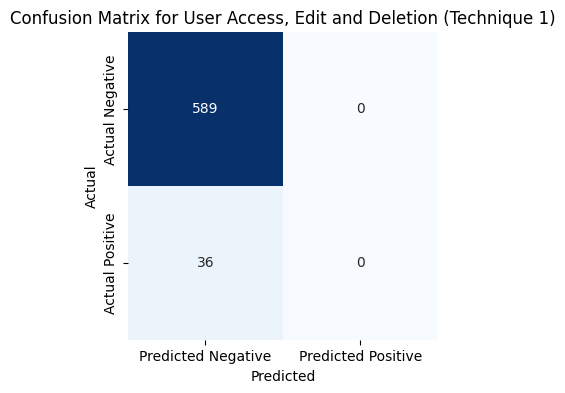


Overall tp: 522
Overall tn: 5053
Overall fp: 105
Overall fn: 570
Overall Precision (Technique 1): 0.8325358851674641
Overall Recall (Technique 1): 0.47802197802197804
Overall F1 Score (Technique 1): 0.6073298429319373
Overall Accuracy (Technique 1): 0.892
TP 211
TN 282
FP 71
FN 61

TP 98
TN 428
FP 14
FN 85

TP 92
TN 311
FP 7
FN 215

TP 19
TN 518
FP 8
FN 80

TP 1
TN 621
FP 0
FN 3

TP 52
TN 553
FP 2
FN 18

TP 24
TN 567
FP 2
FN 32

TP 16
TN 592
FP 0
FN 17

TP 9
TN 592
FP 1
FN 23

TP 0
TN 589
FP 0
FN 36

Micro Precision: 0.8325358851674641
Micro Recall: 0.47802197802197804
Micro F1 Score: 0.6073298429319373
Micro Accuracy: 0.892
Macro Precision: 0.8042263469391129
Macro Recall: 0.39903749350979323
Macro F1 Score: 0.5086637087816344
Weighted Precision: 0.8273828219375138
Weighted Recall: 0.47802197802197804
Weighted F1 Score: 0.5733730728461277
Sample Average Precision: 0.8304
Sample Average Recall: 0.5783911111111111
Sample Average F1 Score: 0.6479466666666667

Overall Metrics (Technique 

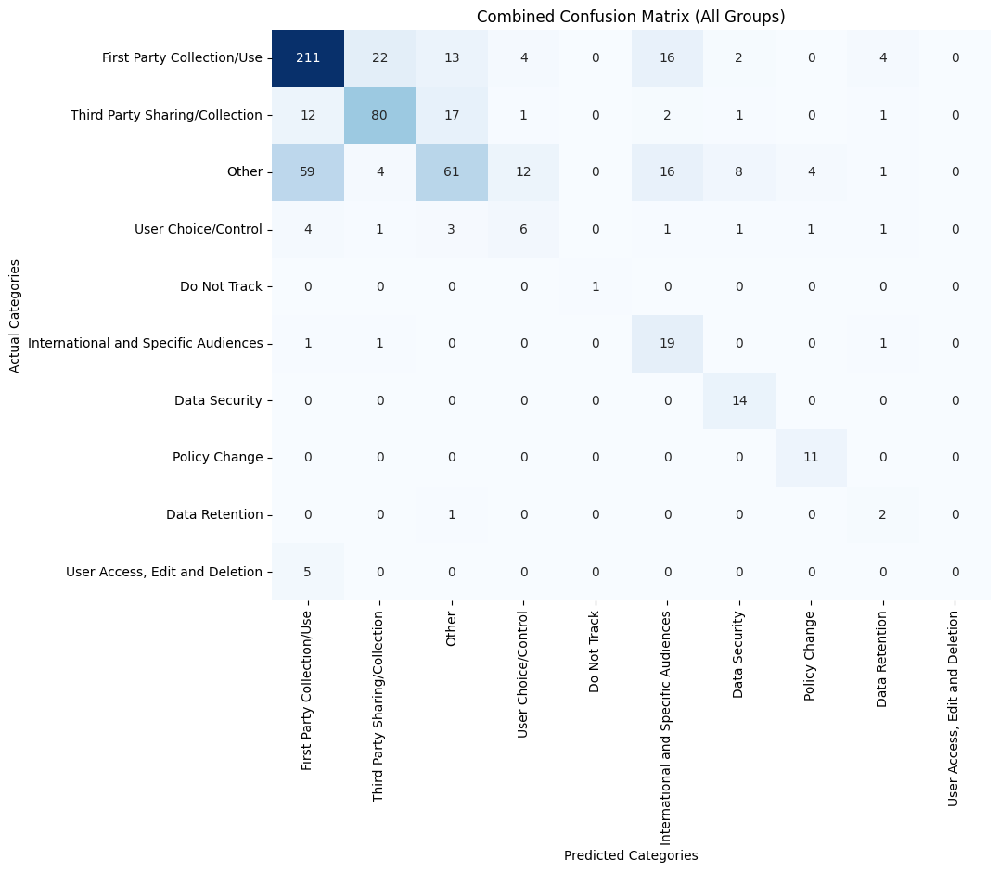


Metrics for Group 1:
Accuracy: 0.9582781456953643
Precision: 0.7913907284768212
Recall: 0.7913907284768212
F1 Score: 0.7913907284768213

Metrics for Group 2:
Accuracy: 0.9662538699690403
Precision: 0.9601593625498008
Recall: 0.9014962593516209
F1 Score: 0.929903536977492

Confusion Matrices for Group 1:


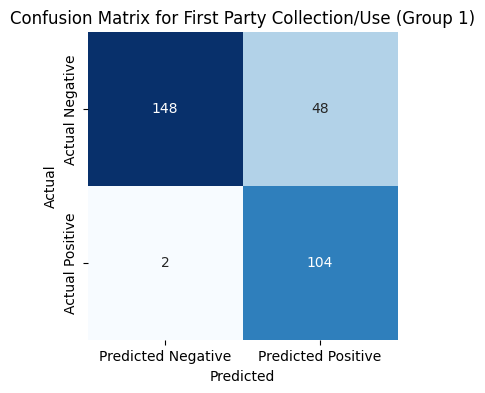

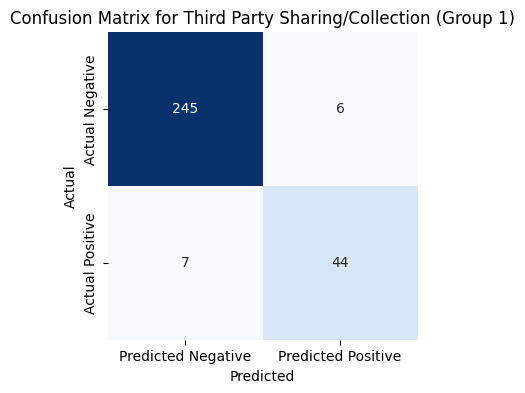

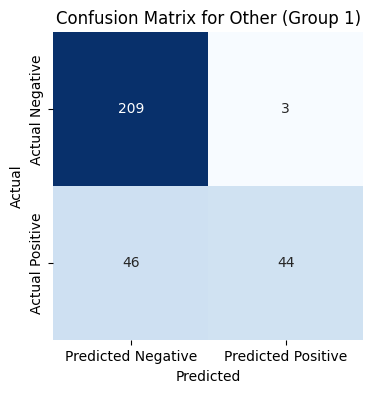

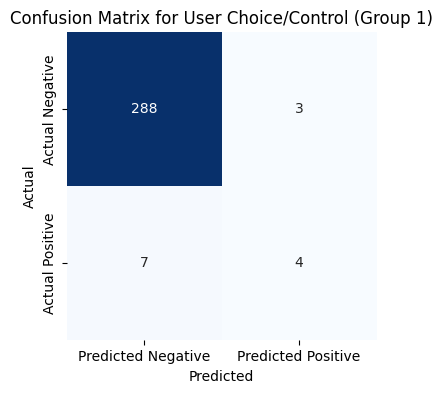

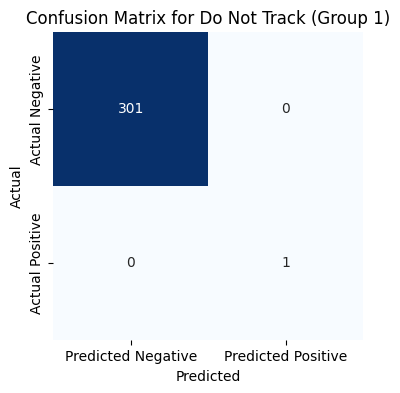

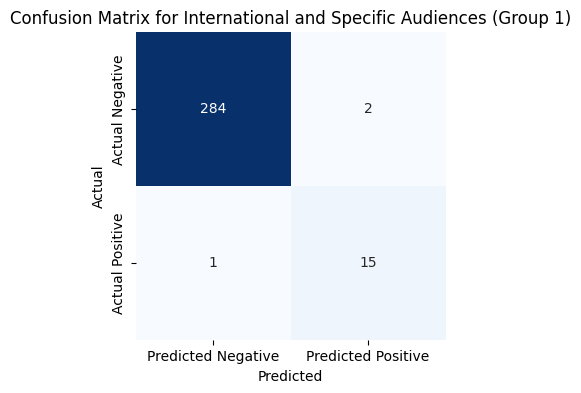

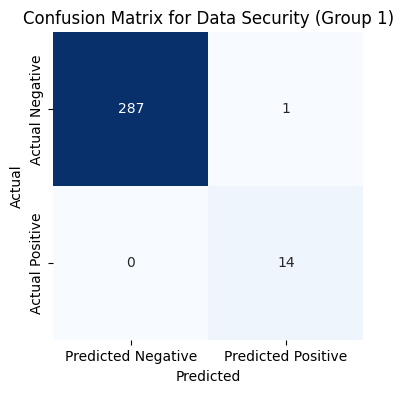

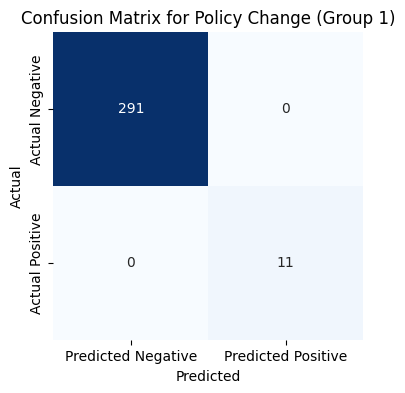

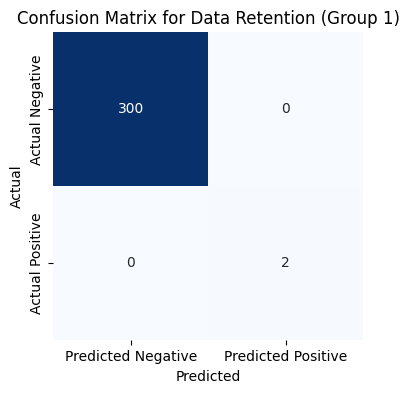

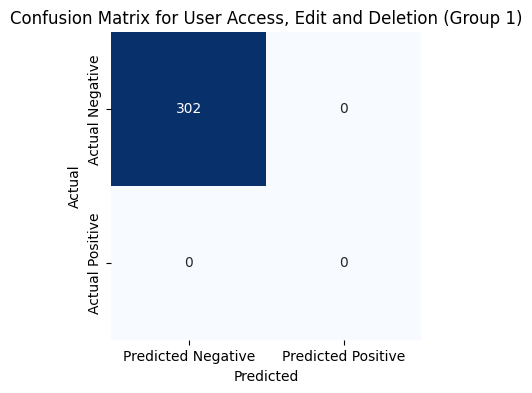


Confusion Matrices for Group 2:


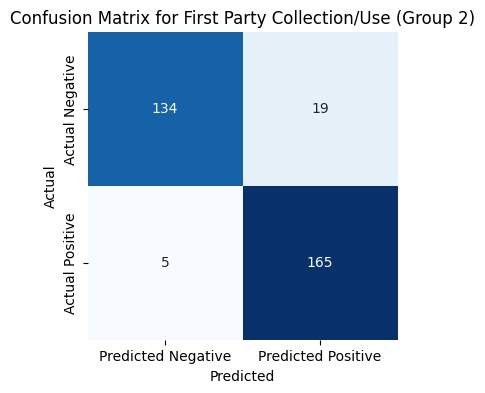

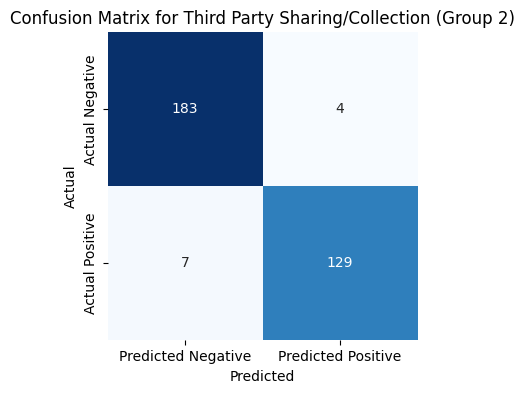

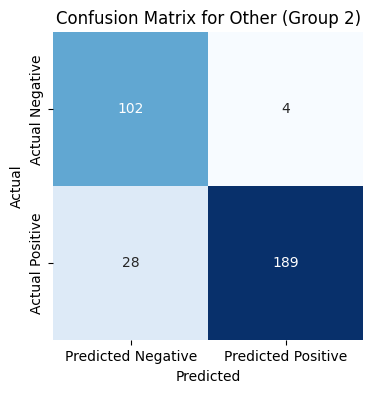

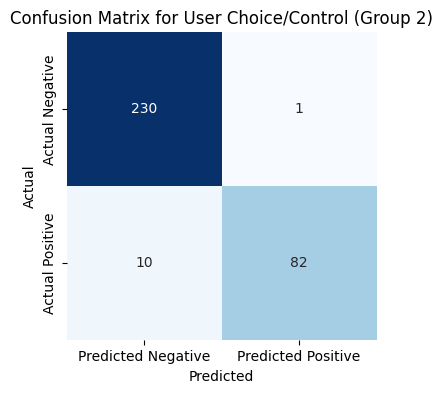

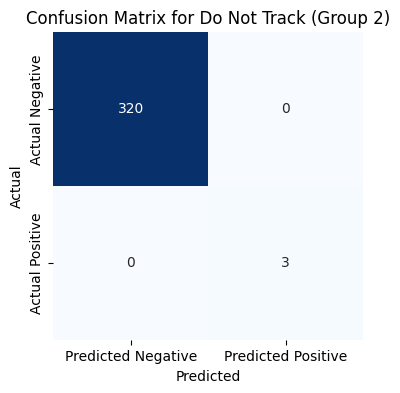

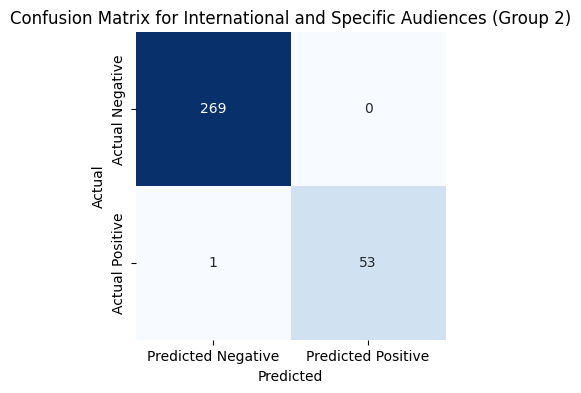

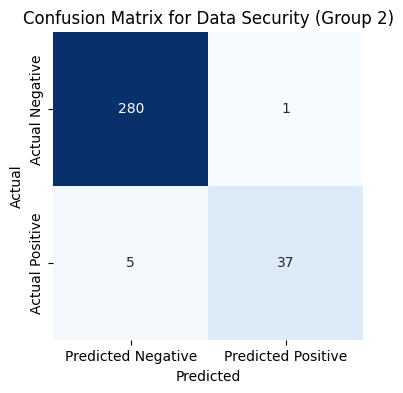

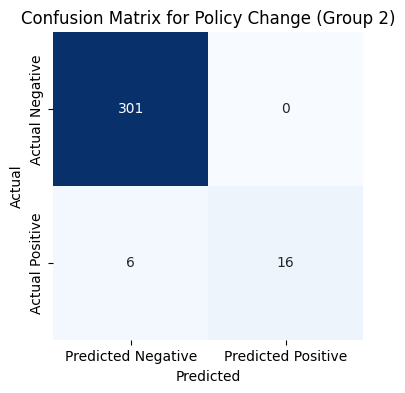

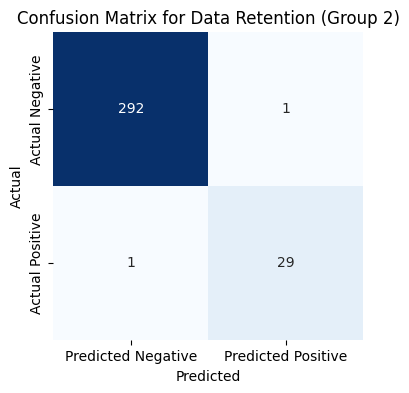

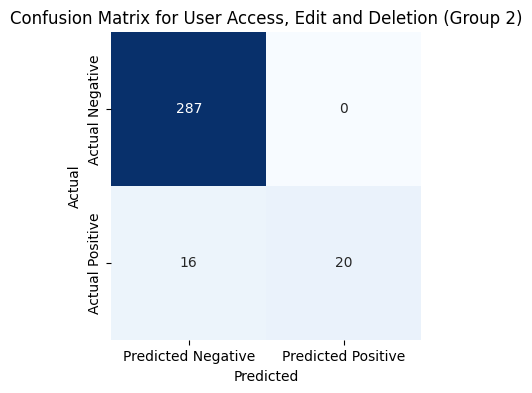


Computing combined overall metrics for Group 1 and Group 2...

Combined Metrics for Group 1 and Group 2:
Overall Accuracy: 0.9624
Overall Precision: 0.9118483412322275
Overall Recall: 0.8713768115942029
Overall F1 Score: 0.8911533117183881
Combined Metrics -> Accuracy: 0.9624, Precision: 0.9118483412322275, Recall: 0.8713768115942029, F1: 0.8911533117183881

Plotting combined confusion matrices for each category (Group 1 + Group 2)...


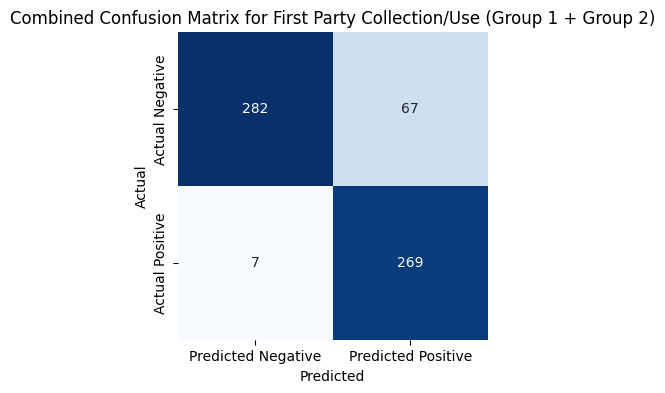


First Party Collection/Use - Combined Confusion Matrix (Group 1 + Group 2):
TP: 269, FP: 67, FN: 7, TN: 282


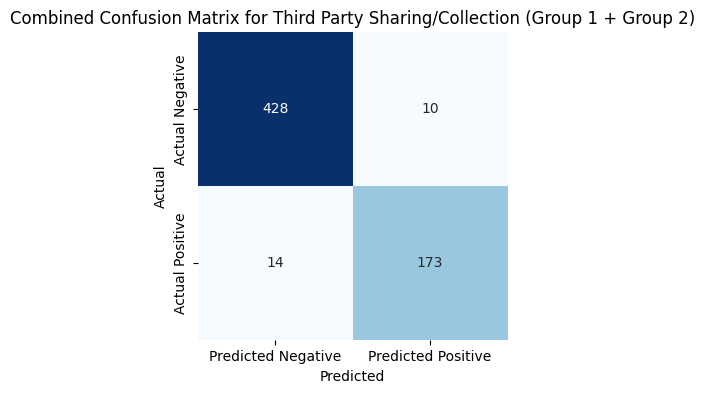


Third Party Sharing/Collection - Combined Confusion Matrix (Group 1 + Group 2):
TP: 173, FP: 10, FN: 14, TN: 428


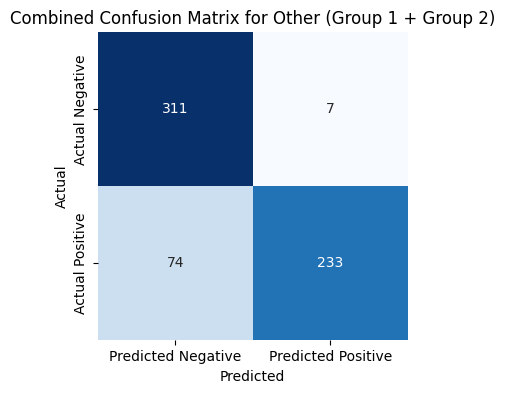


Other - Combined Confusion Matrix (Group 1 + Group 2):
TP: 233, FP: 7, FN: 74, TN: 311


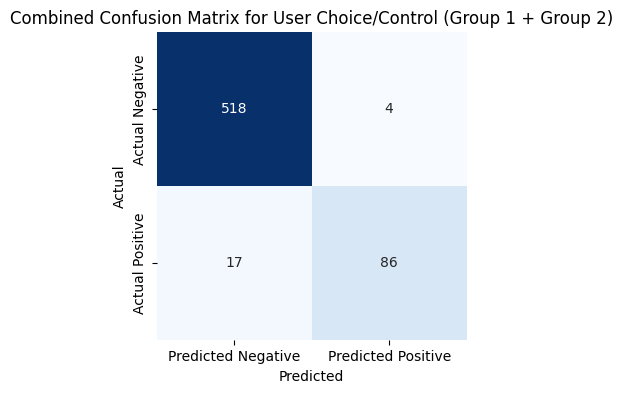


User Choice/Control - Combined Confusion Matrix (Group 1 + Group 2):
TP: 86, FP: 4, FN: 17, TN: 518


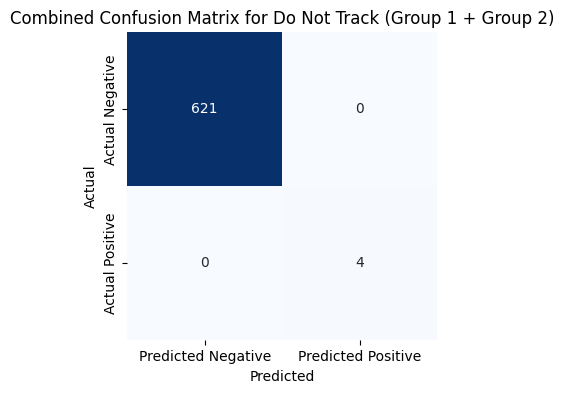


Do Not Track - Combined Confusion Matrix (Group 1 + Group 2):
TP: 4, FP: 0, FN: 0, TN: 621


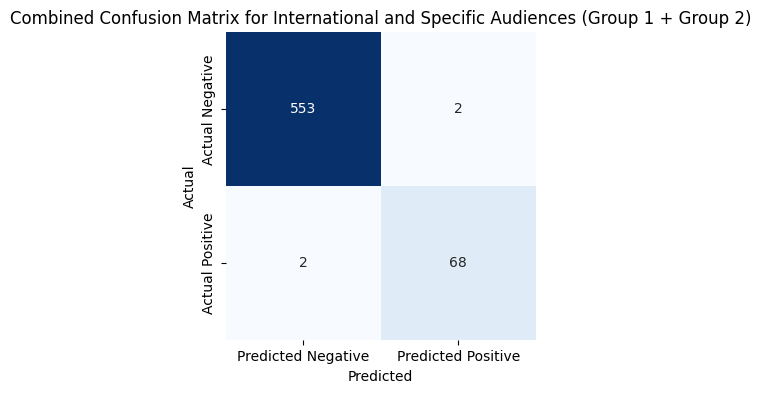


International and Specific Audiences - Combined Confusion Matrix (Group 1 + Group 2):
TP: 68, FP: 2, FN: 2, TN: 553


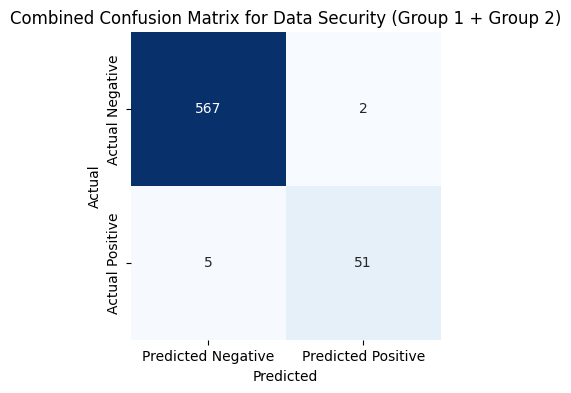


Data Security - Combined Confusion Matrix (Group 1 + Group 2):
TP: 51, FP: 2, FN: 5, TN: 567


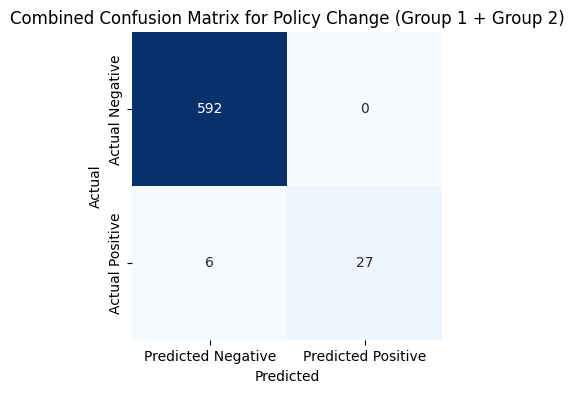


Policy Change - Combined Confusion Matrix (Group 1 + Group 2):
TP: 27, FP: 0, FN: 6, TN: 592


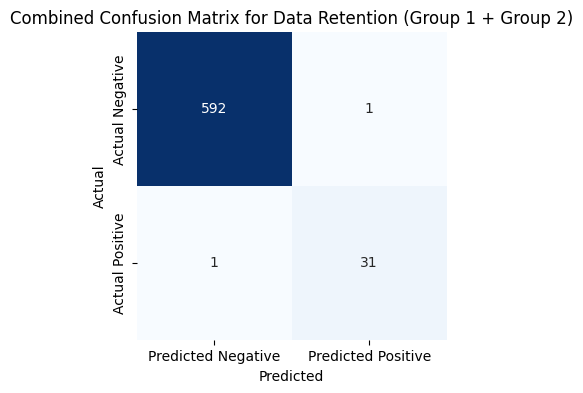


Data Retention - Combined Confusion Matrix (Group 1 + Group 2):
TP: 31, FP: 1, FN: 1, TN: 592


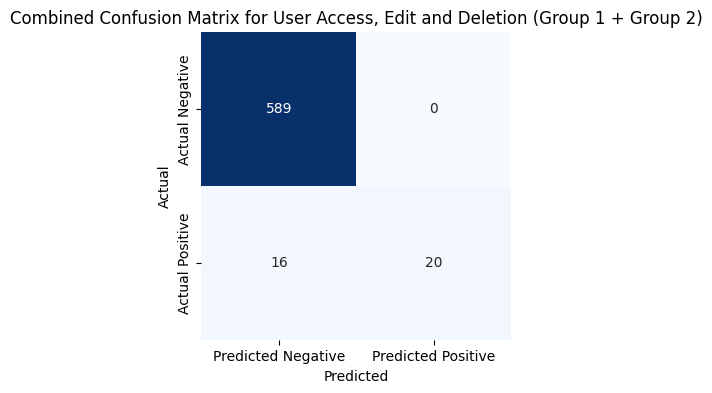


User Access, Edit and Deletion - Combined Confusion Matrix (Group 1 + Group 2):
TP: 20, FP: 0, FN: 16, TN: 589
New tokens list: [1, 5, 5, 5, 5, 5, 5, 6, 6, 6, 1, 2, 2, 6, 6, 6, 2, 5, 1, 5, 5, 5, 5, 1, 5, 6, 6, 1, 5, 5, 1, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 5, 8, 6, 6, 8, 5, 3, 8, 5, 5, 5, 5, 1, 3, 2, 2, 2, 1, 2, 2, 5, 5, 5, 5, 5, 5, 6, 5, 5, 1, 6, 6, 2, 2, 6, 1, 6, 5, 1, 1, 1, 5, 5, 5, 5, 1, 6, 1, 5, 5, 5, 5, 5, 5, 6, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 6, 2, 1, 1, 5, 5, 5, 5, 5, 1, 3, 8, 5, 6, 6, 5, 6, 6, 6, 2, 20, 5, 1, 1, 5, 5, 5, 6, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 5, 5, 5, 6, 6, 5, 5, 5, 5, 3, 2, 1, 6, 2, 1, 5, 1, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 6, 5, 5, 5, 5, 6, 6, 2, 1, 1, 6, 6, 6, 2, 5, 6, 5, 1, 1, 1, 1, 6, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 5, 5, 5, 6, 5, 8, 5, 1, 1, 2, 2, 5, 2, 1, 5, 5, 1, 5, 5, 5, 5, 5, 5, 6, 2, 5, 1, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 6, 6, 6, 6, 1, 5, 6, 6, 6, 5,

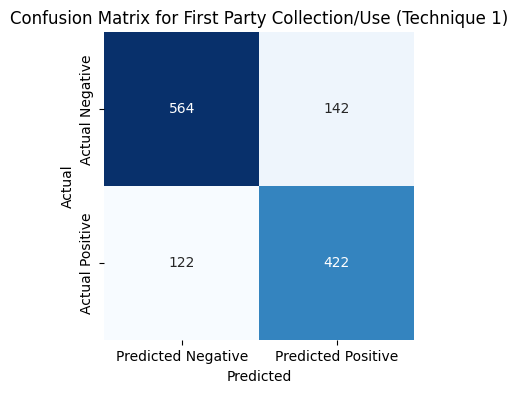


Plotting confusion matrix for category: Third Party Sharing/Collection


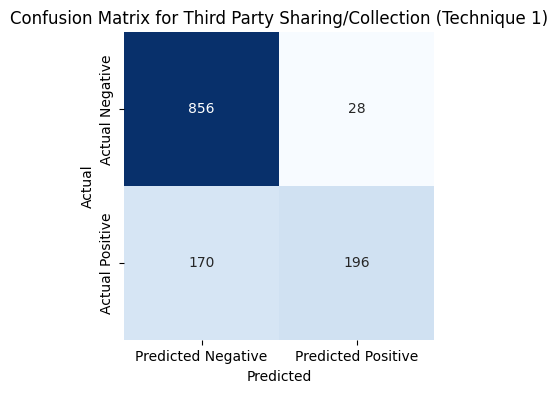


Plotting confusion matrix for category: Other


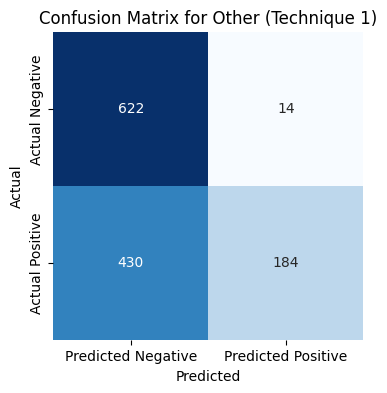


Plotting confusion matrix for category: User Choice/Control


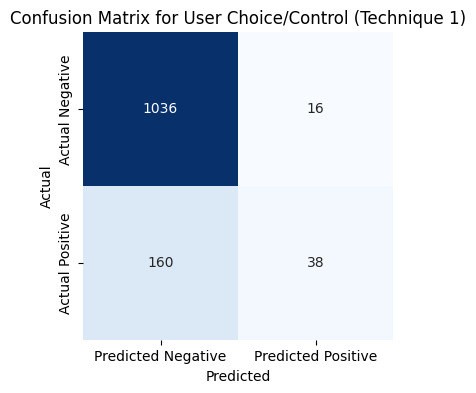


Plotting confusion matrix for category: Do Not Track


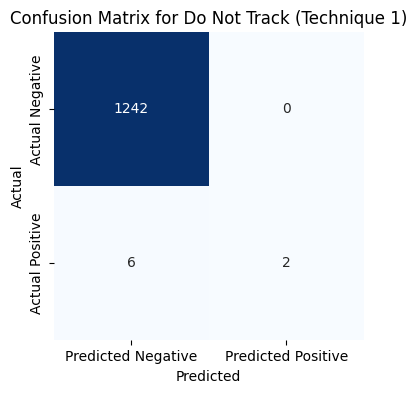


Plotting confusion matrix for category: International and Specific Audiences


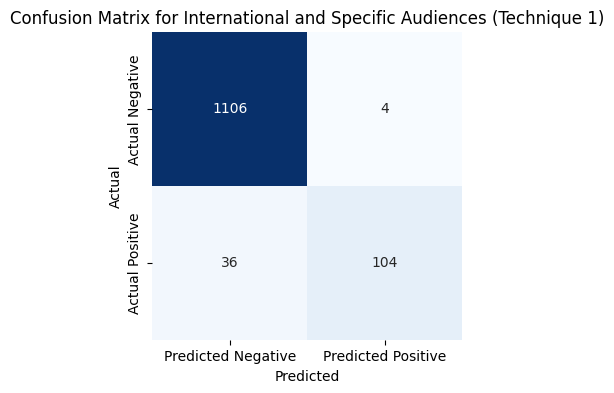


Plotting confusion matrix for category: Data Security


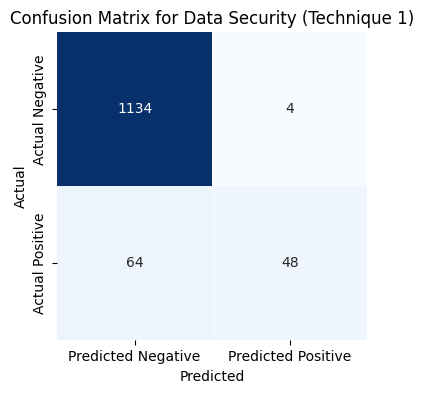


Plotting confusion matrix for category: Policy Change


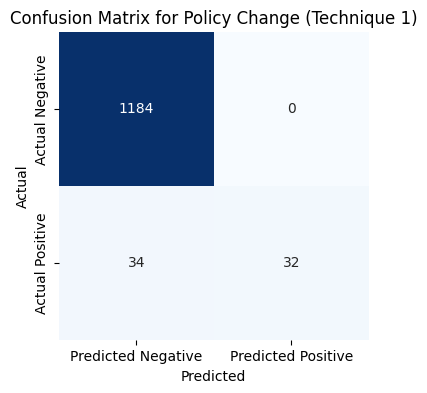


Plotting confusion matrix for category: Data Retention


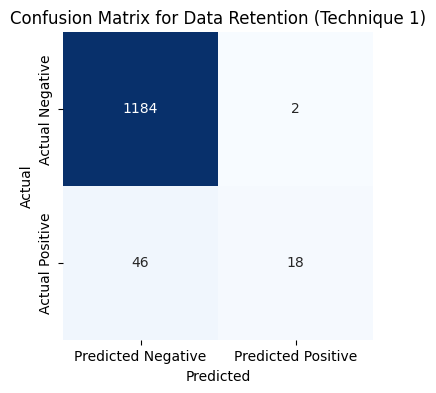


Plotting confusion matrix for category: User Access, Edit and Deletion


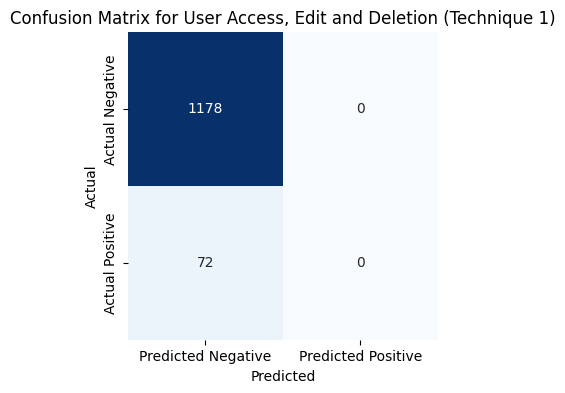


Overall tp: 1044
Overall tn: 10106
Overall fp: 210
Overall fn: 1140
Overall Precision (Technique 1): 0.8325358851674641
Overall Recall (Technique 1): 0.47802197802197804
Overall F1 Score (Technique 1): 0.6073298429319373
Overall Accuracy (Technique 1): 0.892
TP 422
TN 564
FP 142
FN 122

TP 196
TN 856
FP 28
FN 170

TP 184
TN 622
FP 14
FN 430

TP 38
TN 1036
FP 16
FN 160

TP 2
TN 1242
FP 0
FN 6

TP 104
TN 1106
FP 4
FN 36

TP 48
TN 1134
FP 4
FN 64

TP 32
TN 1184
FP 0
FN 34

TP 18
TN 1184
FP 2
FN 46

TP 0
TN 1178
FP 0
FN 72

Micro Precision: 0.8325358851674641
Micro Recall: 0.47802197802197804
Micro F1 Score: 0.6073298429319373
Micro Accuracy: 0.892
Macro Precision: 0.8042263469391129
Macro Recall: 0.39903749350979323
Macro F1 Score: 0.5086637087816344
Weighted Precision: 0.8273828219375138
Weighted Recall: 0.47802197802197804
Weighted F1 Score: 0.5733730728461277
Sample Average Precision: 0.8304
Sample Average Recall: 0.5783911111111111
Sample Average F1 Score: 0.6479466666666667

Overall

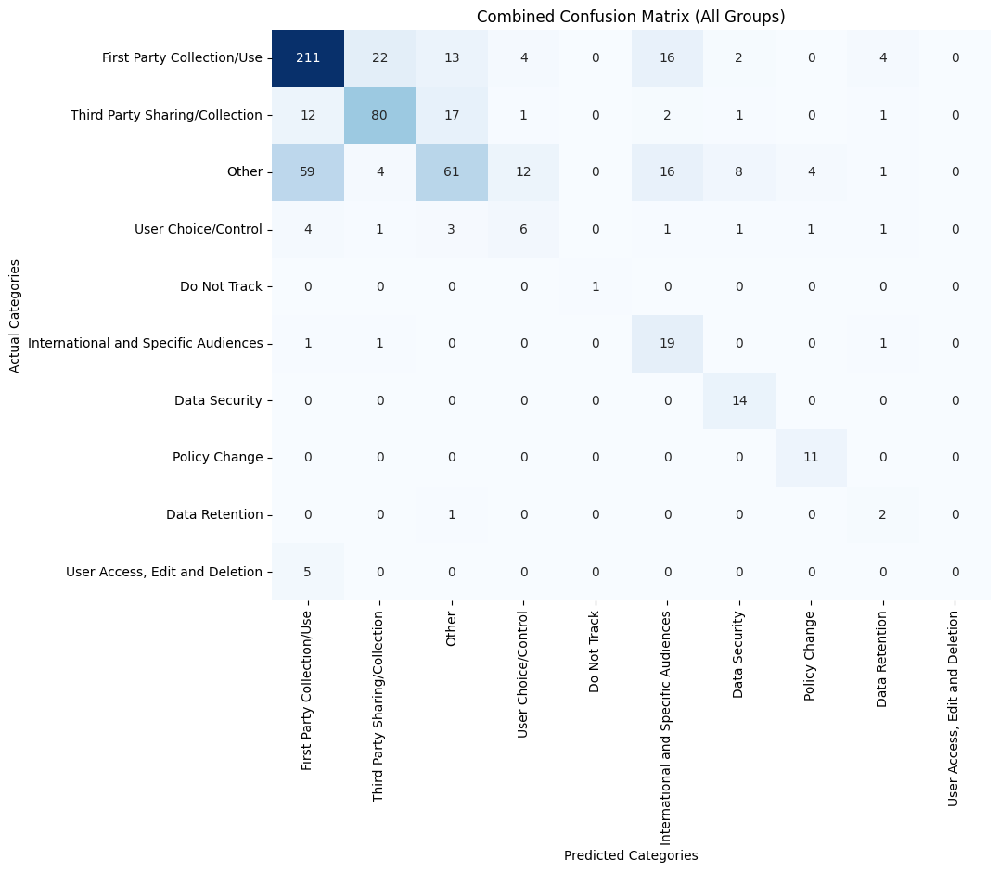


Metrics for Group 1:
Accuracy: 0.9582781456953643
Precision: 0.7913907284768212
Recall: 0.7913907284768212
F1 Score: 0.7913907284768213

Metrics for Group 2:
Accuracy: 0.9662538699690403
Precision: 0.9601593625498008
Recall: 0.9014962593516209
F1 Score: 0.929903536977492

Confusion Matrices for Group 1:


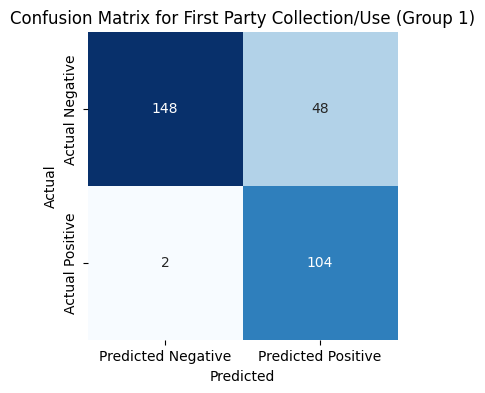

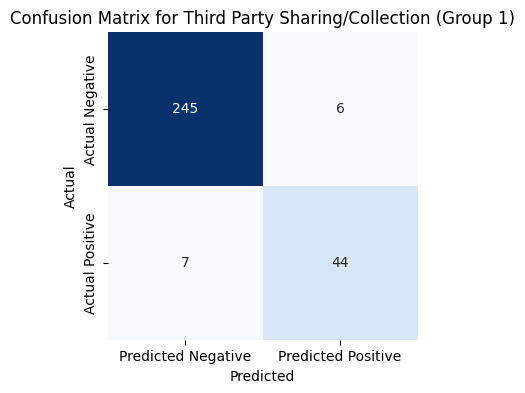

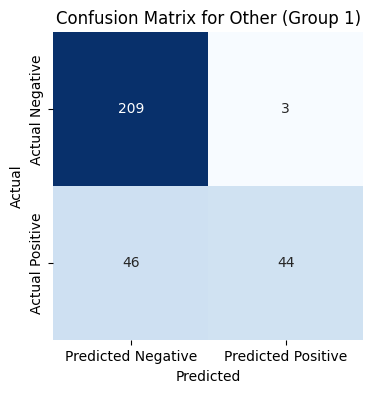

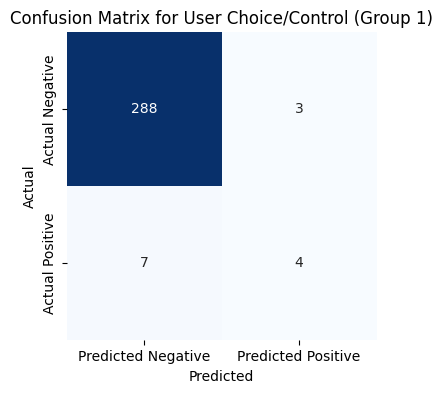

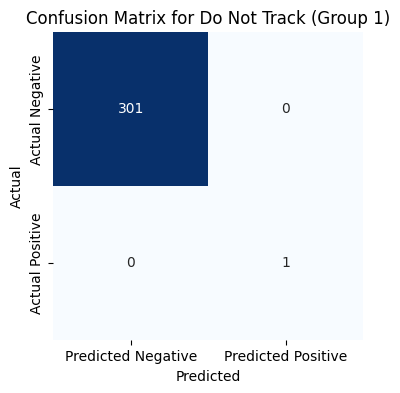

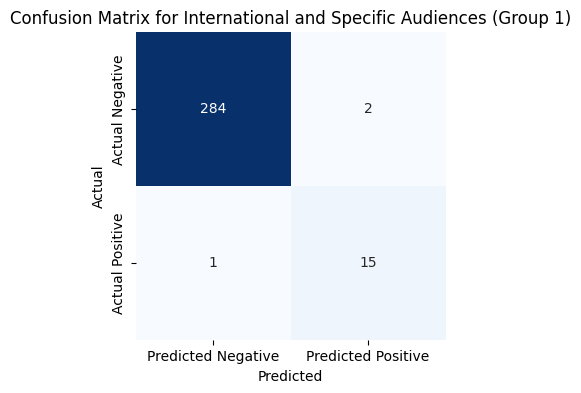

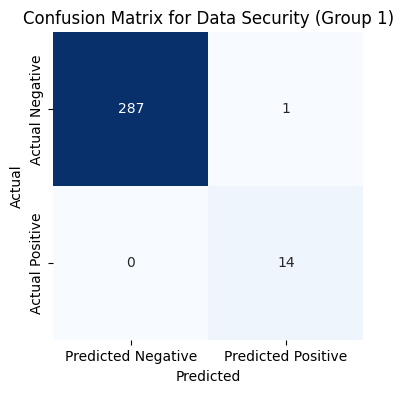

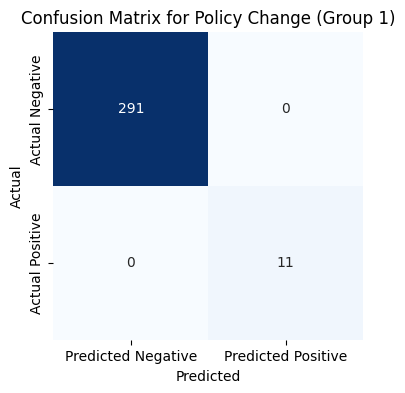

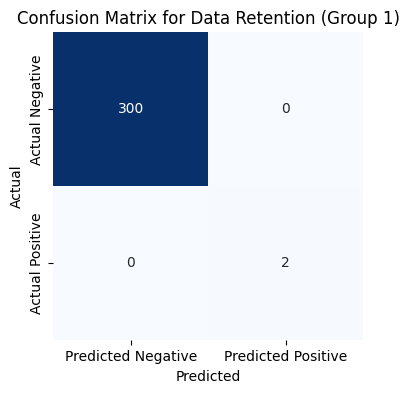

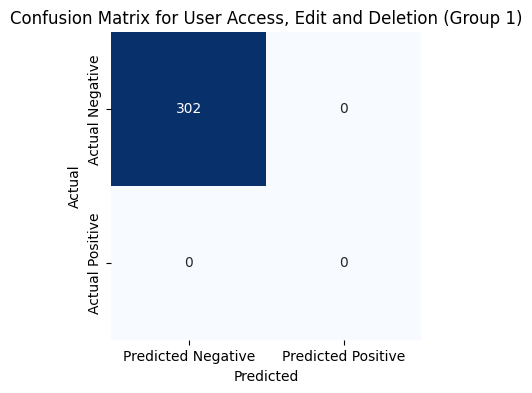


Confusion Matrices for Group 2:


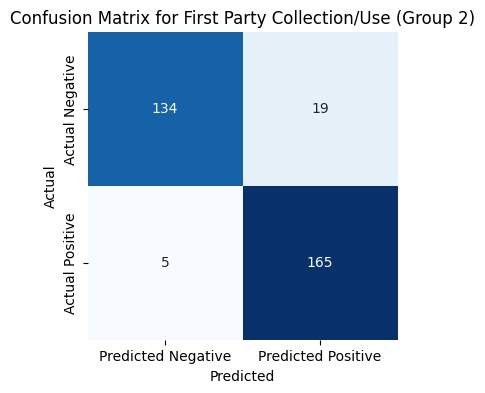

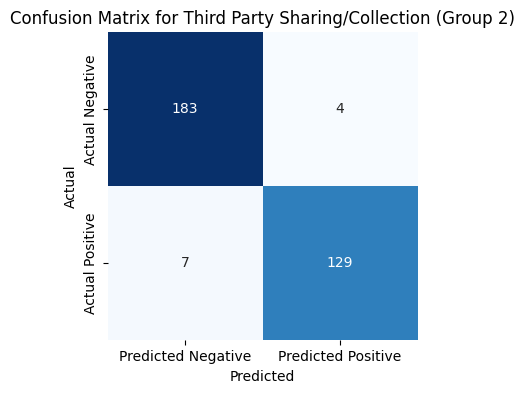

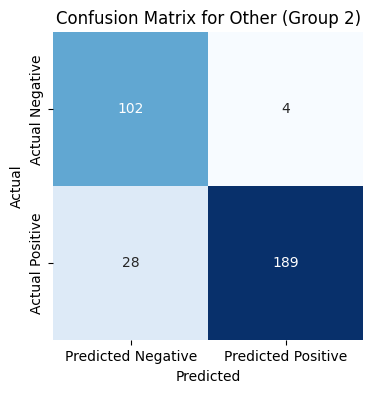

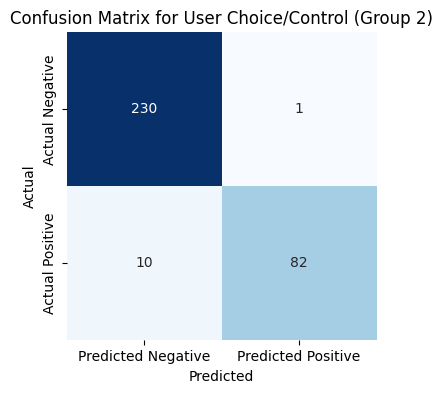

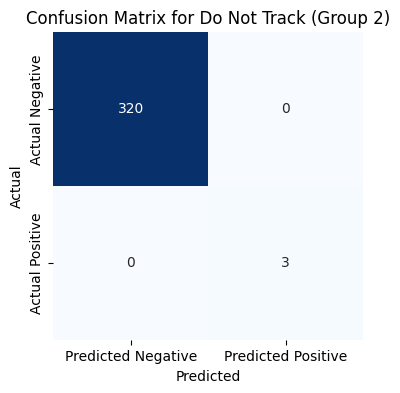

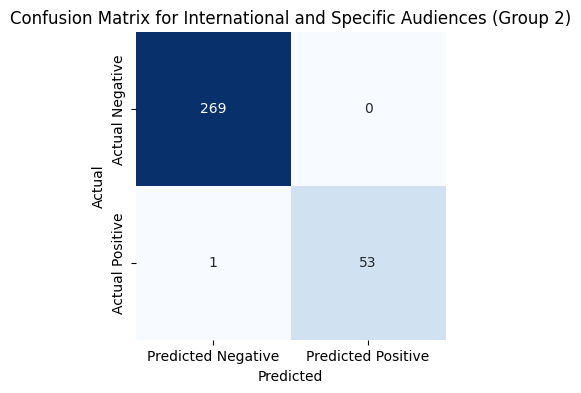

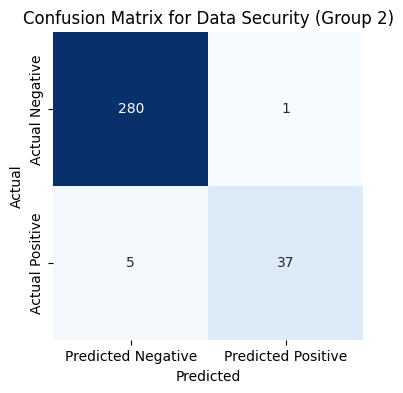

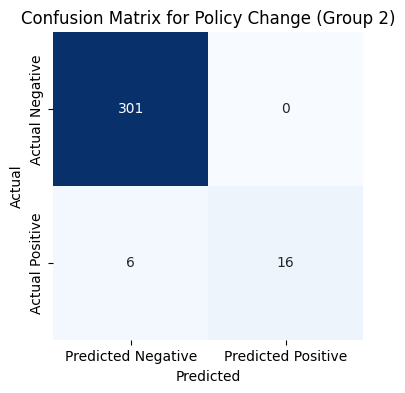

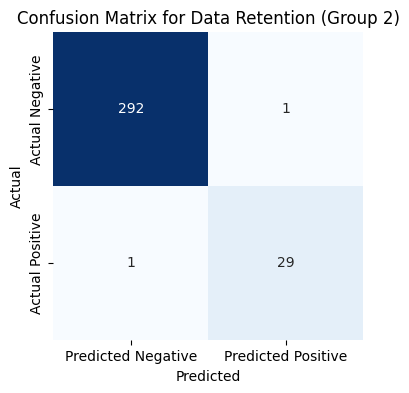

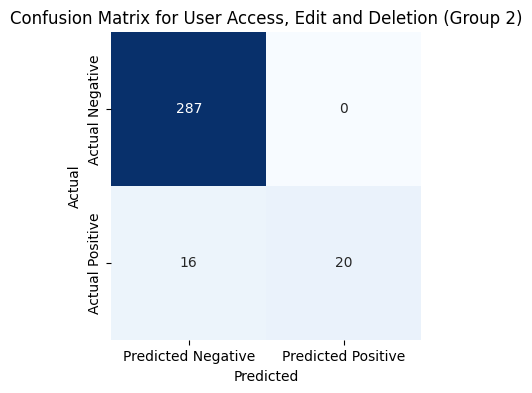


Computing combined overall metrics for Group 1 and Group 2...

Combined Metrics for Group 1 and Group 2:
Overall Accuracy: 0.9624
Overall Precision: 0.9118483412322275
Overall Recall: 0.8713768115942029
Overall F1 Score: 0.8911533117183881
Combined Metrics -> Accuracy: 0.9624, Precision: 0.9118483412322275, Recall: 0.8713768115942029, F1: 0.8911533117183881

Plotting combined confusion matrices for each category (Group 1 + Group 2)...


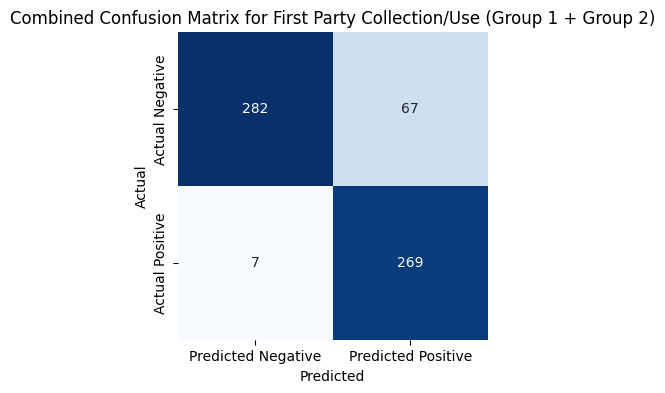


First Party Collection/Use - Combined Confusion Matrix (Group 1 + Group 2):
TP: 269, FP: 67, FN: 7, TN: 282


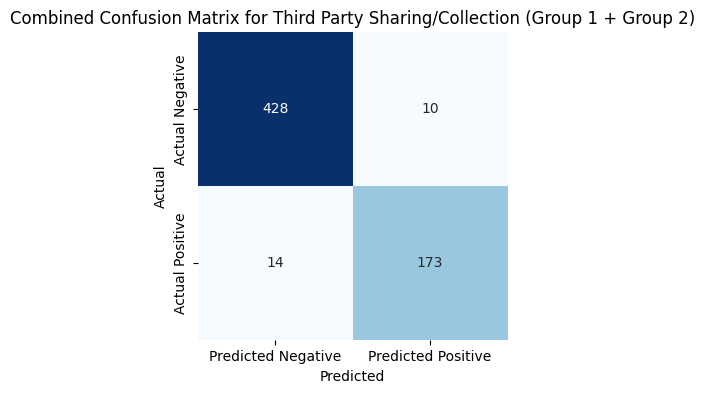


Third Party Sharing/Collection - Combined Confusion Matrix (Group 1 + Group 2):
TP: 173, FP: 10, FN: 14, TN: 428


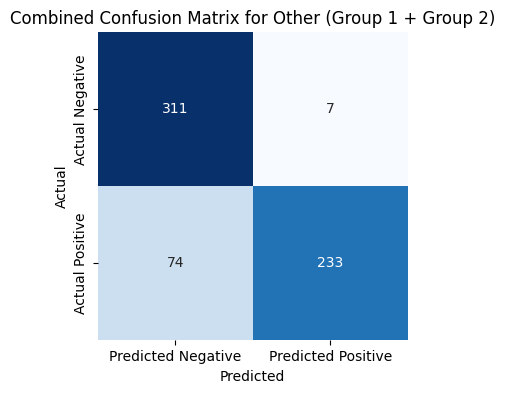


Other - Combined Confusion Matrix (Group 1 + Group 2):
TP: 233, FP: 7, FN: 74, TN: 311


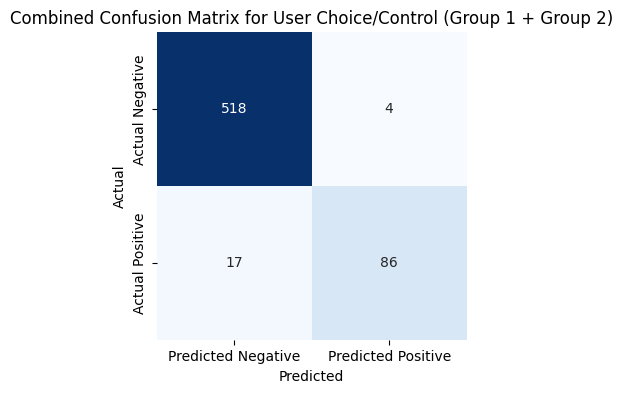


User Choice/Control - Combined Confusion Matrix (Group 1 + Group 2):
TP: 86, FP: 4, FN: 17, TN: 518


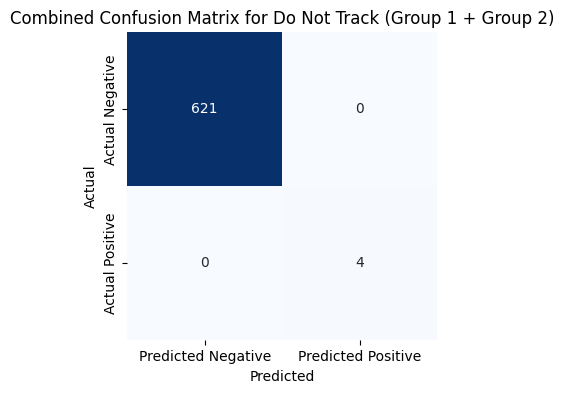


Do Not Track - Combined Confusion Matrix (Group 1 + Group 2):
TP: 4, FP: 0, FN: 0, TN: 621


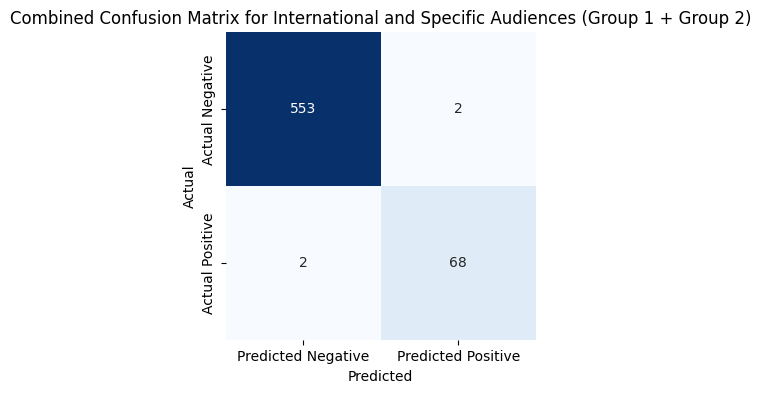


International and Specific Audiences - Combined Confusion Matrix (Group 1 + Group 2):
TP: 68, FP: 2, FN: 2, TN: 553


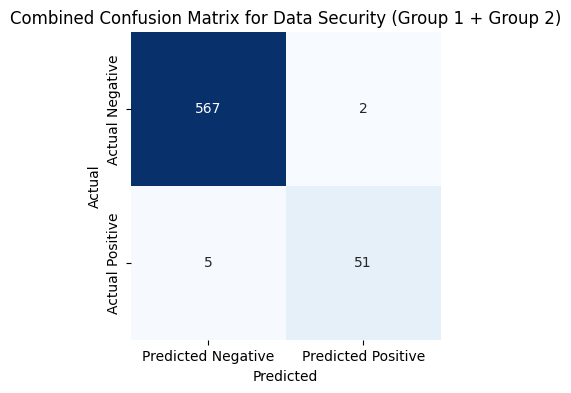


Data Security - Combined Confusion Matrix (Group 1 + Group 2):
TP: 51, FP: 2, FN: 5, TN: 567


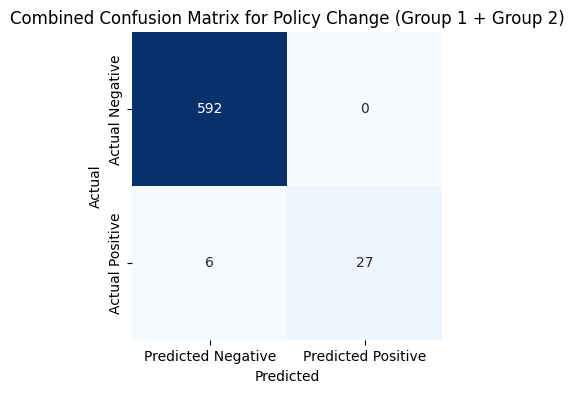


Policy Change - Combined Confusion Matrix (Group 1 + Group 2):
TP: 27, FP: 0, FN: 6, TN: 592


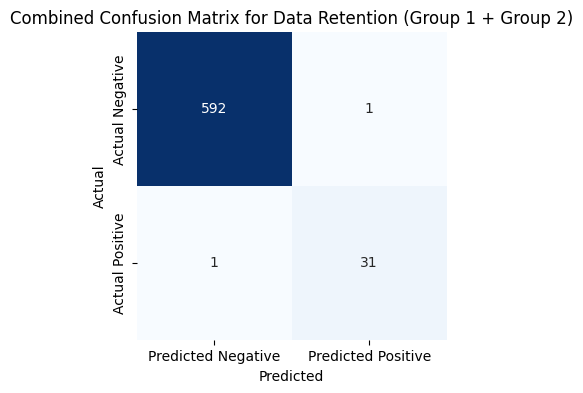


Data Retention - Combined Confusion Matrix (Group 1 + Group 2):
TP: 31, FP: 1, FN: 1, TN: 592


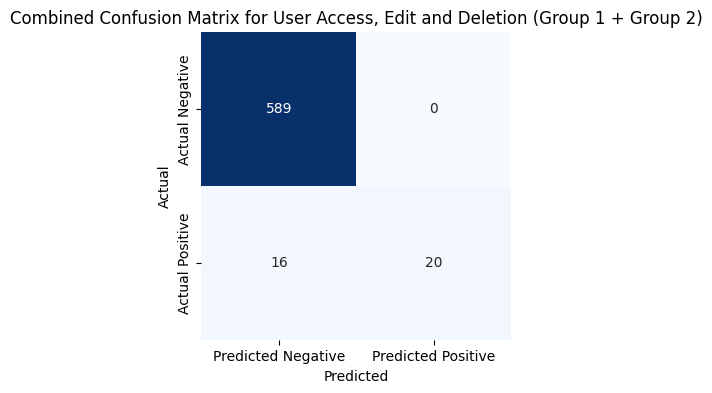


User Access, Edit and Deletion - Combined Confusion Matrix (Group 1 + Group 2):
TP: 20, FP: 0, FN: 16, TN: 589


{'G1': {'accuracy': 0.9582781456953643,
  'precision': 0.7913907284768212,
  'recall': 0.7913907284768212,
  'f1': 0.7913907284768213,
  'category_results': {'First Party Collection/Use': {'TP': 104,
    'FP': 48,
    'TN': 148,
    'FN': 2},
   'Third Party Sharing/Collection': {'TP': 44, 'FP': 6, 'TN': 245, 'FN': 7},
   'Other': {'TP': 44, 'FP': 3, 'TN': 209, 'FN': 46},
   'User Choice/Control': {'TP': 4, 'FP': 3, 'TN': 288, 'FN': 7},
   'Do Not Track': {'TP': 1, 'FP': 0, 'TN': 301, 'FN': 0},
   'International and Specific Audiences': {'TP': 15,
    'FP': 2,
    'TN': 284,
    'FN': 1},
   'Data Security': {'TP': 14, 'FP': 1, 'TN': 287, 'FN': 0},
   'Policy Change': {'TP': 11, 'FP': 0, 'TN': 291, 'FN': 0},
   'Data Retention': {'TP': 2, 'FP': 0, 'TN': 300, 'FN': 0},
   'User Access, Edit and Deletion': {'TP': 0, 'FP': 0, 'TN': 302, 'FN': 0}}},
 'G2': {'accuracy': 0.9662538699690403,
  'precision': 0.9601593625498008,
  'recall': 0.9014962593516209,
  'f1': 0.929903536977492,
  'categ

In [7]:
# Prompt 3
classifier = PrivacyPolicyClassifier(model_path=quantized_model_path)

prompt_template_3 = ("You are a highly specialized privacy policy classifier."
                   "As an expert in categorizing privacy policy texts your task is to accurately classify the provided text into the most suitable category."
                   "Additionally, ensure you consider whether multiple categories apply when necessary. Be thorough, and ensure that the output is clear and concise."
                   "Please use your expertise to categorize the provided privacy policy text into the following categories: First Party Collection/Use, Third Party Sharing/Collection, Other, User Choice/Control, Do Not Track, International and Specific Audiences, Data Security, Policy Change, Data Retention, User Access, Edit and Deletion.")



q_p3f11 = classifier.predict_and_evaluate(
    prompt_template=prompt_template_3, 
    test_data_path=test_data_path,
    num_test_data=num_entries,
    model_type=model_type,
    prompt_number=3
)

compute_confusion_matrix_technique1(q_p3f11)
compute_grouped_metrics(q_p3f11)

Unused kwargs: ['_load_in_4bit', '_load_in_8bit', 'quant_method']. These kwargs are not used in <class 'transformers.utils.quantization_config.BitsAndBytesConfig'>.
`low_cpu_mem_usage` was None, now set to True since model is quantized.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

/home/bhavani/.local/lib/python3.10/site-packages/transformers/generation/utils.py:1797: UserWarning: You are calling .generate() with the `input_ids` being on a device type different than your model's device. `input_ids` is on cpu, whereas the model is on cuda. You may experience unexpected behaviors or slower generation. Please make sure that you have put `input_ids` to the correct device by calling for example input_ids = input_ids.to('cuda') before running `.generate()`.
  warnings.warn(


Generated new tokens: Other
['▁Other']
Elapsed Time: 5.047068357467651
New tokens generated: 1
Tokens generated per second: 0.20 tokens/s
Predicted categories:['Other']
Privacy Policy Text: PRIVACY POLICY    Buffalo Wild Wings, Inc., its franchisees, marketing agencies, and affiliated contractors, as specifically identified here (collectively "BWW," "we" or "us"), appreciate your patronage and take your privacy very seriously. As a result, we've developed the following policy terms which apply to all websites and mobile applications owned and operated by BWW, specifically including the buffalowildwings.com site and the Fight4Fandom Mobile App (collectively the "Site(s)").
Actual Category: ['Other']
Predicted Categories: ['Other']

Generated new tokens: First Party Collection/Use
['▁First', '▁Party', '▁Collection', '/', 'Use']
Elapsed Time: 9.887661457061768
New tokens generated: 5
Tokens generated per second: 0.51 tokens/s
Predicted categories:['First Party Collection/Use']
Privacy Pol

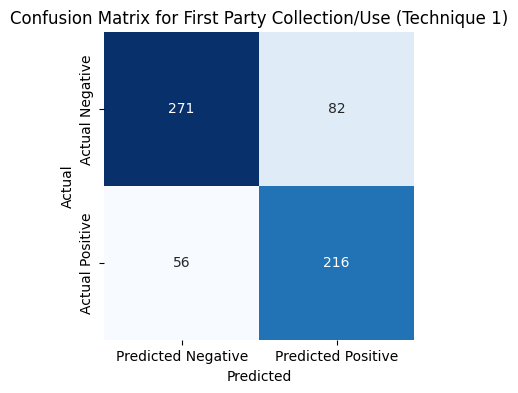


Plotting confusion matrix for category: Third Party Sharing/Collection


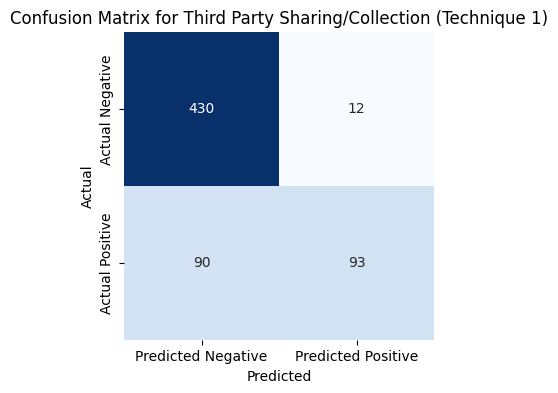


Plotting confusion matrix for category: Other


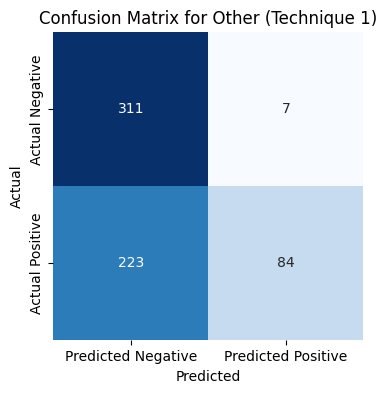


Plotting confusion matrix for category: User Choice/Control


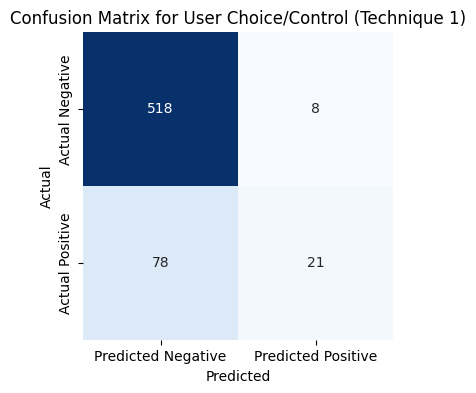


Plotting confusion matrix for category: Do Not Track


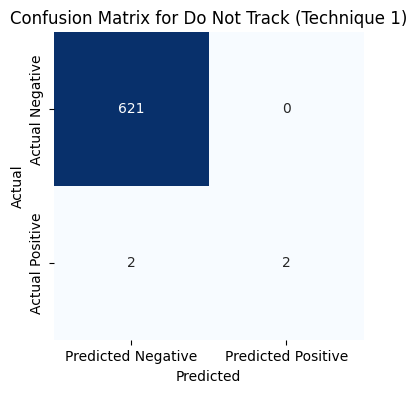


Plotting confusion matrix for category: International and Specific Audiences


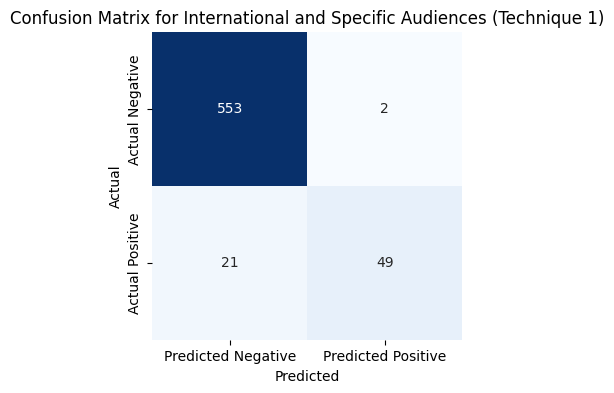


Plotting confusion matrix for category: Data Security


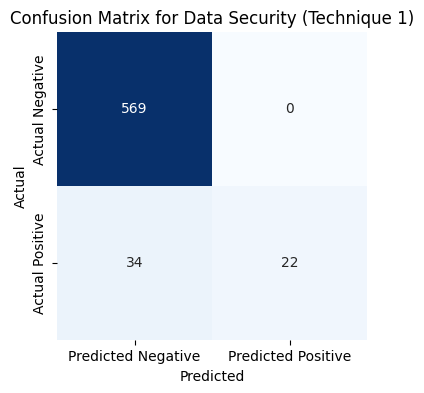


Plotting confusion matrix for category: Policy Change


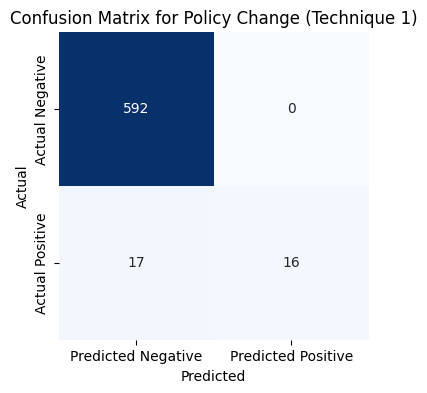


Plotting confusion matrix for category: Data Retention


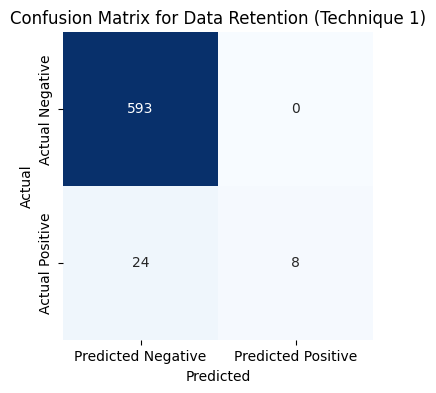


Plotting confusion matrix for category: User Access, Edit and Deletion


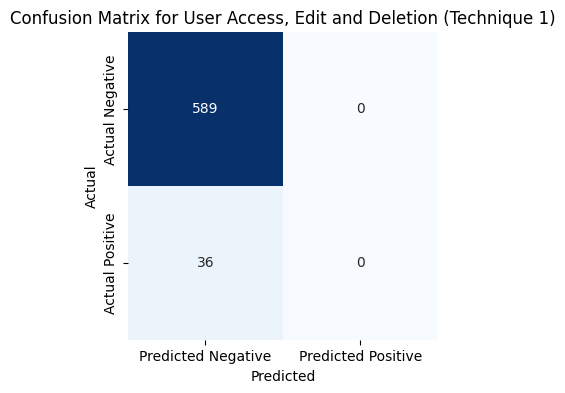


Overall tp: 511
Overall tn: 5047
Overall fp: 111
Overall fn: 581
Overall Precision (Technique 1): 0.8215434083601286
Overall Recall (Technique 1): 0.46794871794871795
Overall F1 Score (Technique 1): 0.5962660443407234
Overall Accuracy (Technique 1): 0.88928
TP 216
TN 271
FP 82
FN 56

TP 93
TN 430
FP 12
FN 90

TP 84
TN 311
FP 7
FN 223

TP 21
TN 518
FP 8
FN 78

TP 2
TN 621
FP 0
FN 2

TP 49
TN 553
FP 2
FN 21

TP 22
TN 569
FP 0
FN 34

TP 16
TN 592
FP 0
FN 17

TP 8
TN 593
FP 0
FN 24

TP 0
TN 589
FP 0
FN 36

Micro Precision: 0.8215434083601286
Micro Recall: 0.46794871794871795
Micro F1 Score: 0.5962660443407234
Micro Accuracy: 0.88928
Macro Precision: 0.8218545668316283
Macro Recall: 0.41157568433762926
Macro F1 Score: 0.5247711433570185
Weighted Precision: 0.8301916201645011
Weighted Recall: 0.46794871794871795
Weighted F1 Score: 0.5601729200184539
Sample Average Precision: 0.8152
Sample Average Recall: 0.5703377777777777
Sample Average F1 Score: 0.6392

Overall Metrics (Technique 1):
Accu

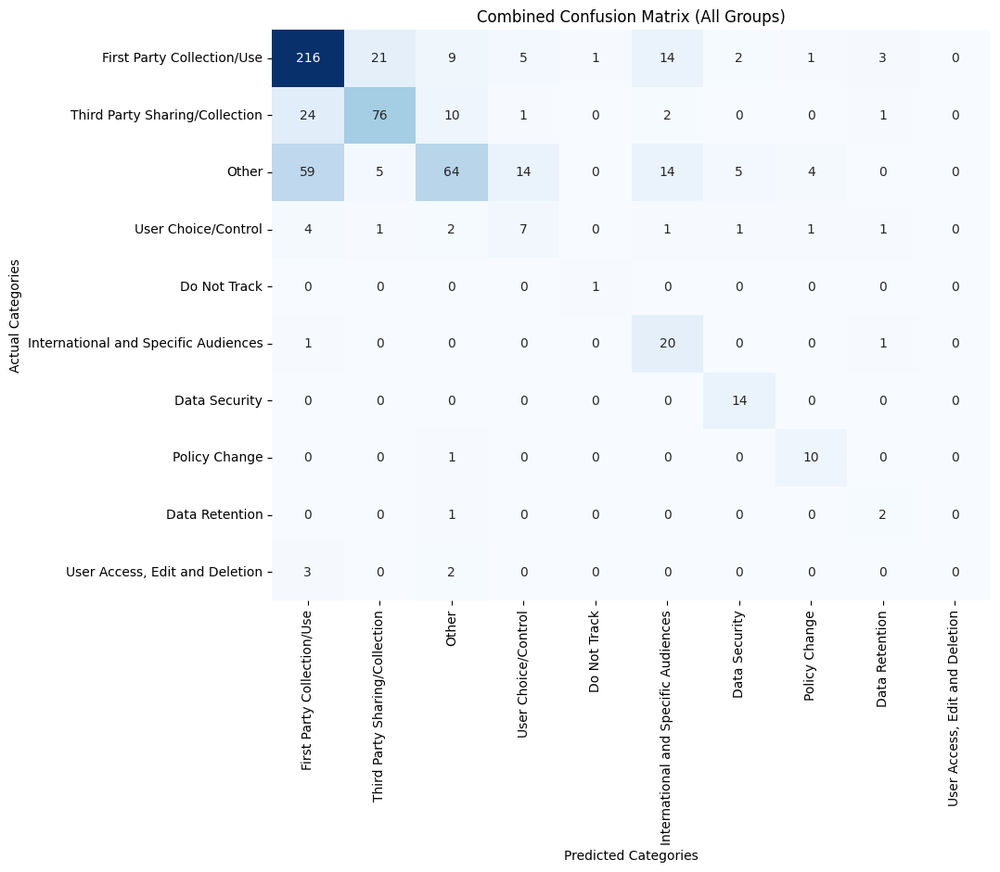


Metrics for Group 1:
Accuracy: 0.9568627450980393
Precision: 0.7843137254901961
Recall: 0.7843137254901961
F1 Score: 0.7843137254901961

Metrics for Group 2:
Accuracy: 0.9551724137931035
Precision: 0.9463548830811555
Recall: 0.8686868686868687
F1 Score: 0.9058591178406847

Confusion Matrices for Group 1:


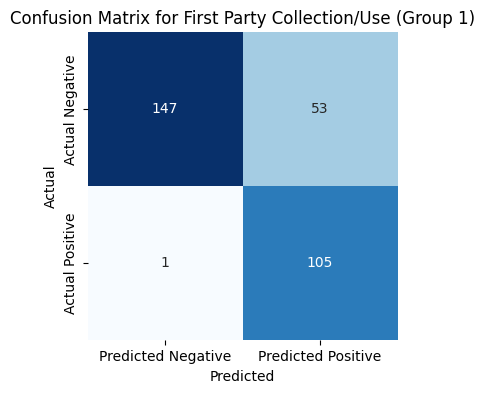

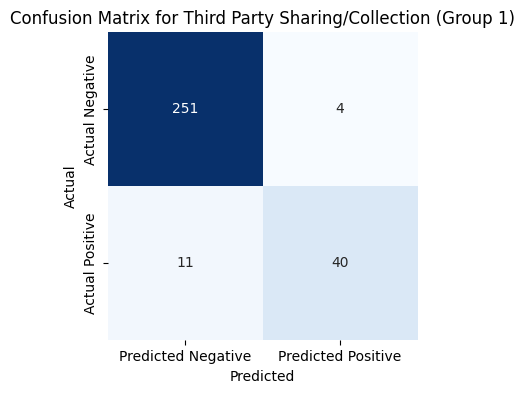

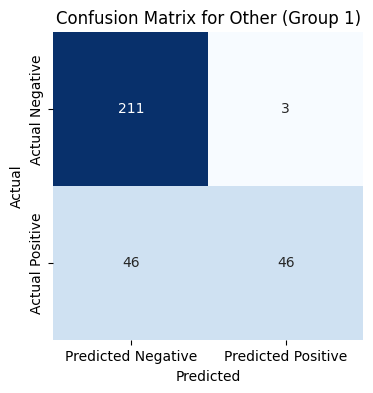

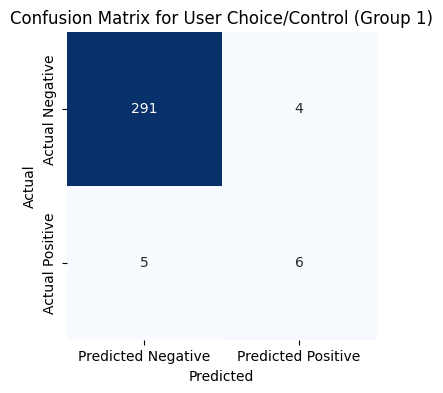

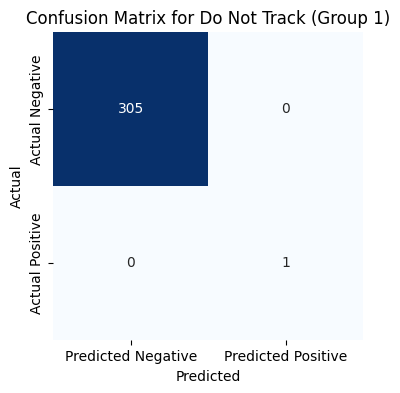

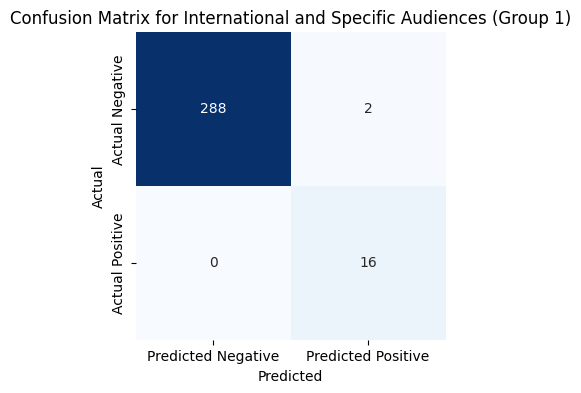

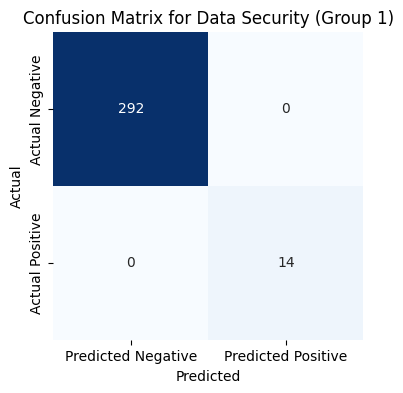

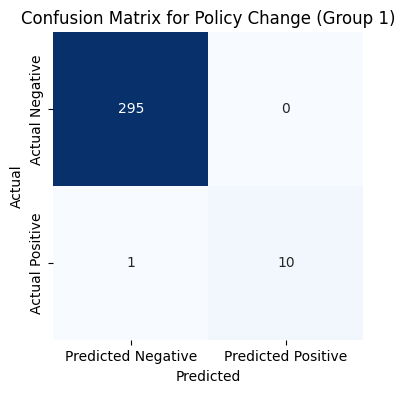

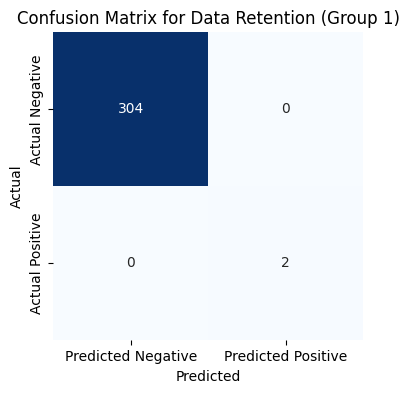

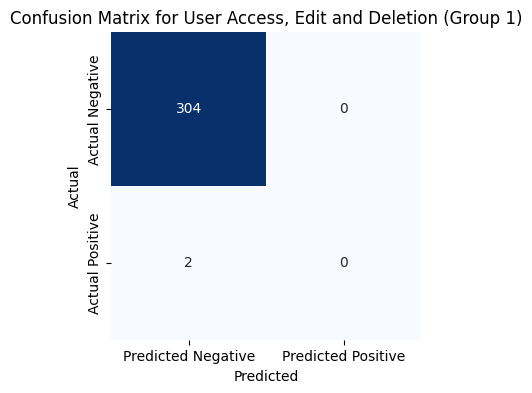


Confusion Matrices for Group 2:


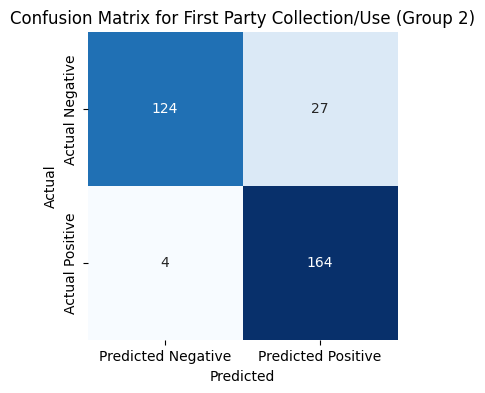

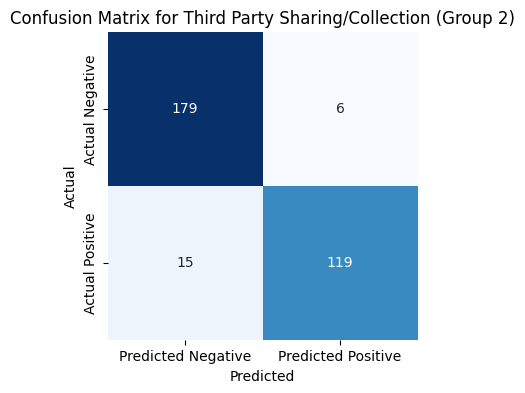

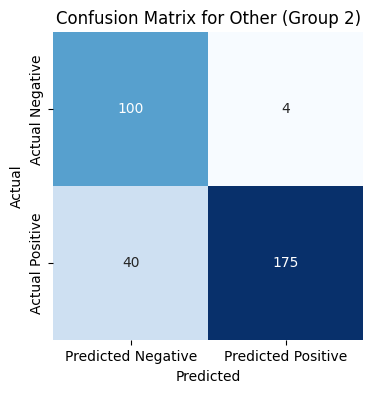

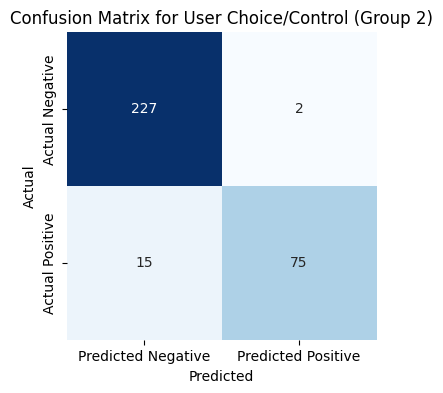

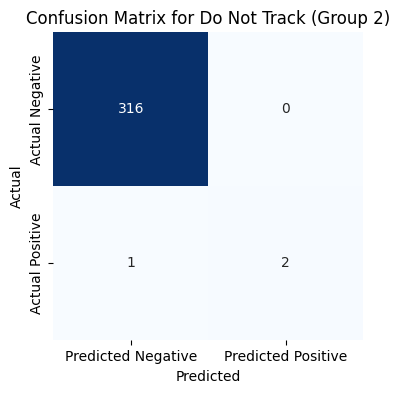

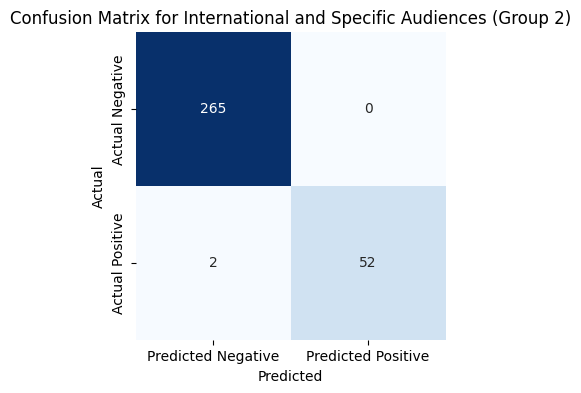

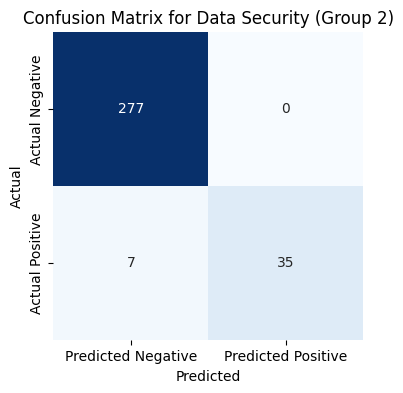

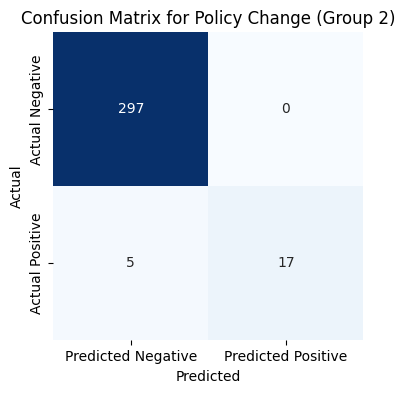

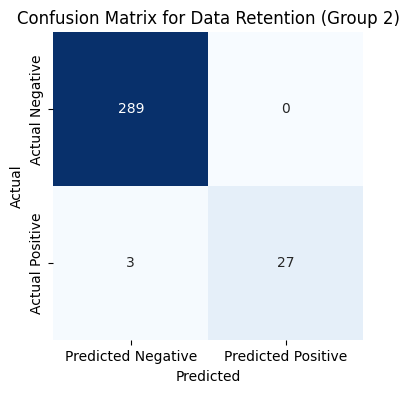

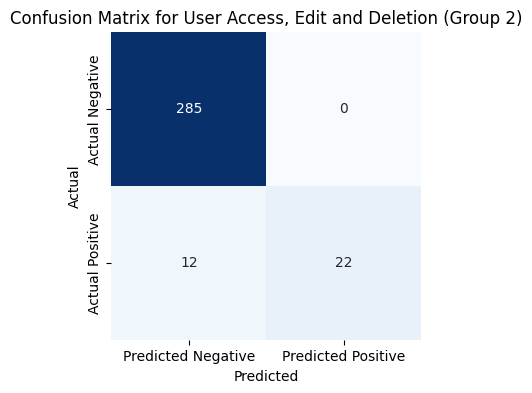


Computing combined overall metrics for Group 1 and Group 2...

Combined Metrics for Group 1 and Group 2:
Overall Accuracy: 0.956
Overall Precision: 0.8983543078412392
Overall Recall: 0.8451730418943534
Overall F1 Score: 0.8709526044110746
Combined Metrics -> Accuracy: 0.956, Precision: 0.8983543078412392, Recall: 0.8451730418943534, F1: 0.8709526044110746

Plotting combined confusion matrices for each category (Group 1 + Group 2)...


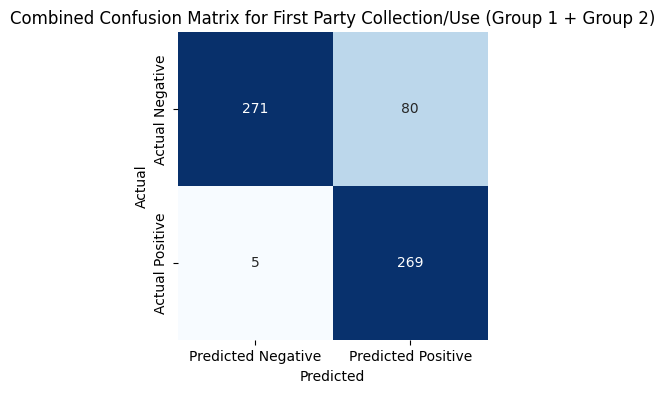


First Party Collection/Use - Combined Confusion Matrix (Group 1 + Group 2):
TP: 269, FP: 80, FN: 5, TN: 271


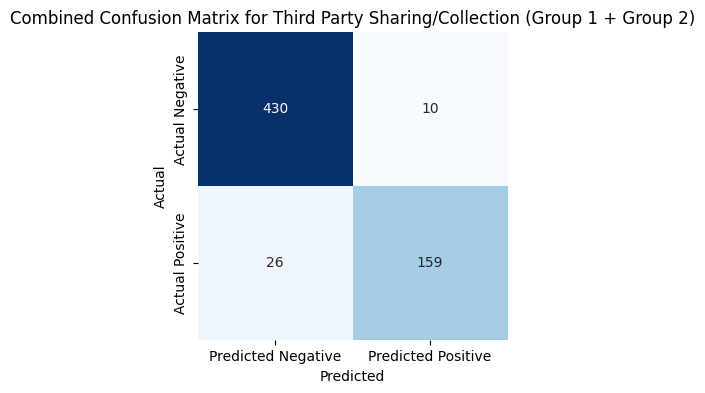


Third Party Sharing/Collection - Combined Confusion Matrix (Group 1 + Group 2):
TP: 159, FP: 10, FN: 26, TN: 430


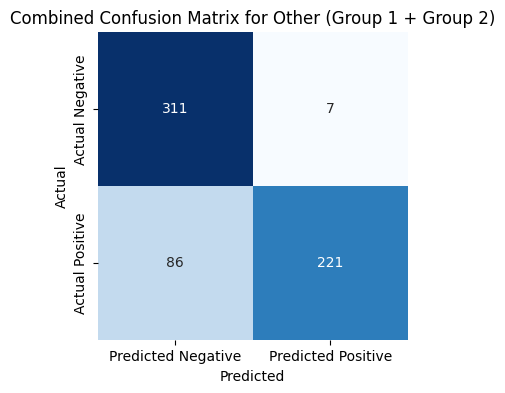


Other - Combined Confusion Matrix (Group 1 + Group 2):
TP: 221, FP: 7, FN: 86, TN: 311


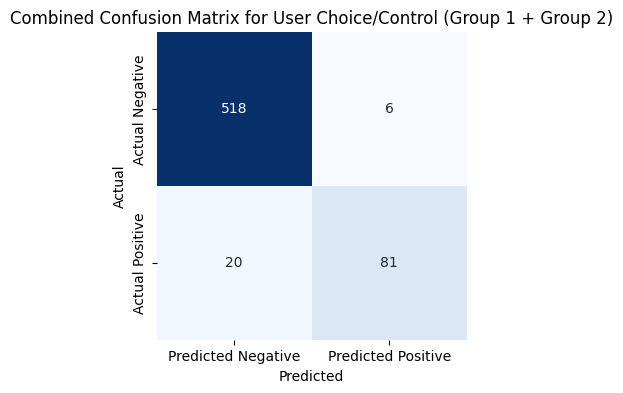


User Choice/Control - Combined Confusion Matrix (Group 1 + Group 2):
TP: 81, FP: 6, FN: 20, TN: 518


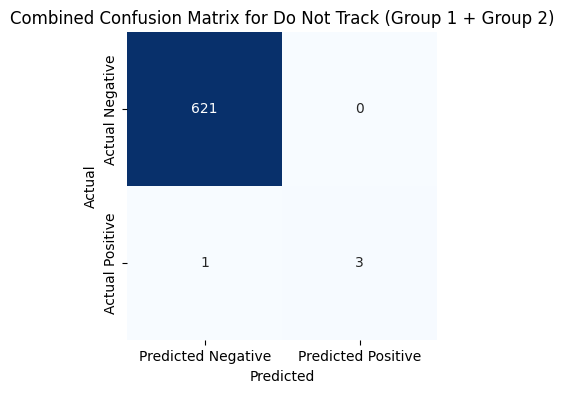


Do Not Track - Combined Confusion Matrix (Group 1 + Group 2):
TP: 3, FP: 0, FN: 1, TN: 621


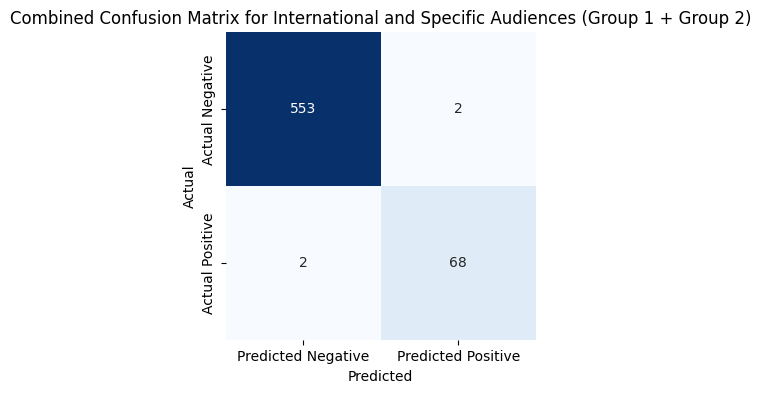


International and Specific Audiences - Combined Confusion Matrix (Group 1 + Group 2):
TP: 68, FP: 2, FN: 2, TN: 553


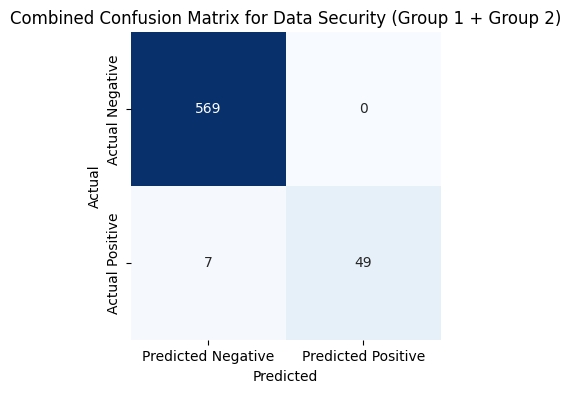


Data Security - Combined Confusion Matrix (Group 1 + Group 2):
TP: 49, FP: 0, FN: 7, TN: 569


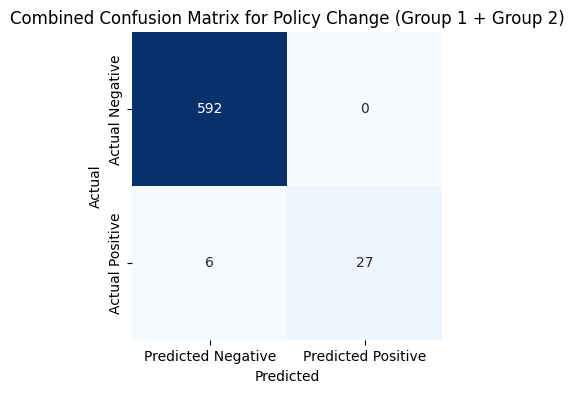


Policy Change - Combined Confusion Matrix (Group 1 + Group 2):
TP: 27, FP: 0, FN: 6, TN: 592


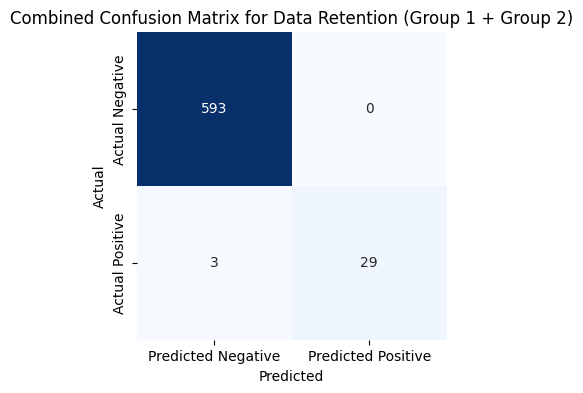


Data Retention - Combined Confusion Matrix (Group 1 + Group 2):
TP: 29, FP: 0, FN: 3, TN: 593


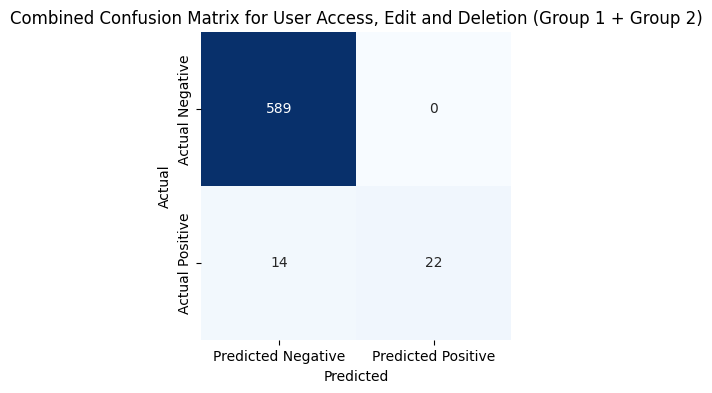


User Access, Edit and Deletion - Combined Confusion Matrix (Group 1 + Group 2):
TP: 22, FP: 0, FN: 14, TN: 589
New tokens list: [1, 5, 5, 5, 5, 5, 5, 5, 6, 6, 1, 2, 2, 6, 6, 6, 2, 5, 5, 5, 5, 5, 5, 1, 5, 6, 1, 1, 5, 5, 5, 5, 5, 5, 6, 5, 5, 1, 5, 5, 5, 5, 5, 2, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 1, 8, 6, 8, 8, 5, 3, 8, 5, 6, 5, 5, 1, 3, 2, 2, 2, 5, 2, 1, 5, 5, 5, 5, 5, 5, 6, 5, 5, 1, 6, 6, 2, 2, 6, 1, 6, 5, 1, 1, 1, 5, 5, 5, 5, 1, 6, 5, 5, 5, 5, 1, 5, 5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 5, 5, 6, 5, 6, 5, 6, 6, 1, 5, 5, 5, 5, 5, 2, 3, 1, 5, 6, 6, 5, 5, 6, 6, 2, 20, 5, 1, 5, 5, 1, 5, 6, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 5, 5, 5, 6, 6, 5, 5, 5, 5, 3, 2, 1, 6, 2, 1, 1, 1, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 3, 5, 5, 5, 1, 6, 6, 6, 1, 6, 6, 5, 6, 5, 6, 6, 6, 6, 5, 5, 5, 6, 6, 2, 6, 6, 6, 6, 6, 2, 5, 6, 5, 1, 1, 5, 1, 6, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 6, 5, 5, 6, 5, 8, 5, 1, 1, 2, 2, 5, 2, 6, 5, 5, 1, 5, 5, 5, 5, 5, 5, 6, 2, 5, 1, 5, 5, 5, 5, 5, 5, 1, 5, 5, 5, 5, 6, 6, 6, 6, 5, 5, 6, 6, 6, 5,

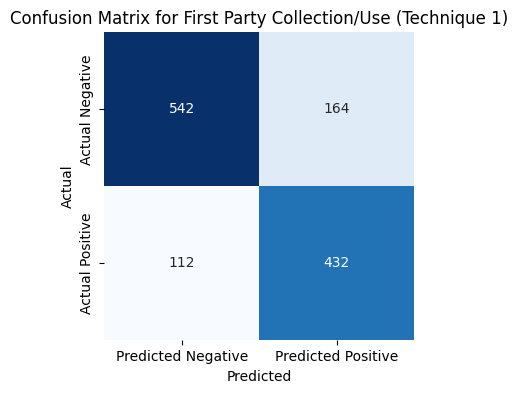


Plotting confusion matrix for category: Third Party Sharing/Collection


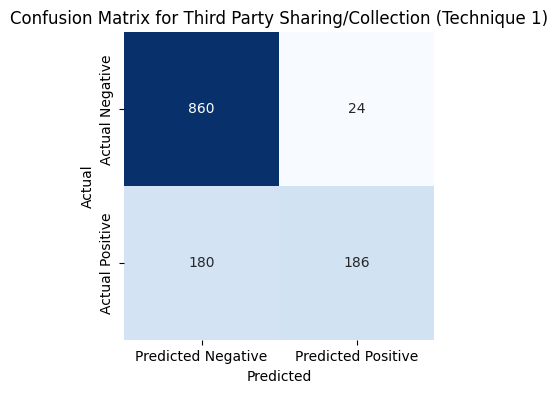


Plotting confusion matrix for category: Other


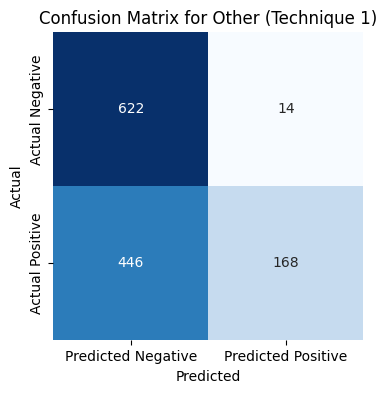


Plotting confusion matrix for category: User Choice/Control


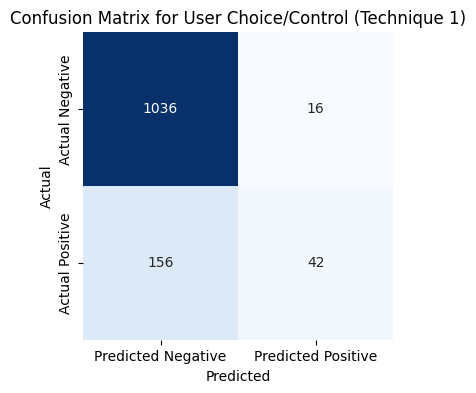


Plotting confusion matrix for category: Do Not Track


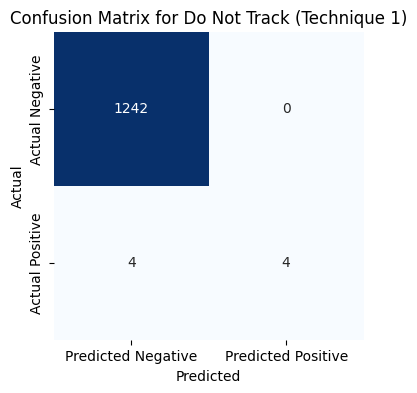


Plotting confusion matrix for category: International and Specific Audiences


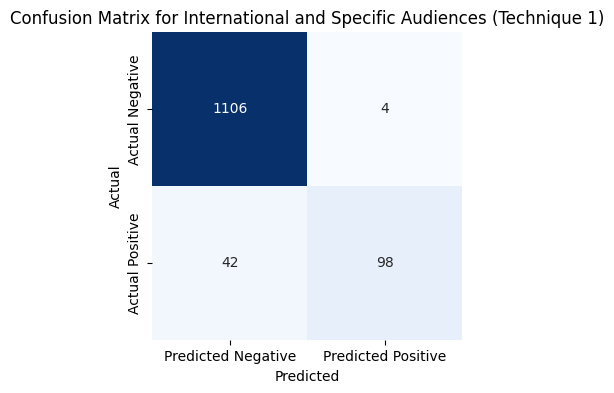


Plotting confusion matrix for category: Data Security


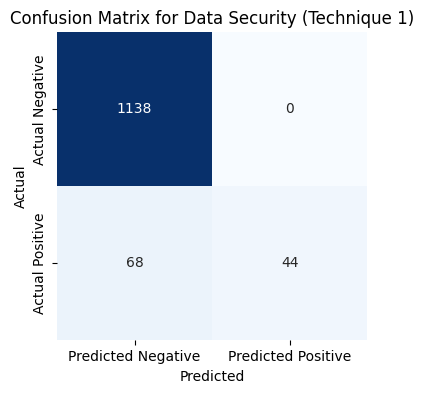


Plotting confusion matrix for category: Policy Change


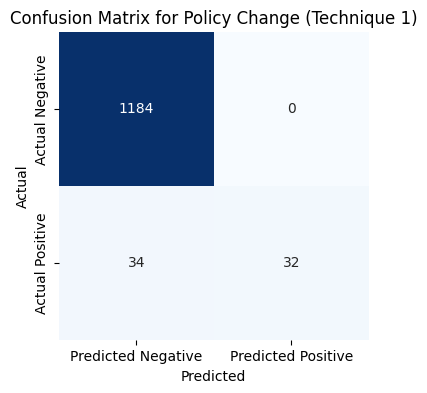


Plotting confusion matrix for category: Data Retention


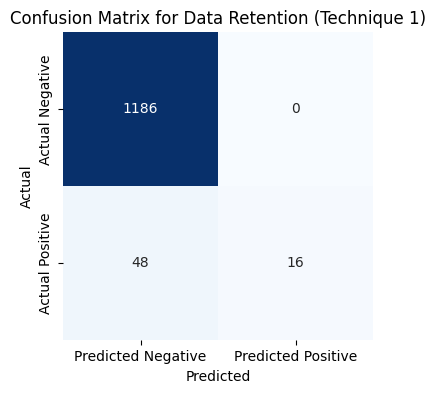


Plotting confusion matrix for category: User Access, Edit and Deletion


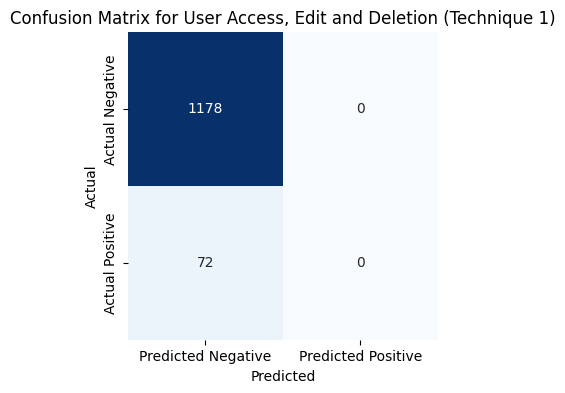


Overall tp: 1022
Overall tn: 10094
Overall fp: 222
Overall fn: 1162
Overall Precision (Technique 1): 0.8215434083601286
Overall Recall (Technique 1): 0.46794871794871795
Overall F1 Score (Technique 1): 0.5962660443407234
Overall Accuracy (Technique 1): 0.88928
TP 432
TN 542
FP 164
FN 112

TP 186
TN 860
FP 24
FN 180

TP 168
TN 622
FP 14
FN 446

TP 42
TN 1036
FP 16
FN 156

TP 4
TN 1242
FP 0
FN 4

TP 98
TN 1106
FP 4
FN 42

TP 44
TN 1138
FP 0
FN 68

TP 32
TN 1184
FP 0
FN 34

TP 16
TN 1186
FP 0
FN 48

TP 0
TN 1178
FP 0
FN 72

Micro Precision: 0.8215434083601286
Micro Recall: 0.46794871794871795
Micro F1 Score: 0.5962660443407234
Micro Accuracy: 0.88928
Macro Precision: 0.8218545668316283
Macro Recall: 0.41157568433762926
Macro F1 Score: 0.5247711433570185
Weighted Precision: 0.8301916201645011
Weighted Recall: 0.46794871794871795
Weighted F1 Score: 0.5601729200184539
Sample Average Precision: 0.8152
Sample Average Recall: 0.5703377777777777
Sample Average F1 Score: 0.6392

Overall Metrics 

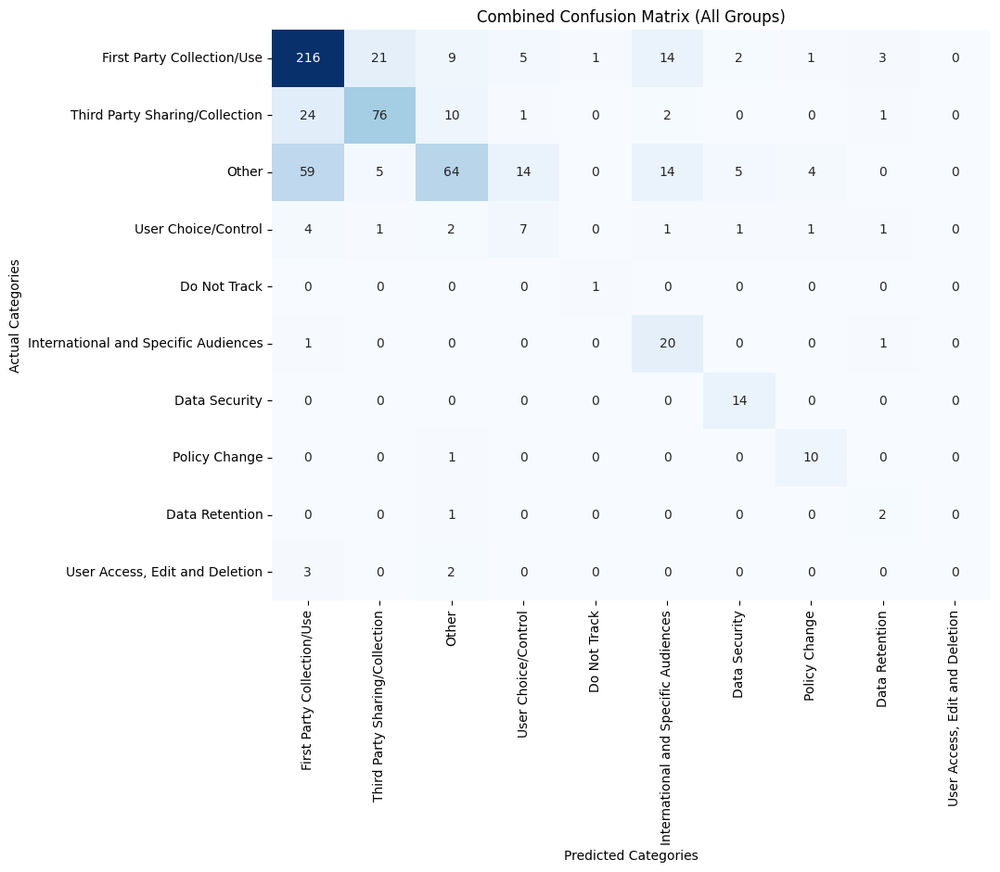


Metrics for Group 1:
Accuracy: 0.9568627450980393
Precision: 0.7843137254901961
Recall: 0.7843137254901961
F1 Score: 0.7843137254901961

Metrics for Group 2:
Accuracy: 0.9551724137931035
Precision: 0.9463548830811555
Recall: 0.8686868686868687
F1 Score: 0.9058591178406847

Confusion Matrices for Group 1:


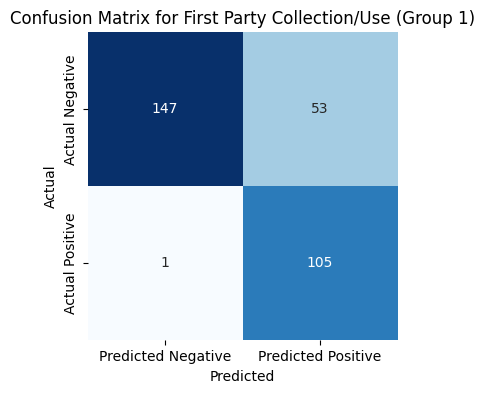

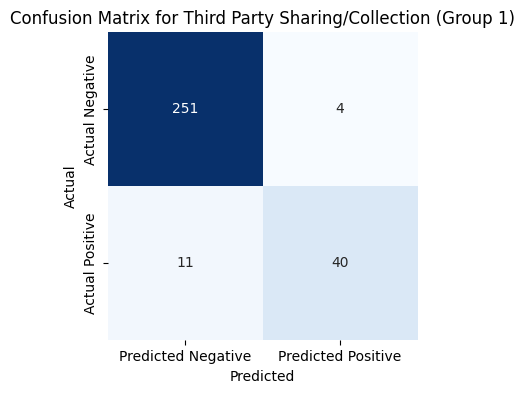

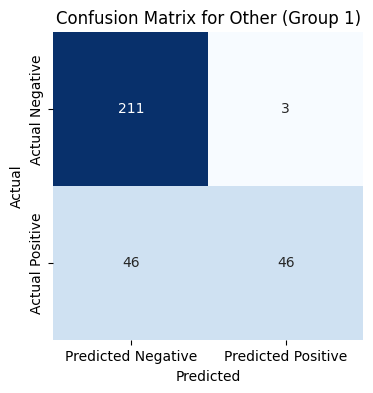

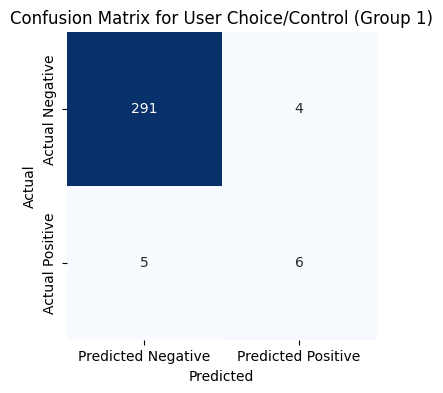

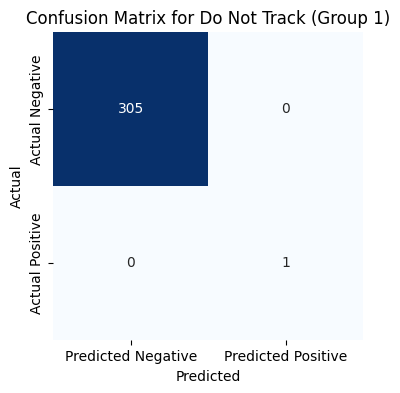

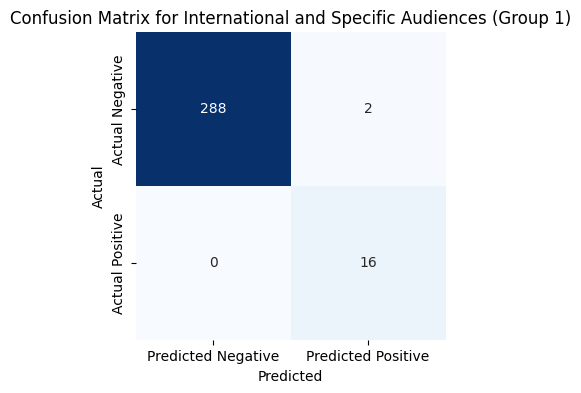

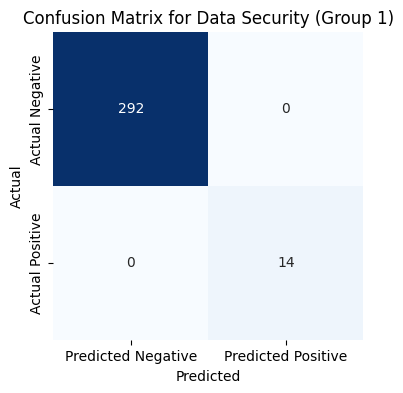

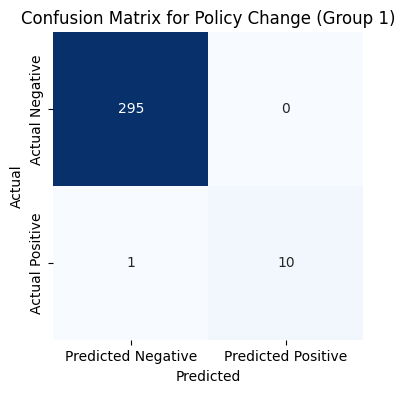

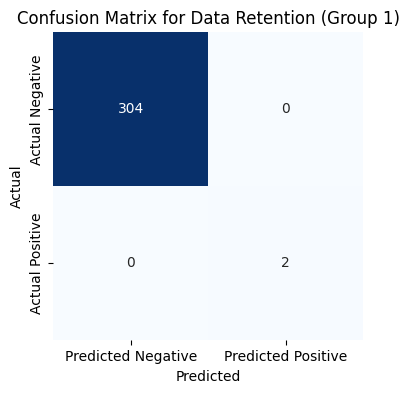

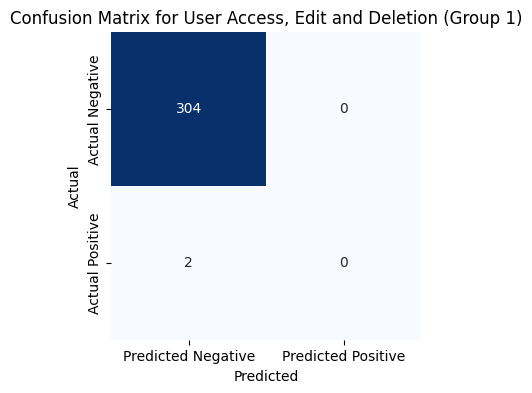


Confusion Matrices for Group 2:


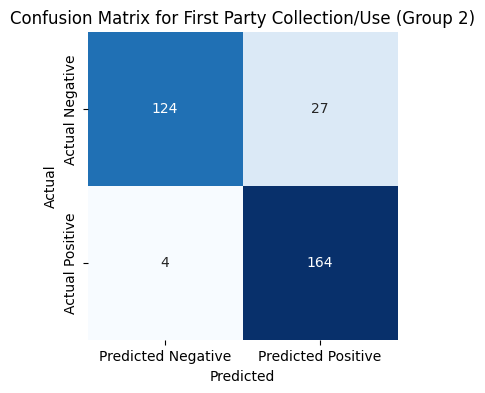

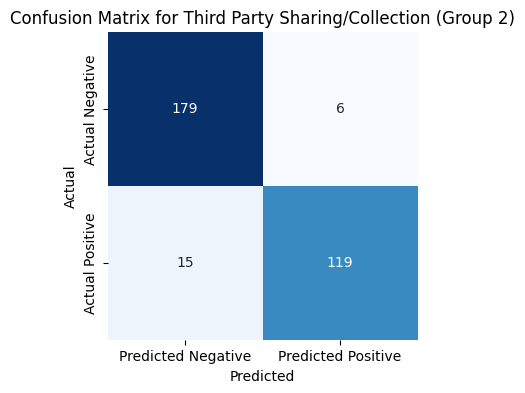

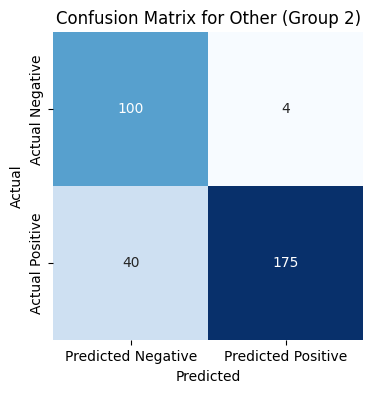

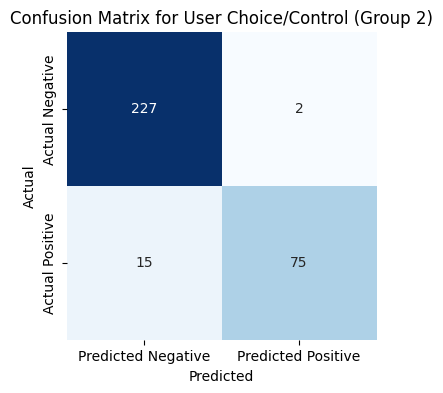

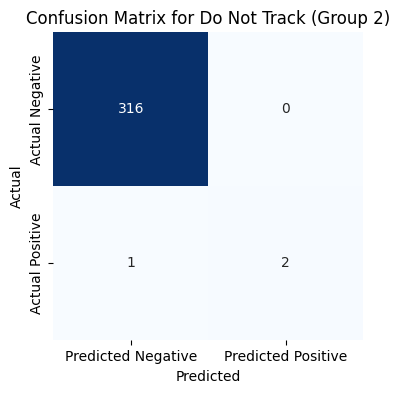

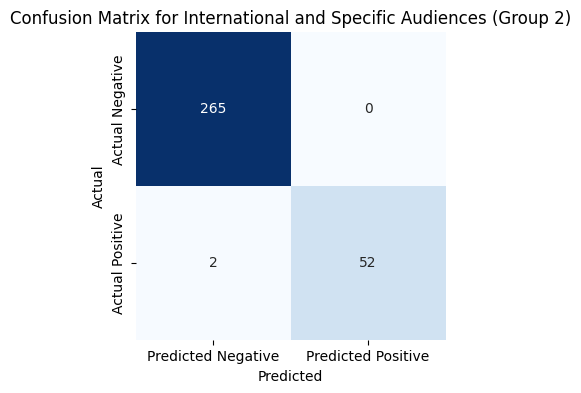

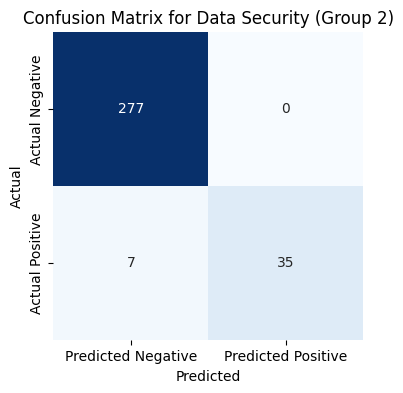

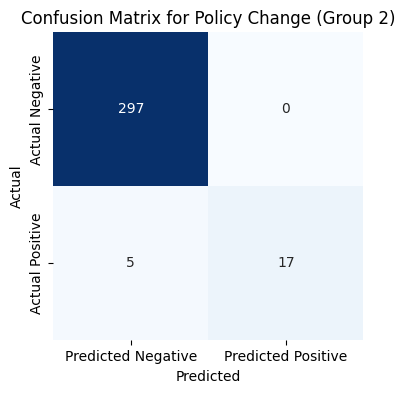

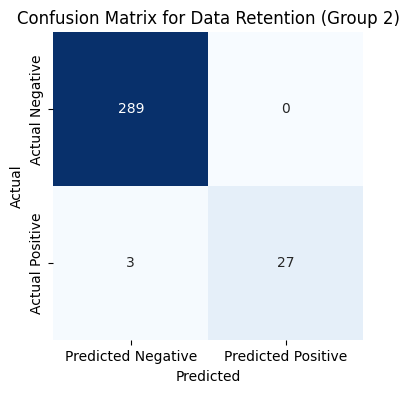

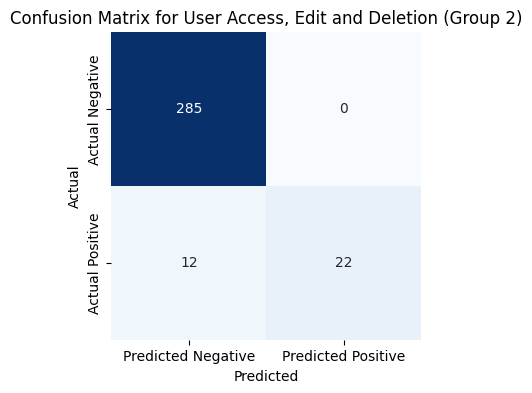


Computing combined overall metrics for Group 1 and Group 2...

Combined Metrics for Group 1 and Group 2:
Overall Accuracy: 0.956
Overall Precision: 0.8983543078412392
Overall Recall: 0.8451730418943534
Overall F1 Score: 0.8709526044110746
Combined Metrics -> Accuracy: 0.956, Precision: 0.8983543078412392, Recall: 0.8451730418943534, F1: 0.8709526044110746

Plotting combined confusion matrices for each category (Group 1 + Group 2)...


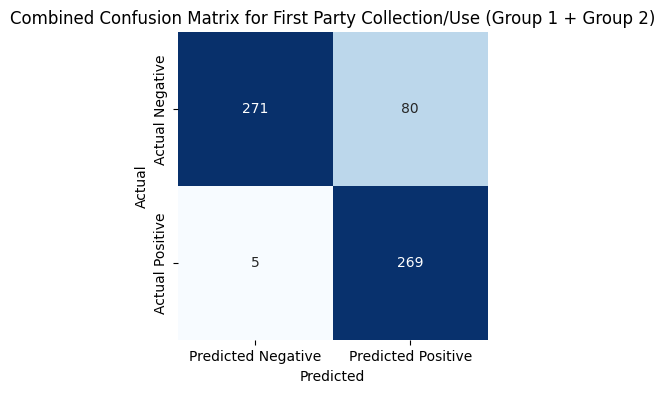


First Party Collection/Use - Combined Confusion Matrix (Group 1 + Group 2):
TP: 269, FP: 80, FN: 5, TN: 271


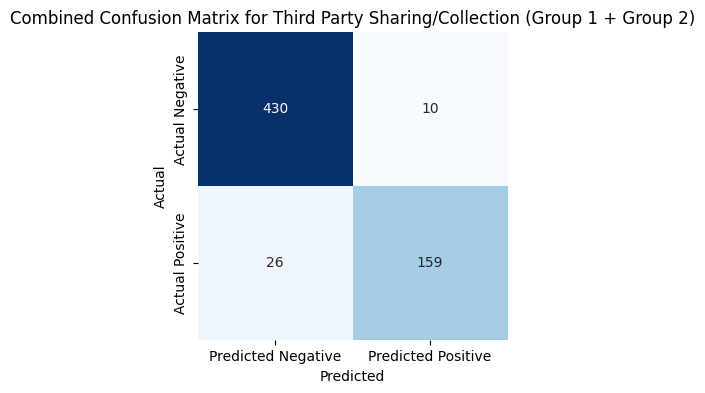


Third Party Sharing/Collection - Combined Confusion Matrix (Group 1 + Group 2):
TP: 159, FP: 10, FN: 26, TN: 430


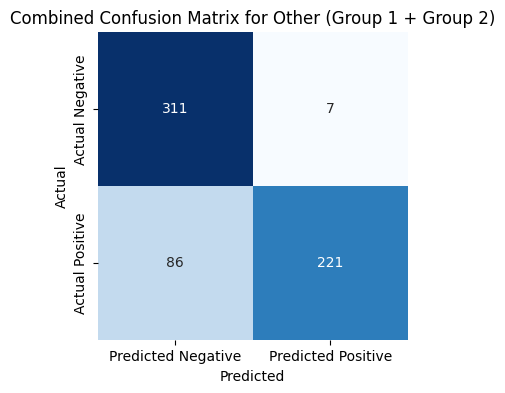


Other - Combined Confusion Matrix (Group 1 + Group 2):
TP: 221, FP: 7, FN: 86, TN: 311


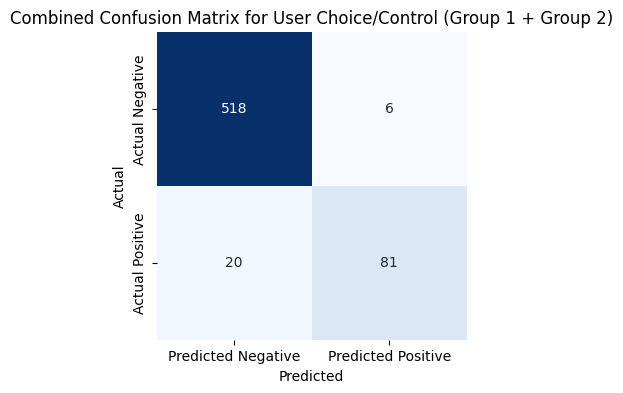


User Choice/Control - Combined Confusion Matrix (Group 1 + Group 2):
TP: 81, FP: 6, FN: 20, TN: 518


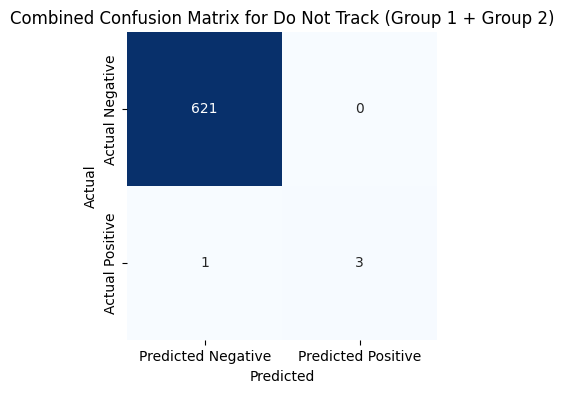


Do Not Track - Combined Confusion Matrix (Group 1 + Group 2):
TP: 3, FP: 0, FN: 1, TN: 621


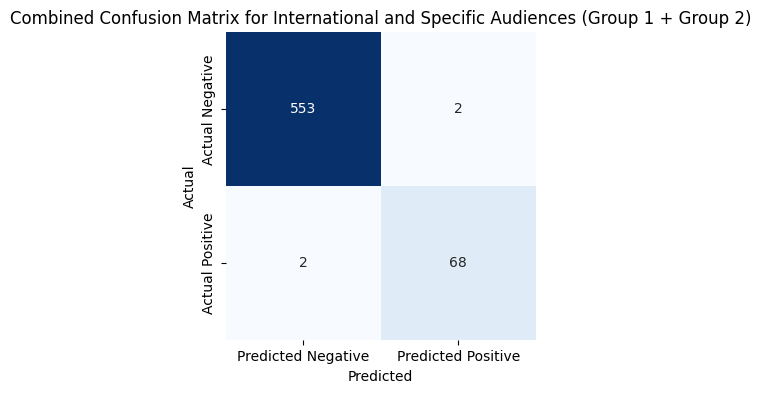


International and Specific Audiences - Combined Confusion Matrix (Group 1 + Group 2):
TP: 68, FP: 2, FN: 2, TN: 553


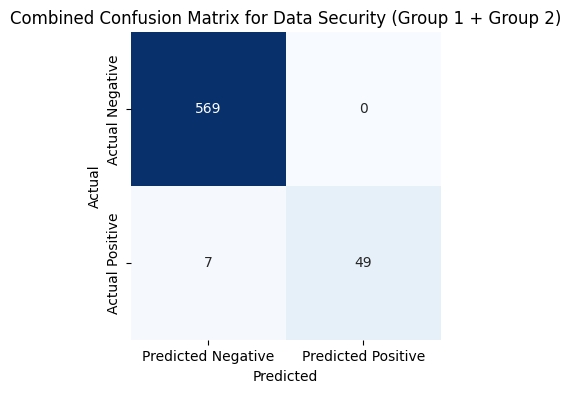


Data Security - Combined Confusion Matrix (Group 1 + Group 2):
TP: 49, FP: 0, FN: 7, TN: 569


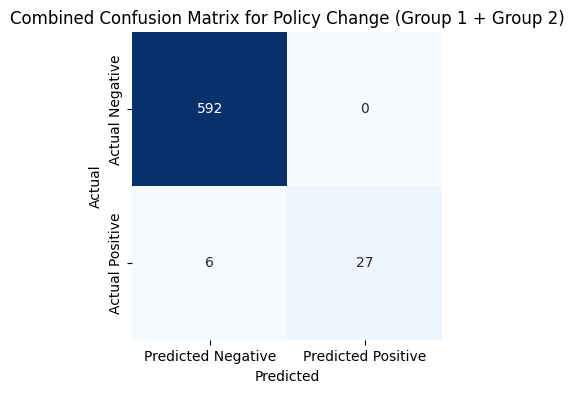


Policy Change - Combined Confusion Matrix (Group 1 + Group 2):
TP: 27, FP: 0, FN: 6, TN: 592


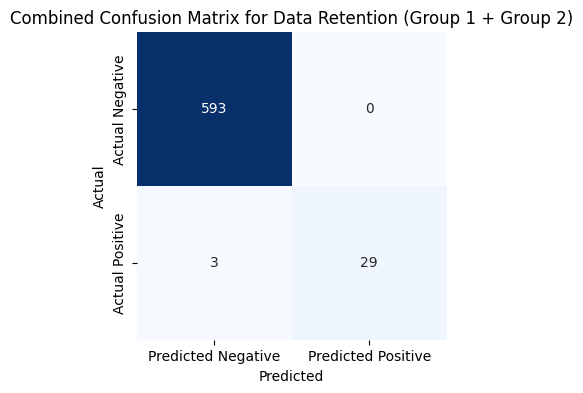


Data Retention - Combined Confusion Matrix (Group 1 + Group 2):
TP: 29, FP: 0, FN: 3, TN: 593


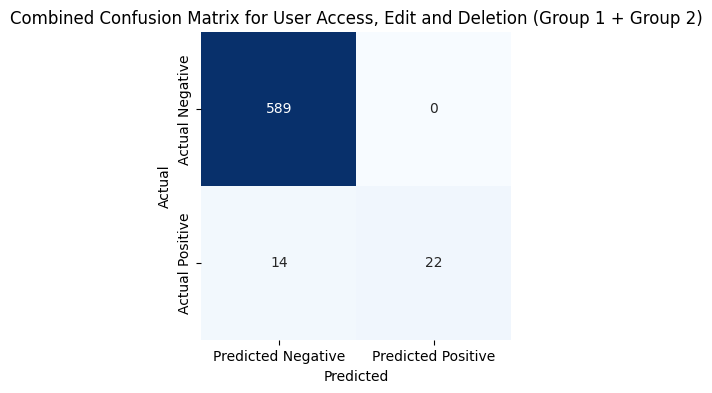


User Access, Edit and Deletion - Combined Confusion Matrix (Group 1 + Group 2):
TP: 22, FP: 0, FN: 14, TN: 589


{'G1': {'accuracy': 0.9568627450980393,
  'precision': 0.7843137254901961,
  'recall': 0.7843137254901961,
  'f1': 0.7843137254901961,
  'category_results': {'First Party Collection/Use': {'TP': 105,
    'FP': 53,
    'TN': 147,
    'FN': 1},
   'Third Party Sharing/Collection': {'TP': 40, 'FP': 4, 'TN': 251, 'FN': 11},
   'Other': {'TP': 46, 'FP': 3, 'TN': 211, 'FN': 46},
   'User Choice/Control': {'TP': 6, 'FP': 4, 'TN': 291, 'FN': 5},
   'Do Not Track': {'TP': 1, 'FP': 0, 'TN': 305, 'FN': 0},
   'International and Specific Audiences': {'TP': 16,
    'FP': 2,
    'TN': 288,
    'FN': 0},
   'Data Security': {'TP': 14, 'FP': 0, 'TN': 292, 'FN': 0},
   'Policy Change': {'TP': 10, 'FP': 0, 'TN': 295, 'FN': 1},
   'Data Retention': {'TP': 2, 'FP': 0, 'TN': 304, 'FN': 0},
   'User Access, Edit and Deletion': {'TP': 0, 'FP': 0, 'TN': 304, 'FN': 2}}},
 'G2': {'accuracy': 0.9551724137931035,
  'precision': 0.9463548830811555,
  'recall': 0.8686868686868687,
  'f1': 0.9058591178406847,
  'cat

In [8]:
# Prompt 4
classifier = PrivacyPolicyClassifier(model_path=quantized_model_path)

# Define the prompt template
prompt_template_4 = ("As a privacy policy classification AI, your task is to classify sections of privacy policies into one or more categories based on the information provided."
                   "You are specialized in identifying the right category or multiple categories from complex privacy policy texts." 
                   "Ensure that your classifications are accurate, comprehensive, and consistent with the provided privacy policy excerpt."
                   "Based on the provided privacy policy text, please classify it into the following categories:"
                   "First Party Collection/Use, Third Party Sharing/Collection, Other, User Choice/Control, Do Not Track, International and Specific Audiences, Data Security, Policy Change, Data Retention, User Access, Edit and Deletion."
                   "Make sure to account for situations where multiple categories might apply.")

q_p4f11 = classifier.predict_and_evaluate(
    prompt_template=prompt_template_4, 
    test_data_path=test_data_path,
    num_test_data=num_entries,
    model_type=model_type,
    prompt_number=4
)

compute_confusion_matrix_technique1(q_p4f11)
compute_grouped_metrics(q_p4f11)